In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse as sps
from scipy.ndimage import gaussian_filter
from scipy import stats
import seaborn as sns
from matplotlib import gridspec
import os
from manifold_functions import *
from scipy.spatial import distance
from sklearn.metrics.pairwise import cosine_distances, euclidean_distances, cosine_similarity
import re
from scipy.stats import pearsonr

color_dic = {'PRE':'midnightblue', 
             'SAM':'lightseagreen', 
             'CHO':'deepskyblue',
             'Trajectory':'lightgrey',
             'Startbox':'red',
             'SW1':'turquoise', 
             'SW2':'Darkblue', 
             'SW3':'Mediumseagreen', 'A01':'green', 'A02':'magenta', 'P01':'blue', 'P02':'orange'} 

aniSESSIONS = {'H2202':['A01', 'A02', 'P01', 'P02'],
               'H2203':['A01', 'A02', 'P01', 'P02'],
               'H0465':['A01', 'A02', 'P01', 'P02'],
               'H0466':['A01', 'A02', 'P01', 'P02'],
               'H0493':['A01', 'A02', 'P01'],
               'H0487':['A01', 'A02']}
               
STAGES = {'A01':['PRE', 'SAM', 'CHO'], 
          'A02':['PRE', 'SAM', 'CHO'], 
          'P01':['PRE', 'SAM', 'CHO', 'PRO'], 
          'P02':['PRE', 'SAM', 'CHO', 'PRO']}

In [3]:
#Load data
ANIMALS = ['H0466', 'H2202','H2203','H0493', 'H0465']
#-------------------------------------------------------------------------------------------
#Path to data directory (dataDir is the only one that needs adapting)
codeDir = os.getcwd()
len2del = sum([len(i) for i in codeDir.split('/')[-2:]])+1
homeDir = codeDir[:-len2del]
dataDir = codeDir[:-sum([len(i) for i in codeDir.split('/')[-3:]])-2] + 'animal_data/'

SaveTo3 = homeDir+'Figures/Figure 3 Manifolds/' #Where to save figures
TRIALS = pd.read_csv(homeDir + "Data/Trial_breakdown.csv")

In [9]:
def isolate_trials(TRIALS, animal, session, stage):
    #Use only correct trials for SAM CHO
    session_trials = TRIALS[(TRIALS['Animal'] == animal) &
                            (TRIALS['Session'] == session) &
                            (TRIALS['Stage'].isin([stage]))]
    out_start = session_trials['Trial start corrected'].values.astype(int)*20
    in_end = session_trials['Trial end corrected'].values.astype(int)*20
    trials = np.array([np.arange(i,j,1) for i,j in zip(out_start, in_end)])
    correct_trials = session_trials[session_trials['Correctness']<=2]['Trial'].values
    trial_idxs = individual_trials(trials, correct_trials)
    all_correct_trials = [item for sublist in [trials[i] for i in range(len(trials)) if i in correct_trials] for item in sublist]   
    return all_correct_trials

def individual_trials(trials, correct_trials):
    #Extract indexes coordinates for individual trials
    trial_idxs = []
    start_idx = 0
    for t in range(len(trials)):
        if t in correct_trials:
            trial_idxs.append(np.arange(start_idx,start_idx+len(trials[t]),1))
            start_idx+=len(trials[t]) 
    return trial_idxs

def trial_cells(animal, meta, traces, st_cells, trials, correct_trials, rw, tb, status = "Correct"):
    ID_dic = {'A01':str(1),'A02':str(2),'P01':str(3), 'P02':str(4),'SAM':str(1), 'CHO':str(2)}
    #Loop through correct_trials
    for trial in range(len(correct_trials)):
        #Define trial variables
        cells = traces.columns
        t_meta = meta.loc[trials[correct_trials[trial]]]
        t_decoder_df = t_meta.copy()
        t_x = t_decoder_df['x'].values
        t_y = t_decoder_df['y'].values
        t_mov = t_decoder_df['Movement status'].values
        t_decoder_df.index = range(len(t_decoder_df.index))
        t_loc = ['Arena']*len(t_decoder_df)
        t_loc[:tb] = ['SB']*tb
        t_identifier = int(ID_dic[meta['Session'].values[0]] + ID_dic[meta['Stage'].values[0]] + str(correct_trials[trial]))
        t_decoder_df = t_decoder_df[['position']+st_cells]
        
        if status == "Incorrect":
            t_decoder_df.insert(loc=0, column='Reward Well', value = rw)
        else:
           t_decoder_df.insert(loc=9, column='Reward Well', value = rw)

        t_decoder_df.insert(loc=0, column='Animal', value = animal)     
        t_decoder_df.insert(loc=1, column='Identifier', value = t_identifier)
        t_decoder_df.insert(loc=2, column='Session', value = meta['Session'].values[0])
        t_decoder_df.insert(loc=3, column='Stage', value = meta['Stage'].values[0])
        t_decoder_df.insert(loc=4, column='Trial', value = correct_trials[trial])
        t_decoder_df.insert(loc=5, column='Status', value = status)
        t_decoder_df.insert(loc=6, column='Location', value = t_loc)
        t_decoder_df.insert(loc=7, column='x', value = t_x)
        t_decoder_df.insert(loc=8, column='y', value = t_y)
        t_decoder_df.insert(loc=9, column='Movement', value = t_mov)

        if trial == 0:
            trial_decoder_df = t_decoder_df
        else:
            trial_decoder_df = trial_decoder_df.append(t_decoder_df)
            
    return trial_decoder_df

def trial_activity(meta, TRIALS, animal, session, stage, t_startbox=10):
    st_cells = [i for i in meta.columns if i.startswith(' C')] #Stage cells
    traces = meta[st_cells] # Traces
    traces = traces.dropna(axis=1, how='all')
    cells = np.array(traces.columns)

    #--------------------------
    #Create individual trials for analysis
    tb = 20*t_startbox; ta = 0 #time before (tb) and after (ta) trial to consider
    session_trials = TRIALS[(TRIALS['Animal'] == animal) & 
                            (TRIALS['Session'] == session) &
                            (TRIALS['Stage'] == stage)]
    out_start = session_trials['Trial start corrected'].values.astype(int)*20
    out_start = [i-tb for i in out_start]
    in_end = (session_trials['Trial end corrected'].values.astype(int)*20)
    trials = np.array([np.arange(i,j,1) for i,j in zip(out_start, in_end)])
    len_trials = [len(i)/20 for i in trials]

    #Assign reward location & list of other possible locations
    rw = int(np.array(meta['well'])[0][-1]) 
    non_rw = [i for i in [1,2,3] if i != rw]

    #Define which trials are "correct"
    correct_trials = session_trials[session_trials['Correctness']<=1]['Trial'].values
    incorrect_trials = session_trials[session_trials['Correctness']>3]['Trial'].values
    trial_idxs = individual_trials(trials, correct_trials)
    all_correct_trials = [item for sublist in [trials[i] for i in range(len(trials)) if i in correct_trials] for item in sublist]   
    all_incorrect_trials = [item for sublist in trials[incorrect_trials] for item in sublist]    

    #Extract SB activity for correct trials
    trial_SB_activity_c = trial_cells(animal, meta,traces,st_cells, trials, correct_trials, 
                                      rw, tb, status = "Correct")
    
    return trial_SB_activity_c

def sort_cell_max(X, SB_cells):
    X = X[SB_cells].values.T
    X[X > 0] = 1 #Binarize
    X = np.array([x/np.max(x) for x in X])
    X_sm = gaussian_filter1d(X, sigma=4) 
    X_sm = np.array([x/np.max(x) for x in X_sm])
    fr_max = [np.argmax(x) for x in X_sm]
    
    #Sort by maximum
    fr_max = pd.DataFrame({'Cell':SB_cells, 'Max':fr_max})
    fr_ord = fr_max.sort_values('Max')
    SB_cells_sorted = fr_ord['Cell'].values
    X = X[fr_ord.index]
    return X, SB_cells_sorted, fr_ord

def sb_cells_ordered(SB_activity, SB_cells):
    cell_ts = pd.DataFrame({'Cell':[], 'Timestamp':[]})
    for cell in SB_activity[SB_cells].columns:
        ts = [i for i, e in enumerate(SB_activity[cell]) if e >0]
        cell_ts = cell_ts.append(pd.DataFrame({'Cell':cell, 'Timestamp':ts}))
    ts_ord = cell_ts.sort_values('Timestamp')
    return ts_ord

def plot_SB_activity(X, animal, session, stage, trial, t_startbox):
    fig = plt.figure(figsize=(3,1))
    plt.imshow(X, cmap='viridis', aspect='auto', extent=[-t_startbox,0, len(X),0])
    plt.title(animal + '\n' + session + ' ' + stage + ' ' + str(trial))
    plt.xlabel('Time (s) before leaving SB')
    plt.ylabel('SB Neurons')
    plt.show()
    return 

def manifold_plot(colb, cat, X,  y, saveto, animal, title, save=False):
    
    fig = plt.figure(figsize=(12,12))
    grid = fig.add_gridspec(ncols=3, nrows=3)
    plt.suptitle(title)

    # 3D projection
    ax = fig.add_subplot(grid[1:,:], projection='3d')
    for color, i in zip(colb, cat):
        ax.scatter(X[y == i:,0], X[y == i:,1], X[y == i:,2], c=color, label=i, alpha=0.7, s=5)
    ax.grid(False)
    plt.legend(frameon=False)

    # Comp1 vs Comp2
    ax = fig.add_subplot(grid[0,0])
    for color, i in zip(colb, cat):
        ax.scatter(X[y == i:,0], X[y == i:,1], c=color, label=i, alpha=.7, s=5)
    sns.despine()
    # plt.axis('off')

    # Comp2 vs Comp3
    ax = fig.add_subplot(grid[0,1])
    for color, i in zip(colb, cat):
        ax.scatter(X[y == i:,1], X[y == i:,2], c=color, label=i, alpha=.7, s=5)
    sns.despine()
    # plt.axis('off')

    # Comp1 vs Comp3
    ax = fig.add_subplot(grid[0,2])
    for color, i in zip(colb, cat):
        ax.scatter(X[y == i:,0], X[y == i:,2], c=color, label=i, alpha=.7, s=5)
    sns.despine()
    # plt.axis('off')
    
    if save:
        plt.savefig(saveto, bbox_inches="tight")
    plt.show()
    return 

def session_manifold(df, colors, saveto, plt_save = False):
    fig = plt.figure(figsize=(8,8))
    grid = fig.add_gridspec(ncols=3, nrows=3)
    ax = fig.add_subplot(grid[1:,:], projection='3d')
    for i, d in enumerate(df.Distance.unique()):
        ax.scatter(df.x[df.Distance==d],df.y[df.Distance==d], 
                   df.z[df.Distance==d], color=colors[i], label=d, s=20,depthshade=False)
    ax.scatter(df.x.iloc[0],df.y.iloc[0], df.z.iloc[0], color=colors[0], s=100,depthshade=False)
    ax.scatter(df.x.iloc[-1],df.y.iloc[-1], df.z.iloc[-1], color=colors[i], s=100,depthshade=False)
    ax.set_facecolor('white')
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    norm = plt.Normalize(df['Distance'].min(), df['Distance'].max())
    sm = plt.cm.ScalarMappable(cmap="jet", norm=norm)
    sm.set_array([])
    ax.figure.colorbar(sm)

    # Comp1 vs Comp2
    ax = fig.add_subplot(grid[0,0])
    for i, d in enumerate(df.Distance.unique()):
        ax.scatter(df.x[df.Distance==d],df.y[df.Distance==d], color=colors[i], label=d, s=20)
    sns.despine()
    plt.axis('off')

    # Comp2 vs Comp3
    ax = fig.add_subplot(grid[0,1])
    for i, d in enumerate(df.Distance.unique()):
        ax.scatter(df.y[df.Distance==d],df.z[df.Distance==d], color=colors[i], label=d, s=20)
    sns.despine()
    plt.axis('off')

    # Comp1 vs Comp3
    ax = fig.add_subplot(grid[0,2])
    for i, d in enumerate(df.Distance.unique()):
        ax.scatter(df.x[df.Distance==d],df.z[df.Distance==d], color=colors[i], label=d, s=20)
    sns.despine()
    plt.axis('off')

    if plt_save:
        plt.savefig(saveto, bbox_inches="tight")
    plt.show()
    return

def dis_mat(embd):
    dis_mx = []
    for i in embd:
        euc_mu = []
        for j in embd:
            d = distance.euclidean(i,j)
            euc_mu.append(d)
        #Average distance between all points
        dis_mx.append(np.mean(euc_mu))
    return dis_mx
    
def centre_scale(x):
    xm = x - np.mean(x)
    return xm/np.max(xm)

def cmdscale(D):
    """                                                                                       
    Classical multidimensional scaling (MDS)                                                  
    Parameters                                                                                
    ----------                                                                                
    D : (n, n) array                                                                          
        Symmetric distance matrix.                                                            
    Returns                                                                                   
    -------                                                                                   
    Y : (n, p) array                                                                          
        Configuration matrix. Each column represents a dimension. Only the                    
        p dimensions corresponding to positive eigenvalues of B are returned.                 
        Note that each dimension is only determined up to an overall sign,                    
        corresponding to a reflection.                                                        
    e : (n,) array                                                                            
        Eigenvalues of B.                                                                     
    """
    # Number of points                                                                        
    n = len(D)
    # Centering matrix                                                                        
    H = np.eye(n) - np.ones((n, n))/n
    # YY^T                                                                                    
    B = -H.dot(D**2).dot(H)/2
    # Diagonalize                                                                             
    evals, evecs = np.linalg.eigh(B)
    # Sort by eigenvalue in descending order                                                  
    idx   = np.argsort(evals)[::-1]
    evals = evals[idx]
    pos_evals = [eval for eval in evals if eval > 0]
    evecs = evecs[:,idx]
    # Compute the coordinates using positive-eigenvalued components only                      
    w, = np.where(evals>0)
    L  = np.diag(np.sqrt(evals[w]))
    V  = evecs[:,w]
    Y  = V.dot(L)
    return Y, pos_evals

def outbound_activity(An_activity):
    
    #Isolate correct trials and arena activity only
    Stage_activity = An_activity.loc[(An_activity['Status'] == 'Correct')] #(An_activity['Location'] == 'Arena')& 
    
    outbound_idxs = []
    for trial in np.unique(Stage_activity['Trial']):
        
        I_trial = Stage_activity[Stage_activity['Trial']==trial]
        RW = I_trial['Reward Well'].values[0]

        if len(I_trial[I_trial['position']==RW]) > 0:
            idx = list(np.arange(I_trial.index[0], I_trial[I_trial['position']==RW].index[-1], 1))
            outbound_idxs = outbound_idxs + idx
    return An_activity.loc[outbound_idxs], RW


def intrinsic_dimensionality(points, nstep=10, metric='euclidean', dist_mat=None, ds=1,\
                              plot=1, verbose=0, offset_min=10, win_smooth=7, fit='std',\
                              thr_start=10, thr_fi=1e5):
    ### Obtain the intrinsic dimensionality of a point cloud / neural population activity
    ### by using exponent (slope on log-log plot) ofcumulative neighbours (NN) distrubution
    ### to estimate intrinsic dimensionality

    # points: NxT point cloud
    # n_step: n of distance step to evaluate
    # metric: which metric to use to obtain the distance matrix
    # dist_mat: if 'precomputed', consider `points` as a distance matrix
    # ds: downsampling factor
    # plot: visualise curve (boolean)
    # verbose: print feedback on code progression
    # fit: how to estimate dimewnsionality
    #   - 'std': use `thr_start` and `thr_fi` to select NN range where to fit exponential
    #   - 'all': use the full NN range
    #   - 'diff': find the linear part of the curve (using 2nd diff) and fit line to it
    #               (start at offset min at least; `win_smooth` is smoothing parameter to estimate
    #                min and max of the 2nd diff)
    # Faster than using KD tree

    from sklearn.metrics.pairwise import euclidean_distances, cosine_distances
    
    Nneigh = np.zeros((points.shape[0],nstep))
    if dist_mat=='precomputed':
        dist_mat = points
    else: # compute distance matrix
        # Find diameter of point cloud
        points[np.isnan(points)] = 0
        if metric=='euclidean': dist_mat = euclidean_distances(points)
        elif metric=='cosine': dist_mat = cosine_distances(points)
#     dist_mat = np.triu(dist_mat)
    dist_mat[dist_mat==0] = np.nan
    minD = np.nanmin(dist_mat)
    maxD = np.nanmax(dist_mat)
    # Define distances to evaluate
    radii = np.logspace(np.log10(minD), np.log10(maxD), nstep)
    # Fing #neigh vs dist
    for n,rad in enumerate(radii):
        Nneigh[:,n] = np.sum((dist_mat<rad), 1)
        if verbose: print(f'{n+1}/{len(radii)}')
        
    # find slope of neighbors increase / dimensionality
    sem = np.std(Nneigh,0)
    mean_ = np.mean(Nneigh,0)
    sem_ = np.log10(sem[1:])
    x2p = radii[1:]; y2p = mean_[1:]
    x2p = x2p / np.max(x2p) # normalise the distance radii
    # find indeces where curve is linear for fit
    if fit=='std': # fit line from #thr_start NN until #thre_fi NN
        start = np.argmin(np.abs(mean_ - thr_start))
        fi = np.argmin(np.abs(mean_ - thr_fi))

    elif fit=='diff': # find linear part of the curve using 2nd diff
        diff2nd = np.diff(np.diff(smooth(np.log10(y2p), window_len=win_smooth)))
        fi = np.argmin(diff2nd[offset_min:])+offset_min
        start = np.argmax(diff2nd[:fi])
    elif fit=='all': # use all data
        start = 0
        fi = len(mean_)-1
    # line fit
    x2fit = x2p[start:fi]
    y2fit = y2p[start:fi]
    p = np.polyfit(np.log10(x2fit), np.log10(y2fit), deg=1)
    # plot
    if plot:
        plt.plot(x2p, y2p) # og data
        y_mod = 10**p[1] * np.power(x2fit, p[0]) # best fit power law
        plt.plot(x2fit, y_mod, 'r')
        plt.xlabel('Distance')
        plt.ylabel('# neighbours')
        plt.xscale('log')
        plt.yscale('log')
        plt.title('The dimensionality/slope is %.2f'%p[0])
        sns.despine()

    return Nneigh, radii, p


def df_correlation(df):
    df_ = df.copy()
    df_.loc[df_['Stage'] == 'CHO', ['Trial']] = df_.loc[df_['Stage'] == 'CHO', ['Trial']]+6
    dim_corr = []
    for dim in ['x', 'y', 'z']:
        #Correlation between trials:
        CORR  = []
        for i, tr in enumerate(np.unique(df_['Trial'])):
            trial_df1 = df_[df_['Trial']==tr]
            x0 = trial_df1[dim]
            corr = []
            for j, tr_ in enumerate(np.unique(df_['Trial'])):
                trial_df2 = df_[df_['Trial']==tr_]
                x1 = trial_df2[dim]
                cut = min([len(x0), len(x1)])
                x0 = x0[:cut]; x1 = x1[:cut]
                corr_ = np.corrcoef(x0, x1)[0, 1]
                corr.append(corr_)
            CORR.append(corr)
        CORR = np.array(CORR)
        CORR[CORR > 0.99]= np.nan
        print(np.nanmean(CORR))
#         plt.imshow(CORR,cmap='viridis');plt.colorbar();plt.show()
        dim_corr.append(np.nanmean(CORR))
    return dim_corr
#ADDITIONAL PARAMS
xdim = [350, -10] # Set arena x dimensions
ydim = [400,-10] # Set Arena y dimensions
pix_cm = 5 # Set how many pixels = 1 cm
pf_cm = 4 # Set bin size for place field (cms)
t_startbox = 1 # Time in SB to consider
n_cells = 10 # N cells threshold
plt_outbound = True
plt_dis = True
plt_mds = True
plt_umap = False
plt_trials = False

#### SAMCHO concatenated

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (860, 860)


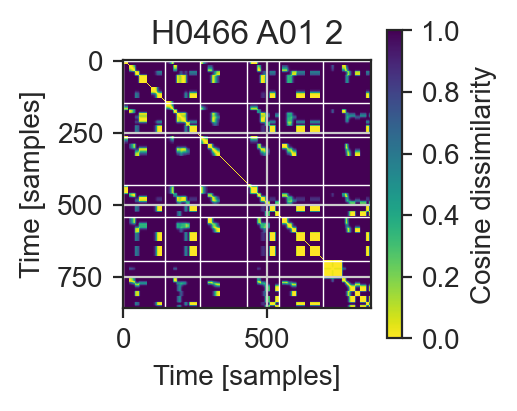

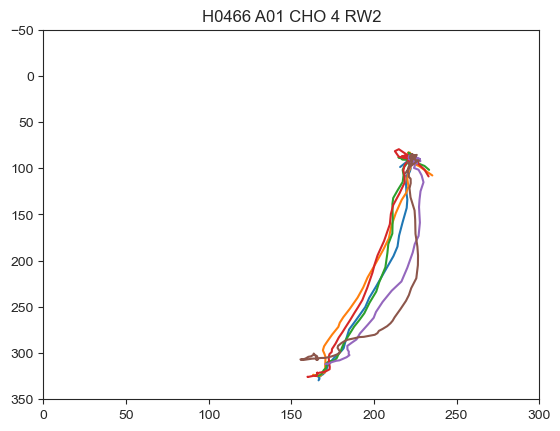

0.05107031197518953
0.40213587486415864
0.25273275870621864


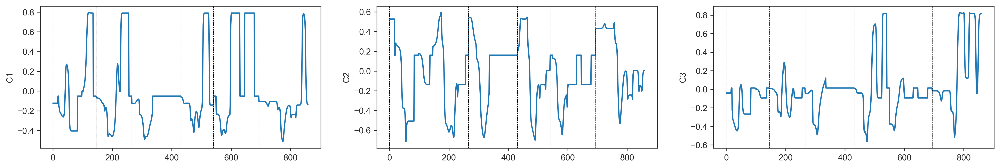

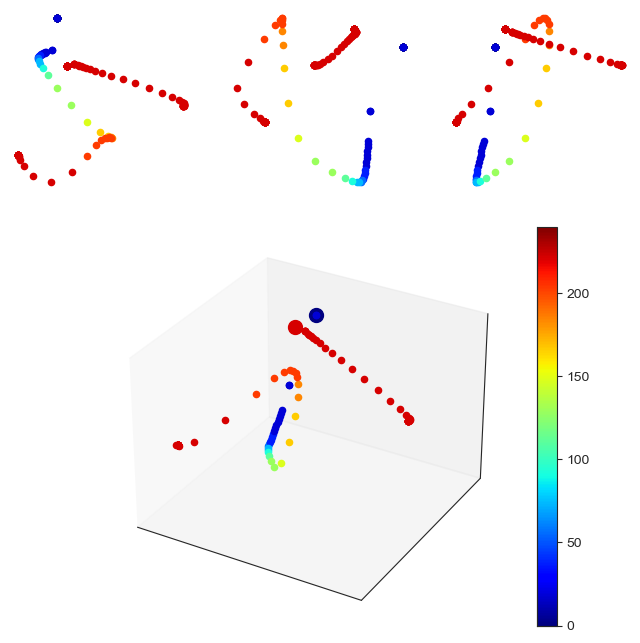

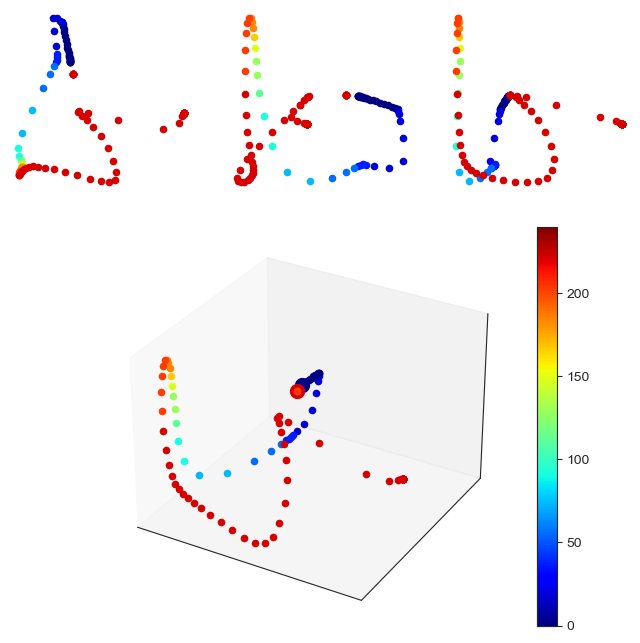

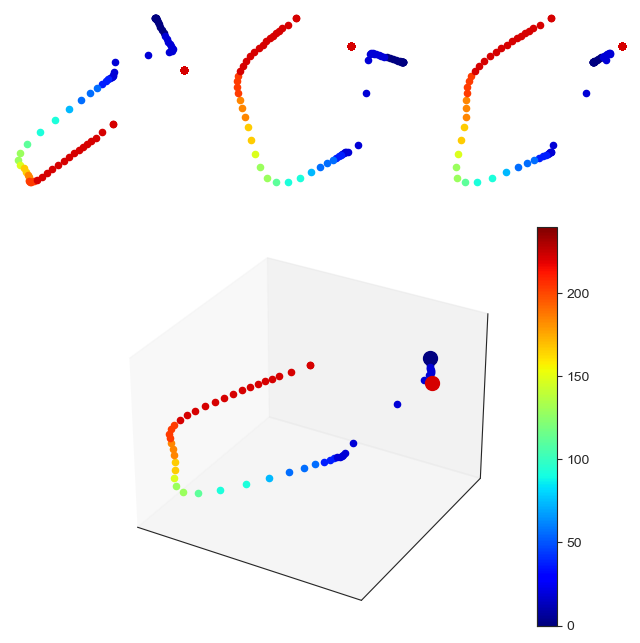

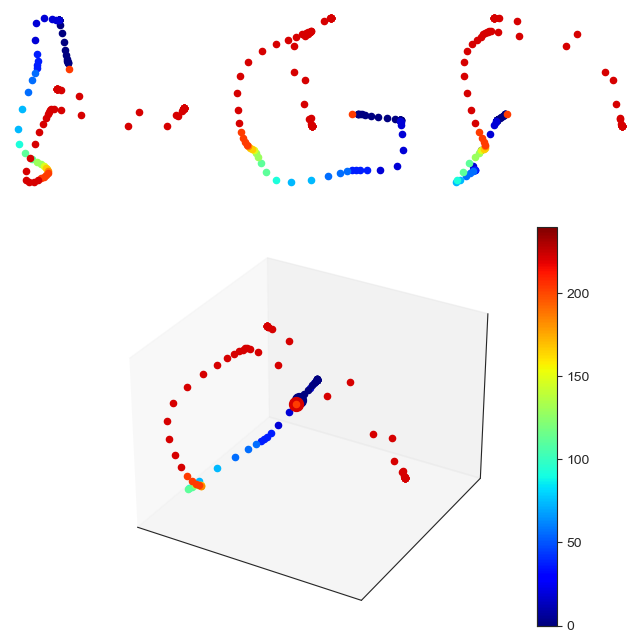

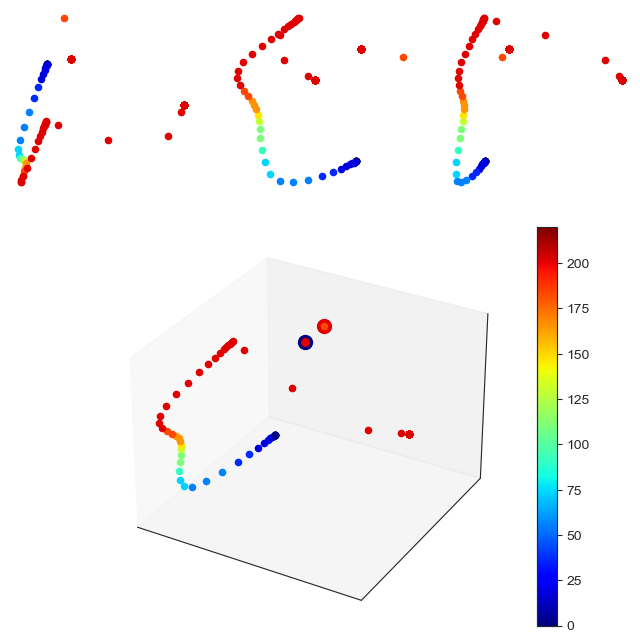

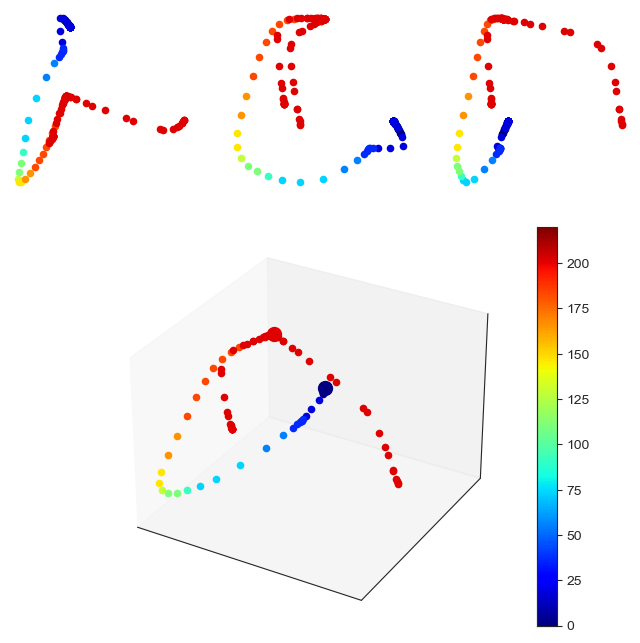

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (477, 477)


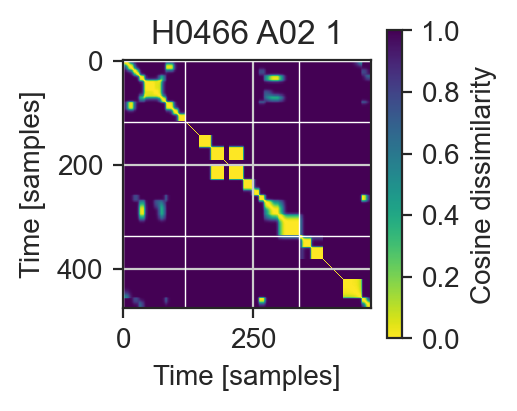

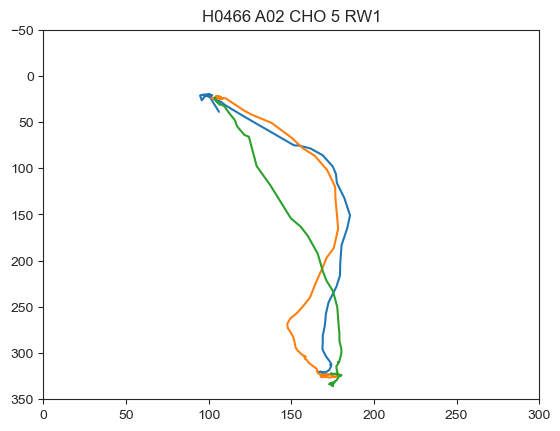

0.14405388949580752
0.057605286551445
0.230053952668983


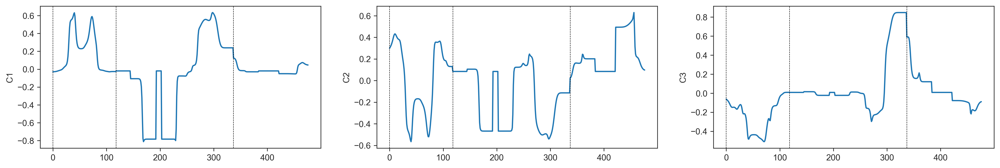

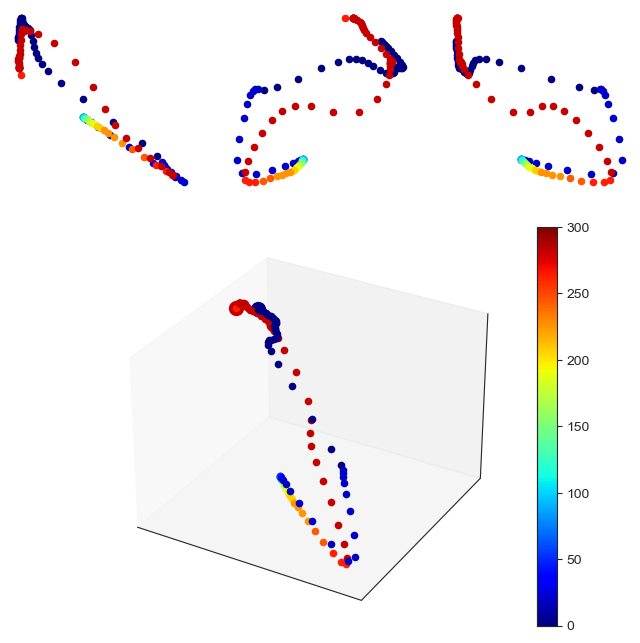

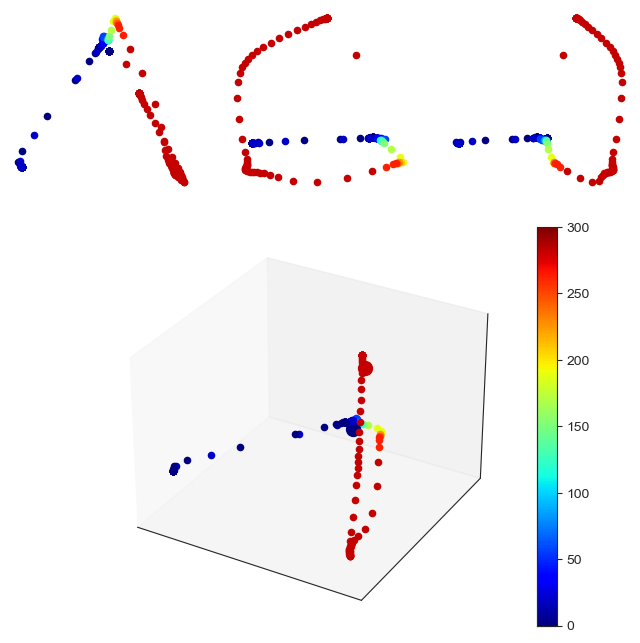

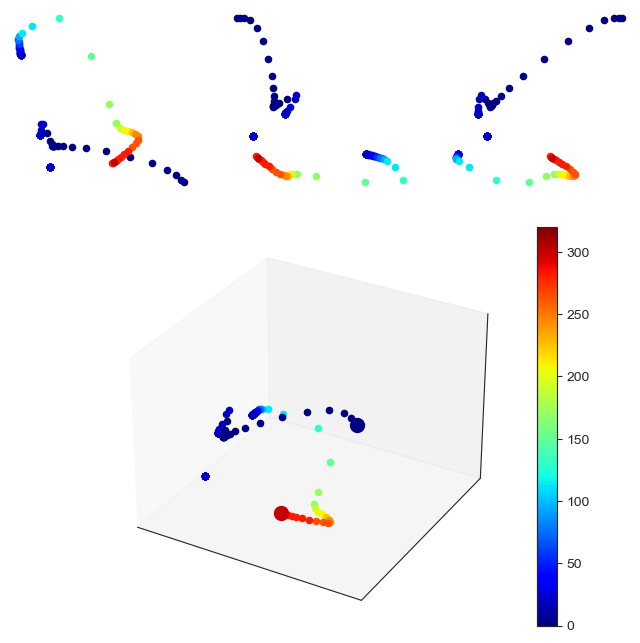

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (1509, 1509)


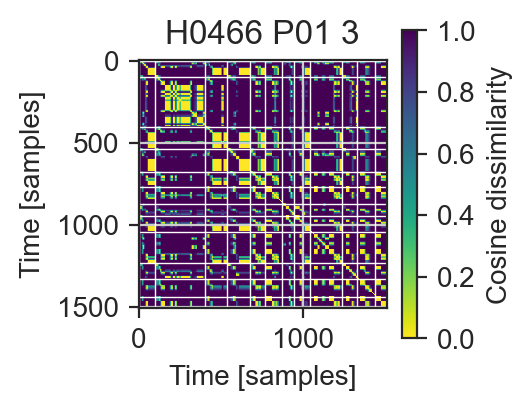

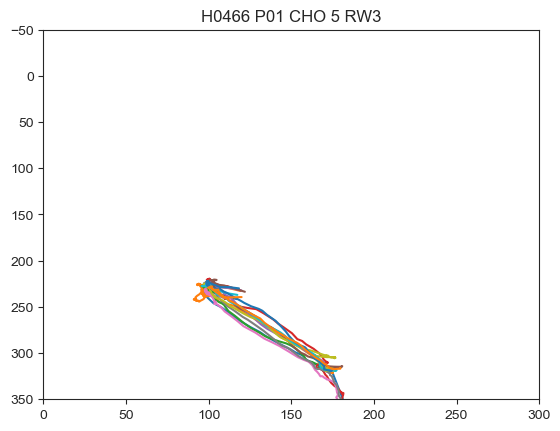

0.5516498703290208
0.14965994908057081
0.27852900949381254


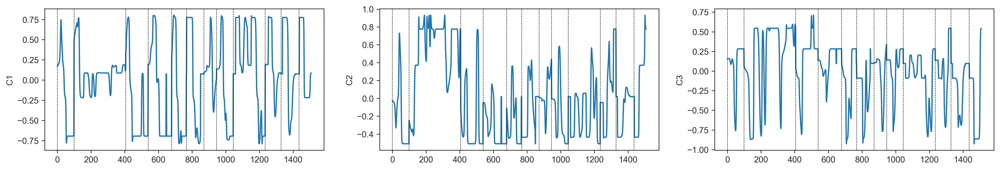

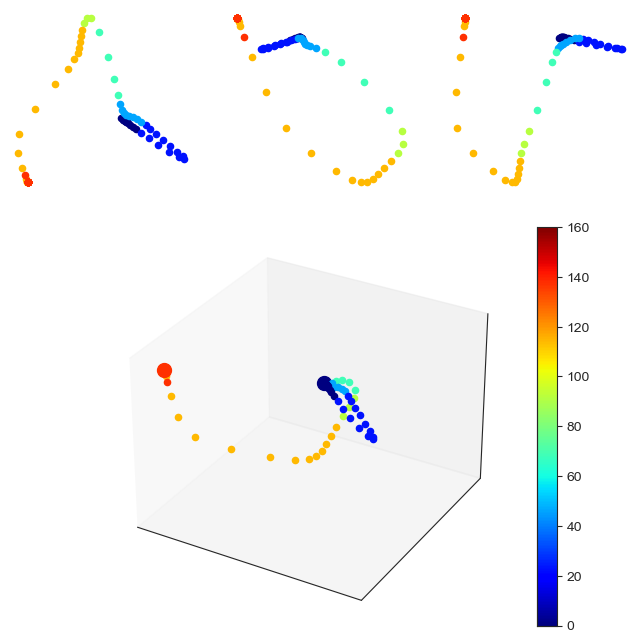

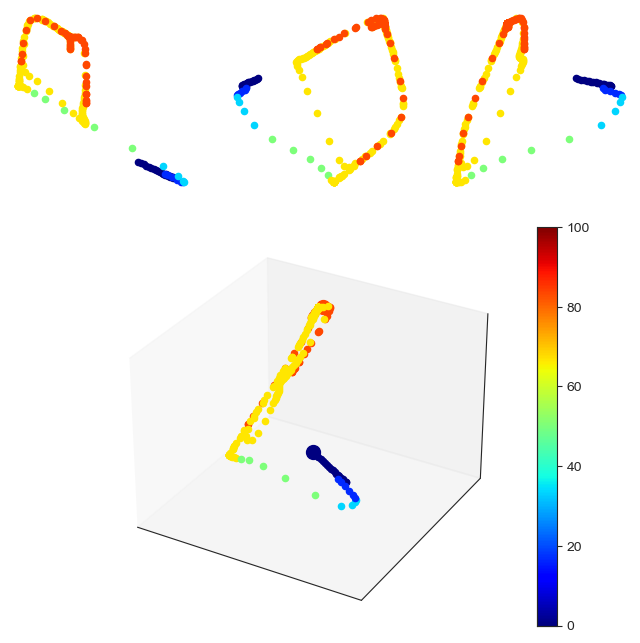

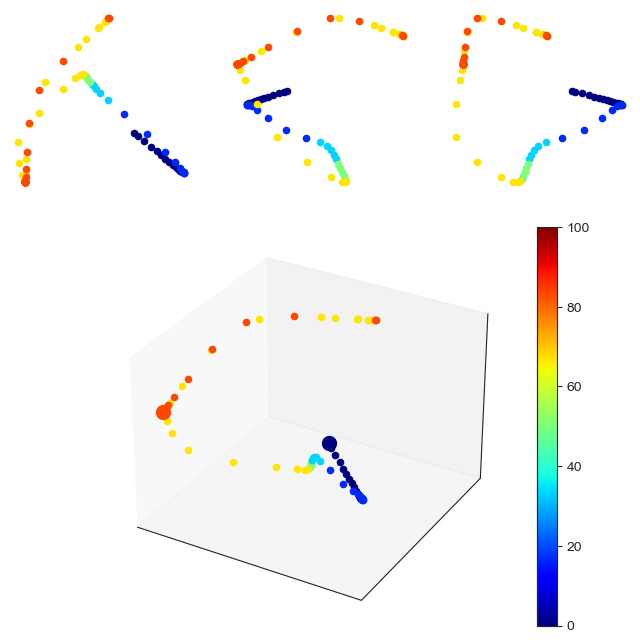

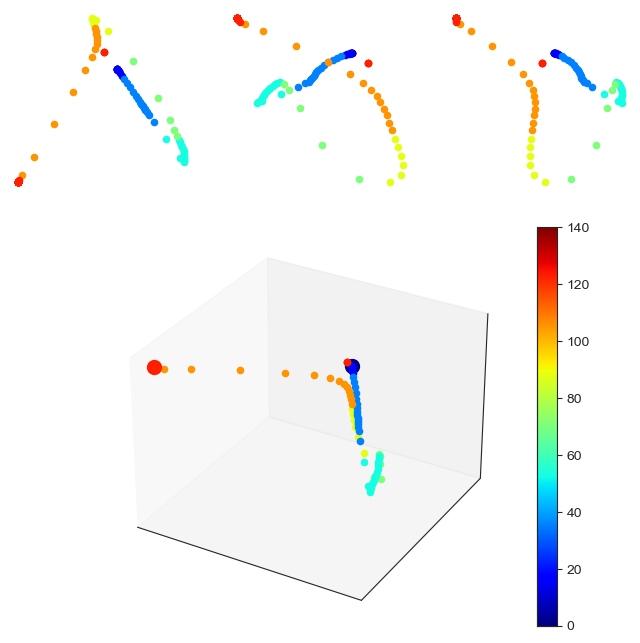

...

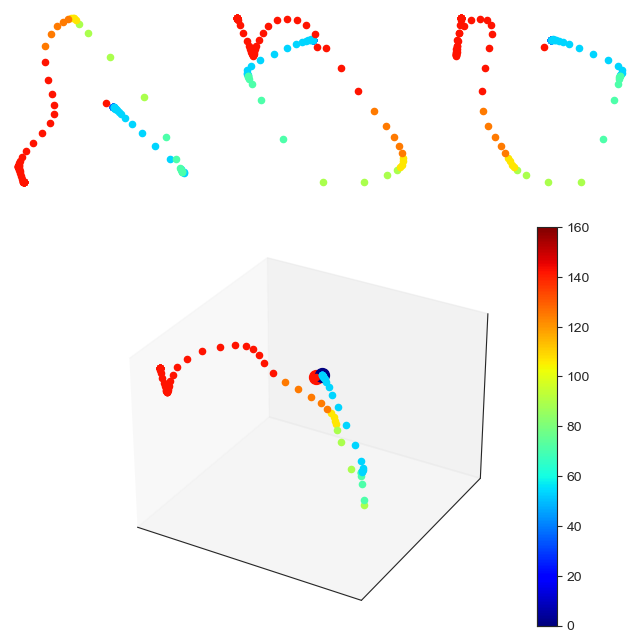

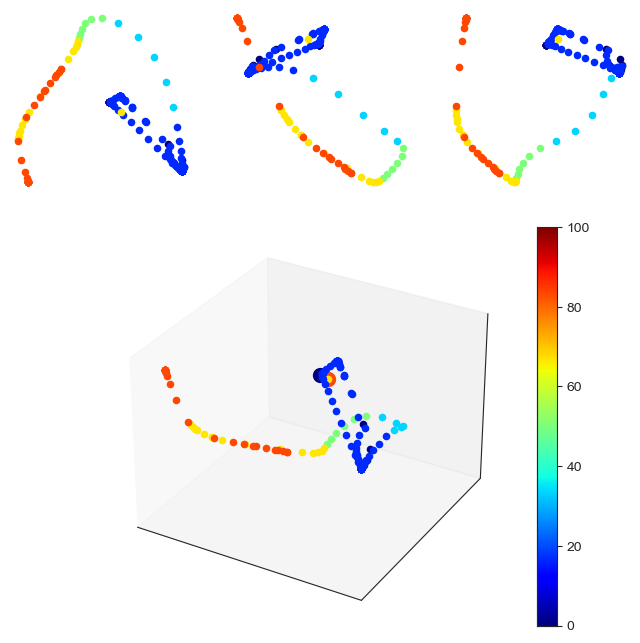

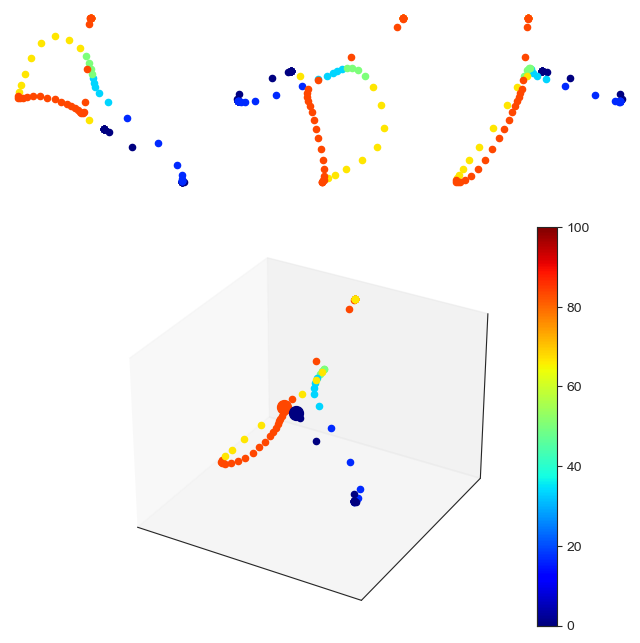

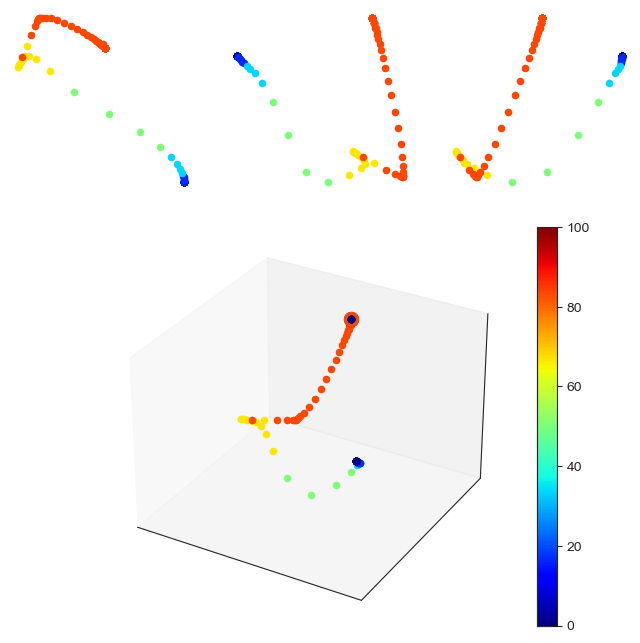

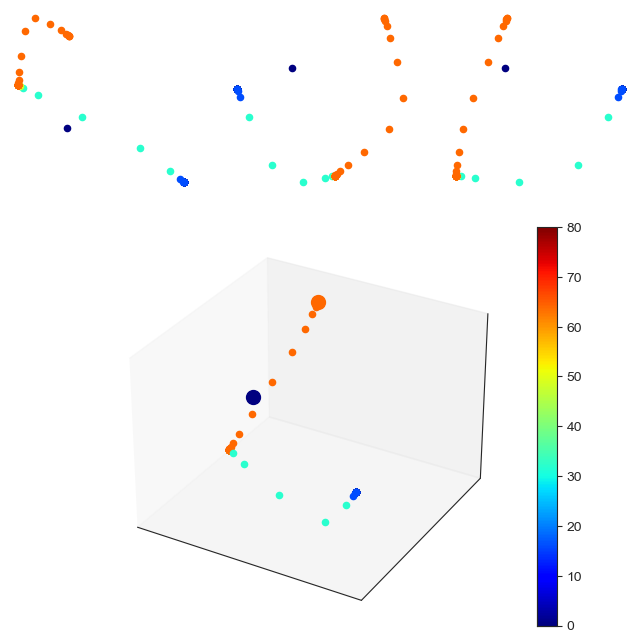

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (937, 937)


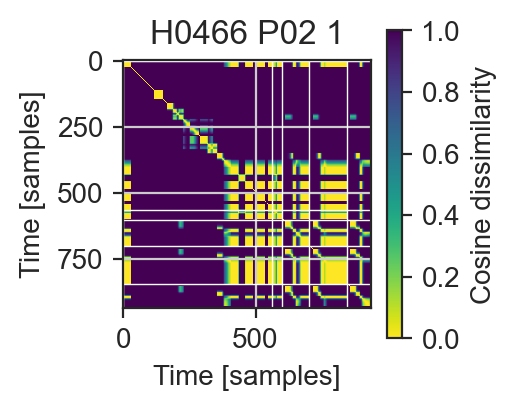

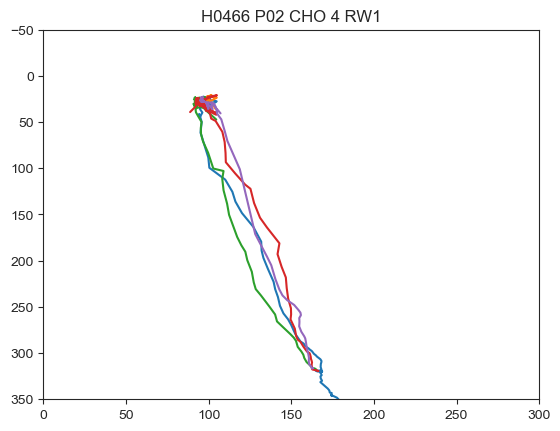

0.0020989300507472776
0.3655491823149899
0.036290248077757194


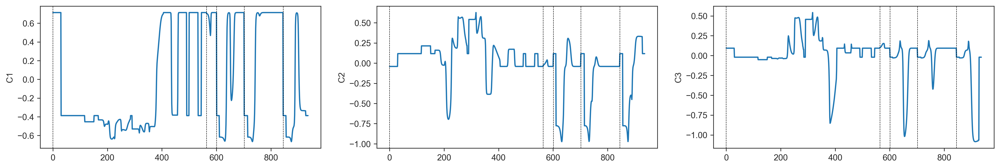

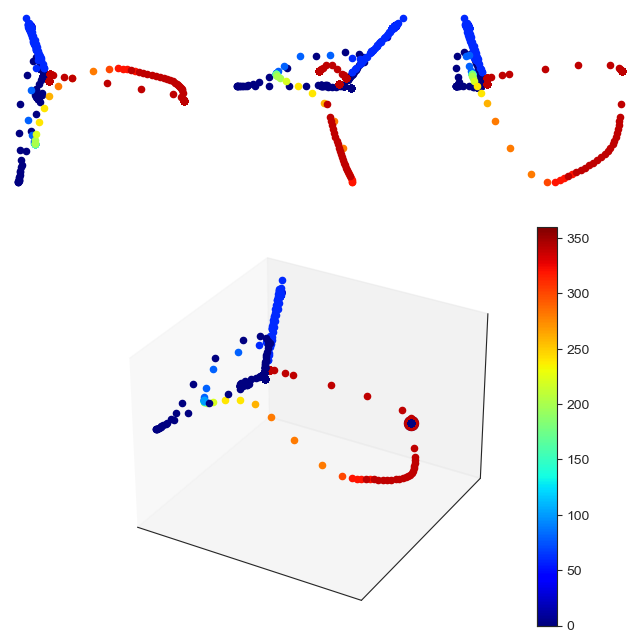

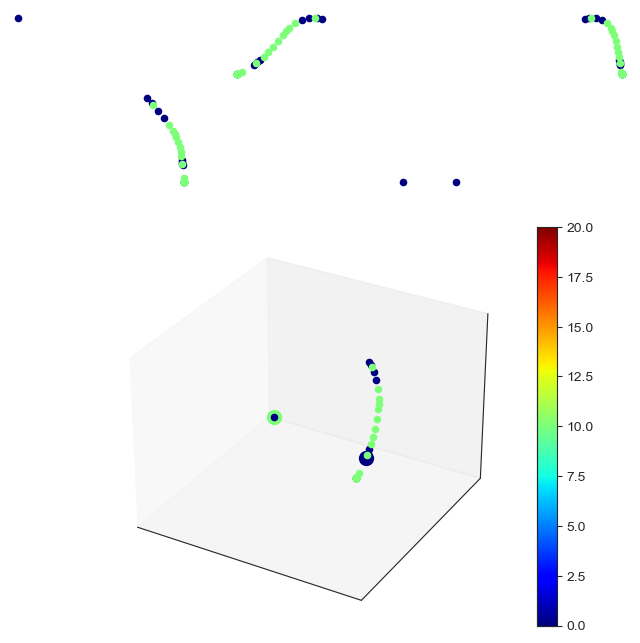

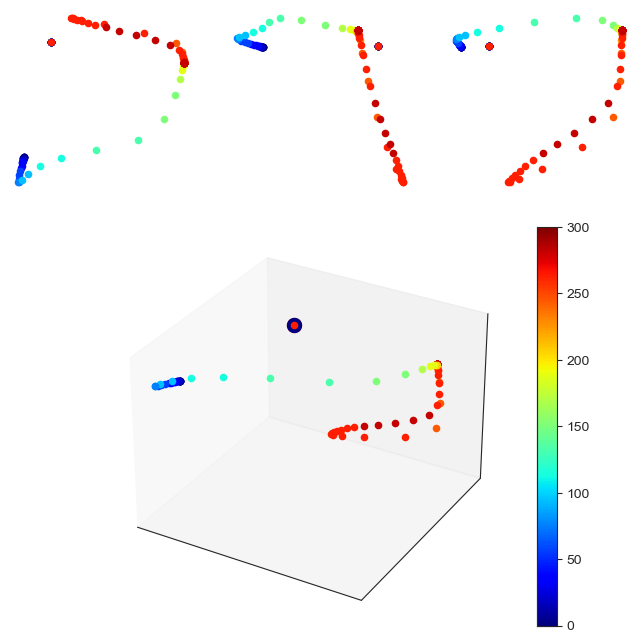

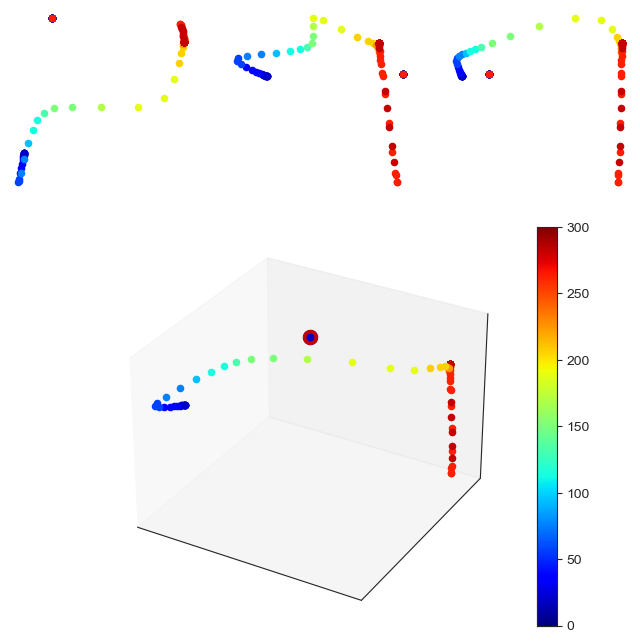

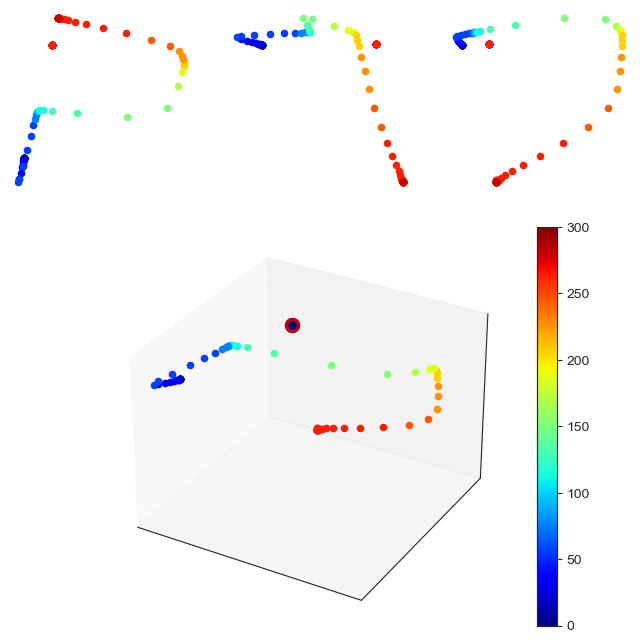

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (985, 985)


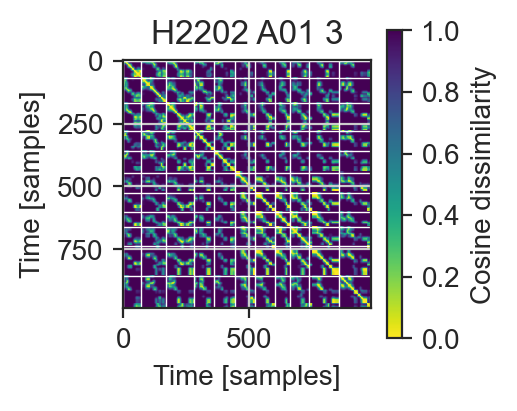

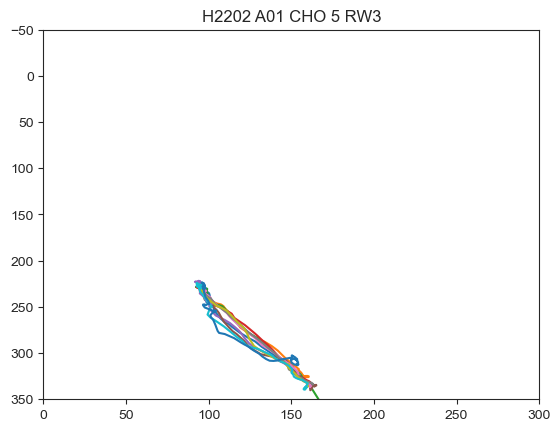

0.6490367455994825
0.20823797899522198
0.01822600370531626


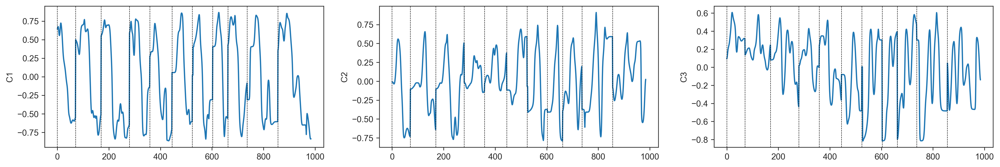

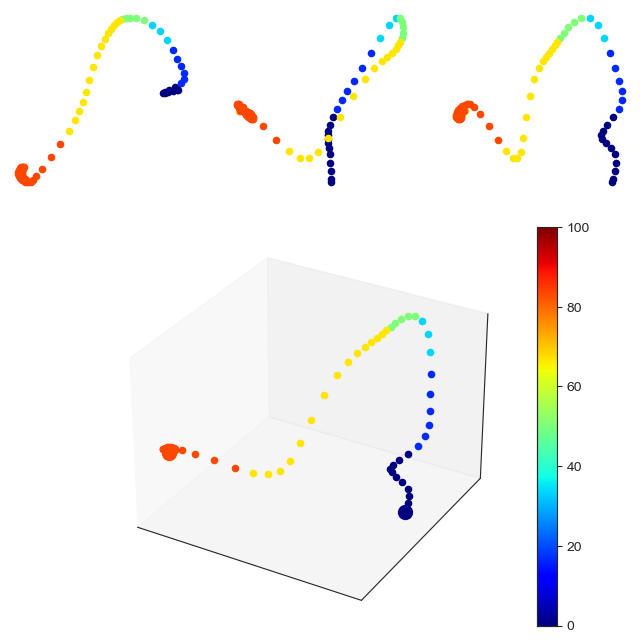

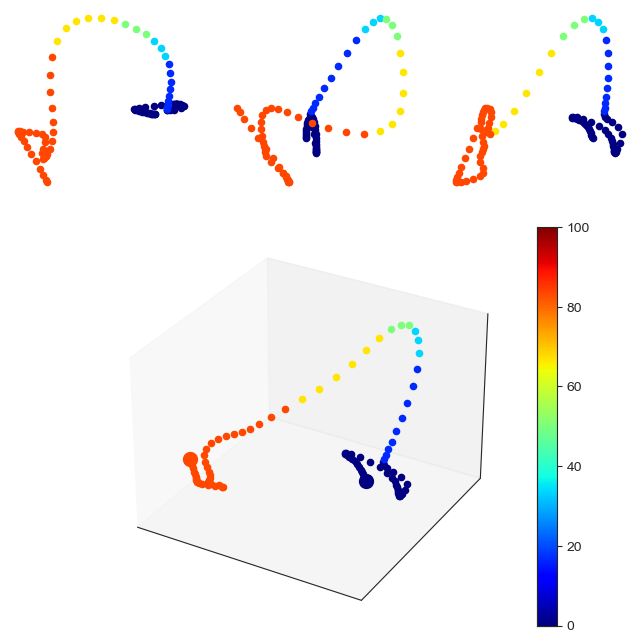

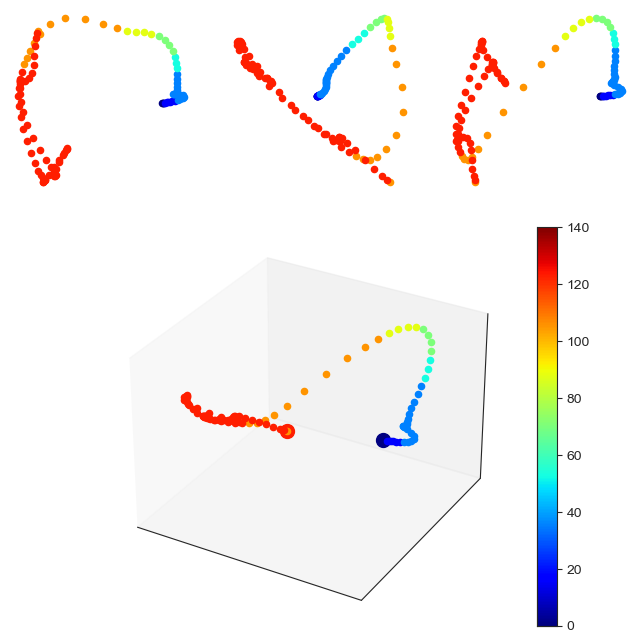

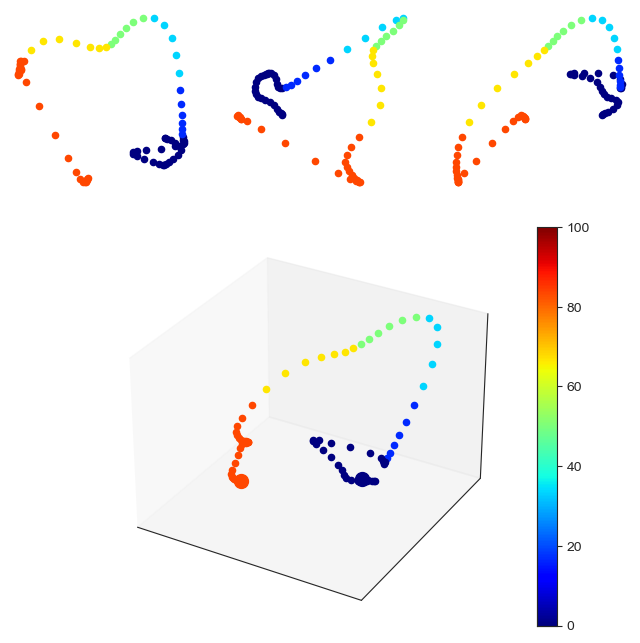

...

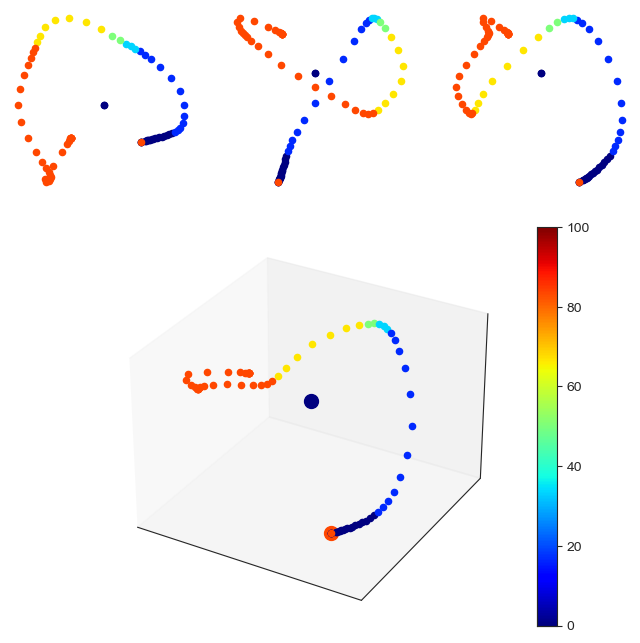

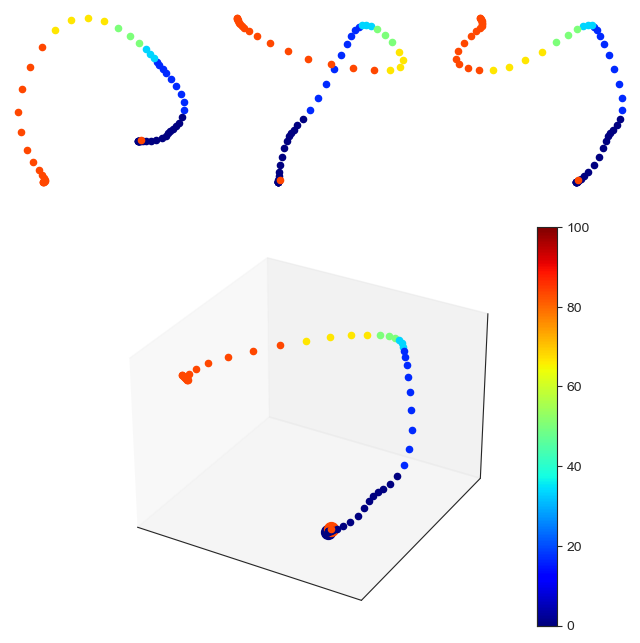

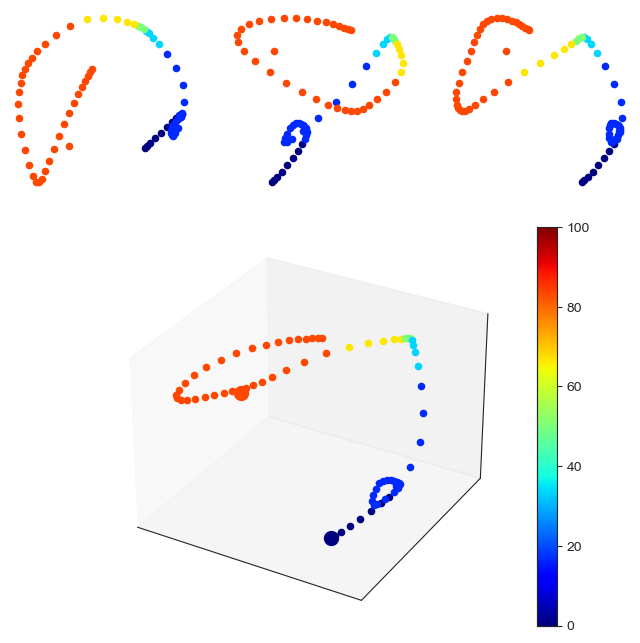

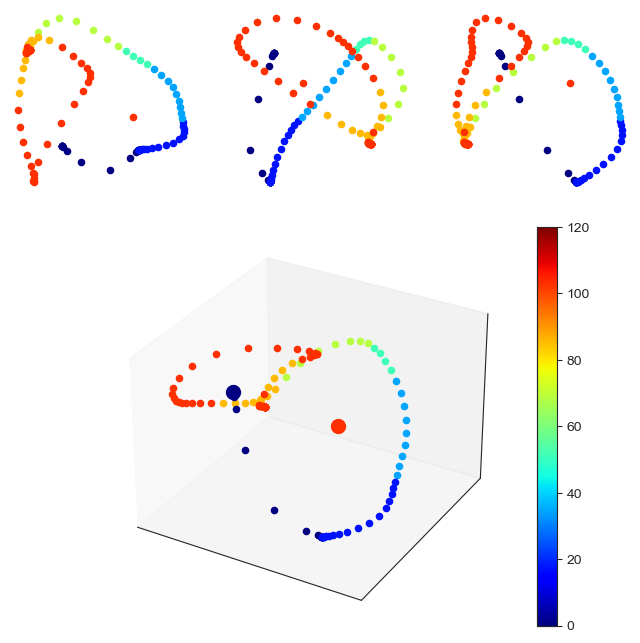

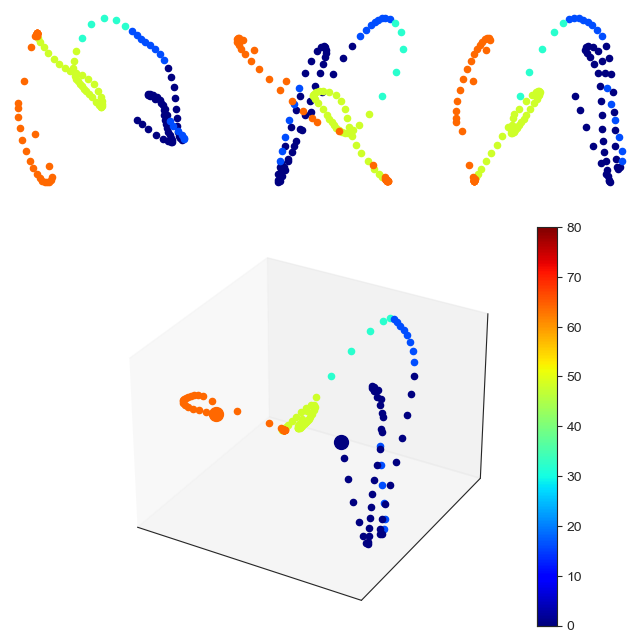

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (490, 490)


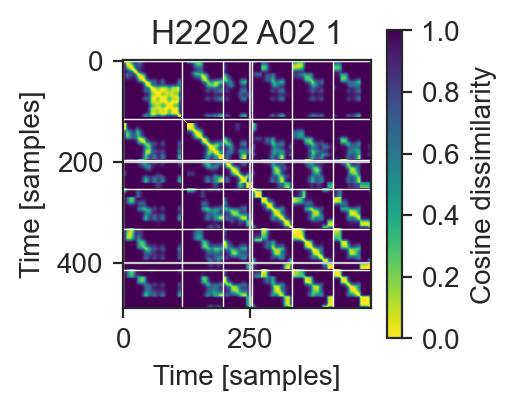

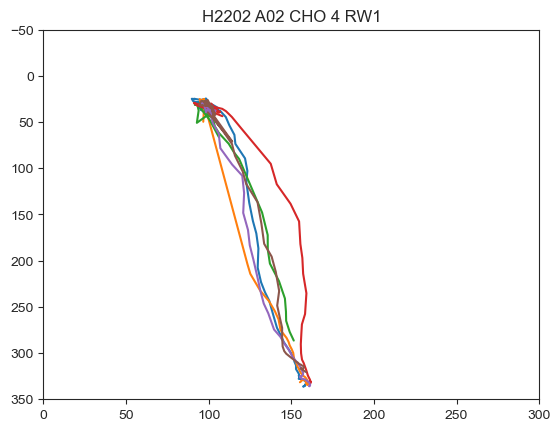

0.3856422190746207
0.18213901909734095
0.007955826238602134


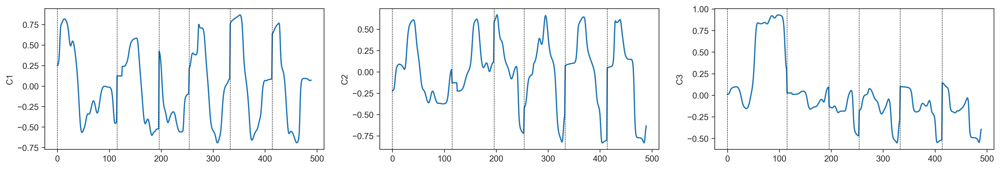

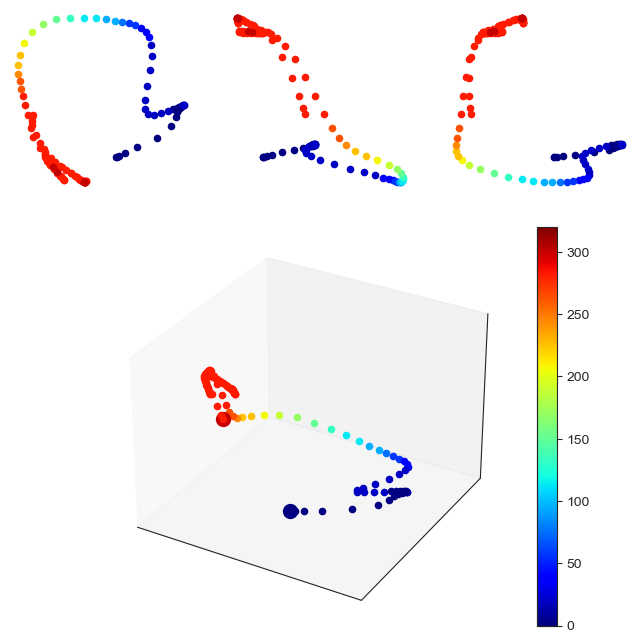

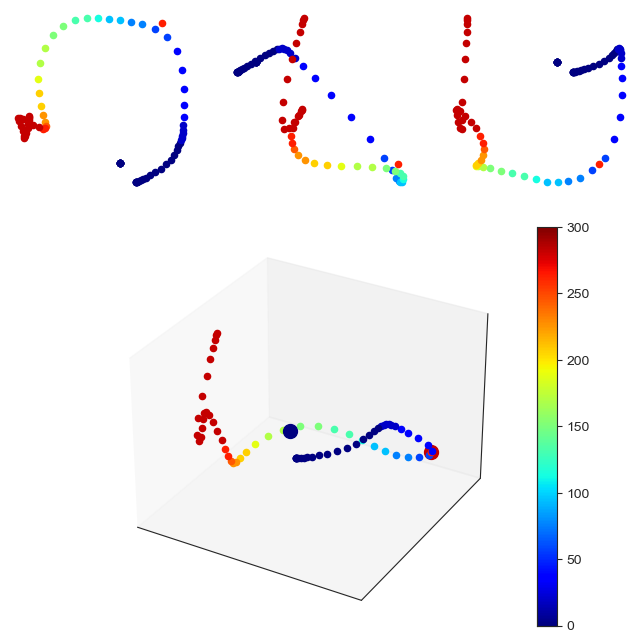

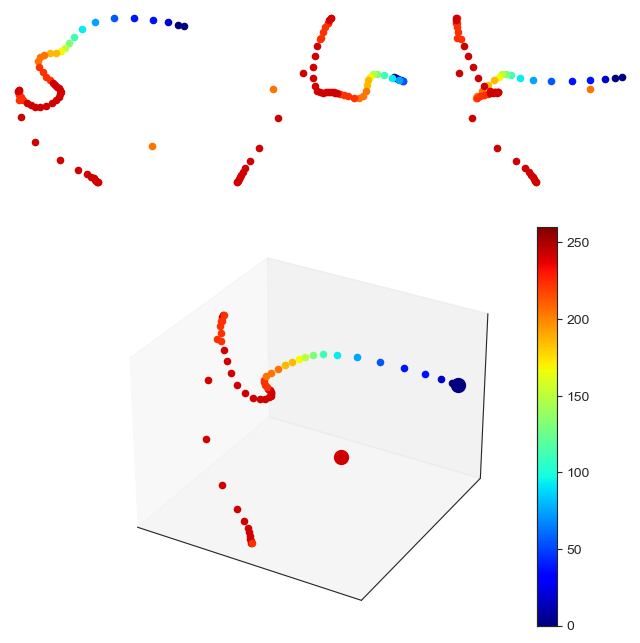

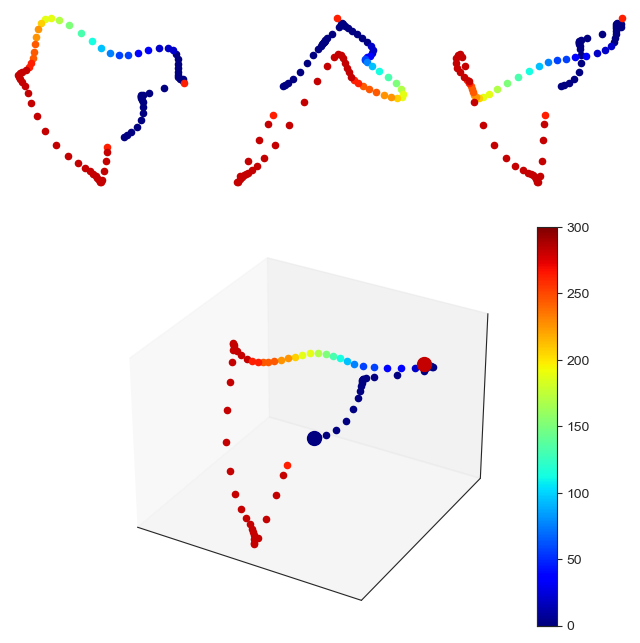

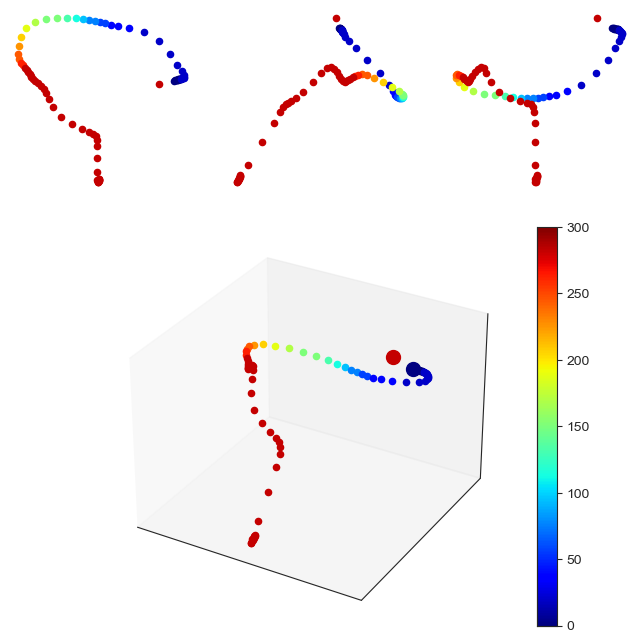

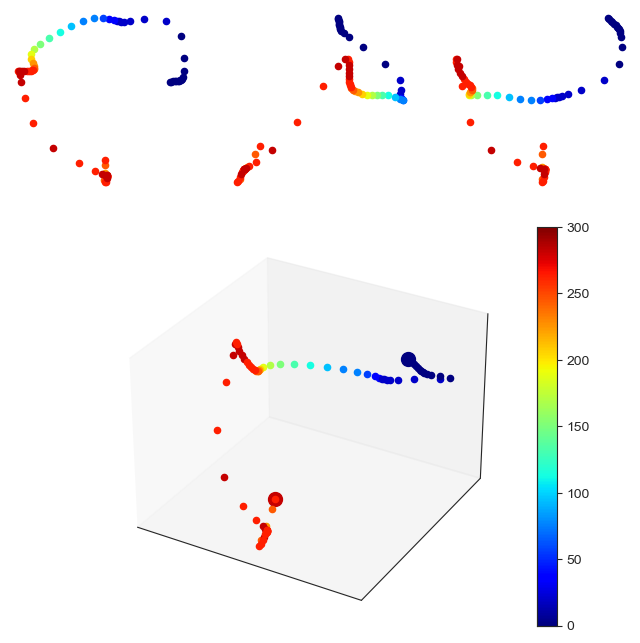

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (752, 752)


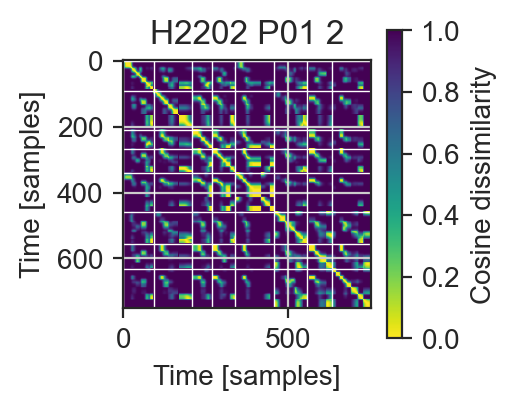

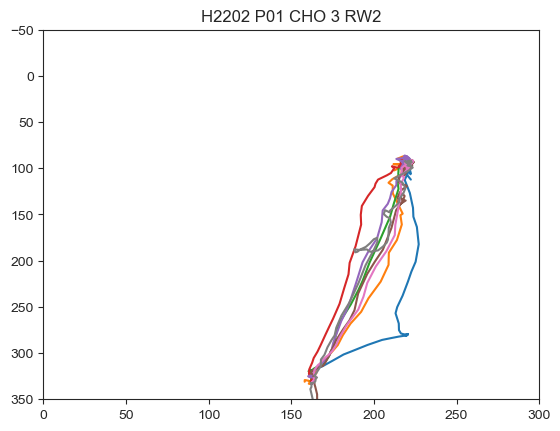

0.3211675973856329
0.4841866404032243
0.44745896506089816


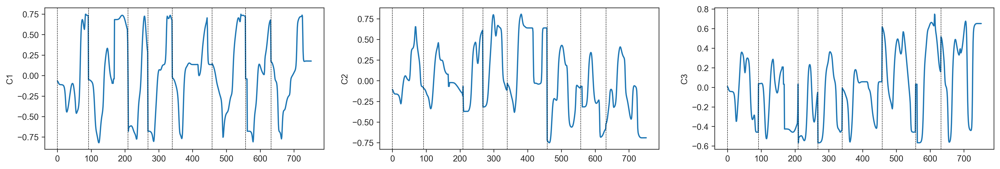

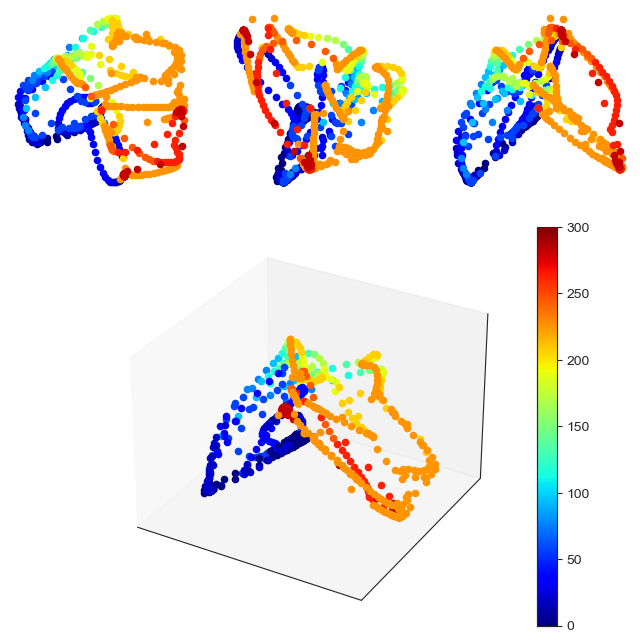

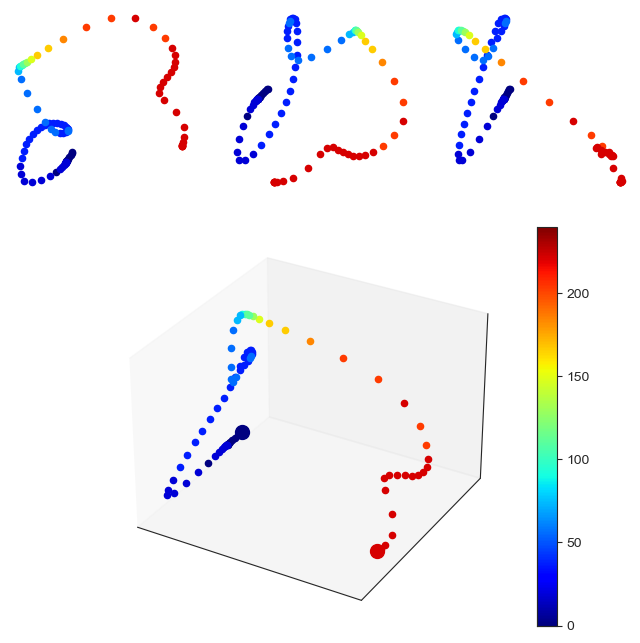

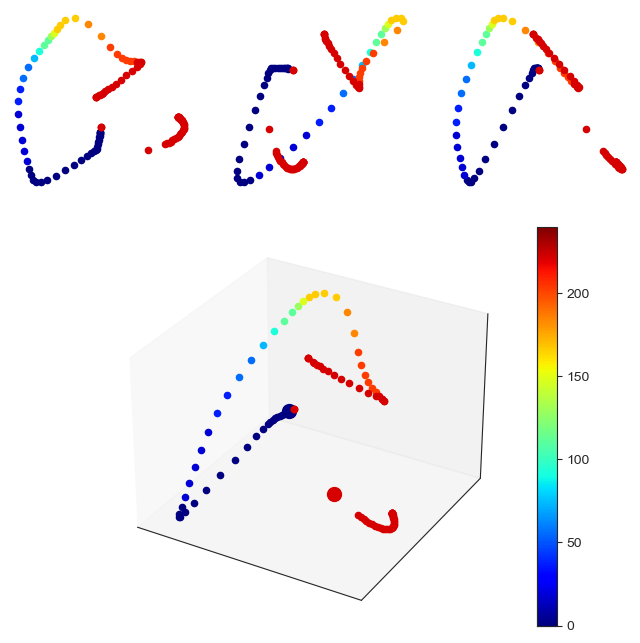

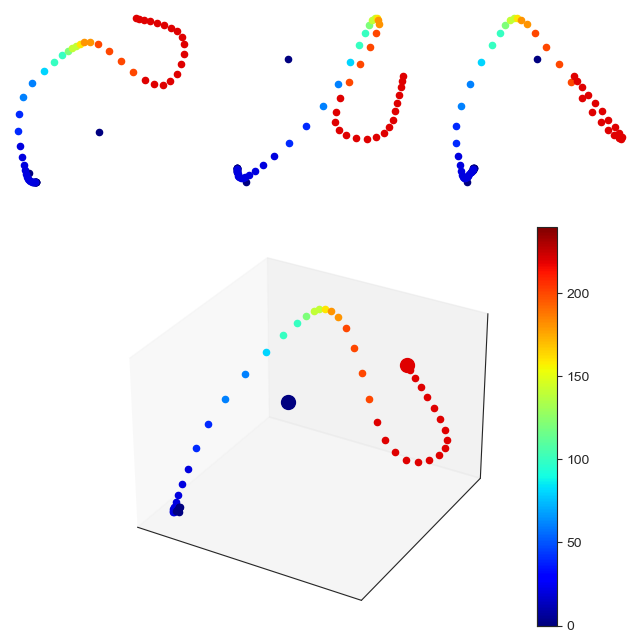

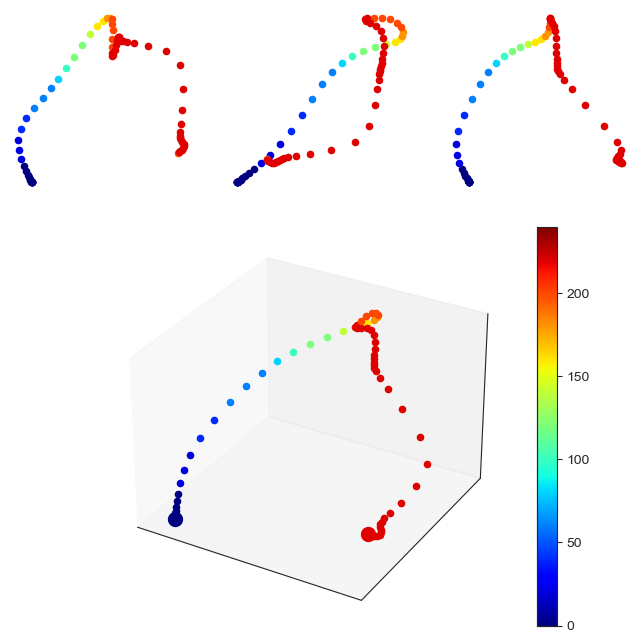

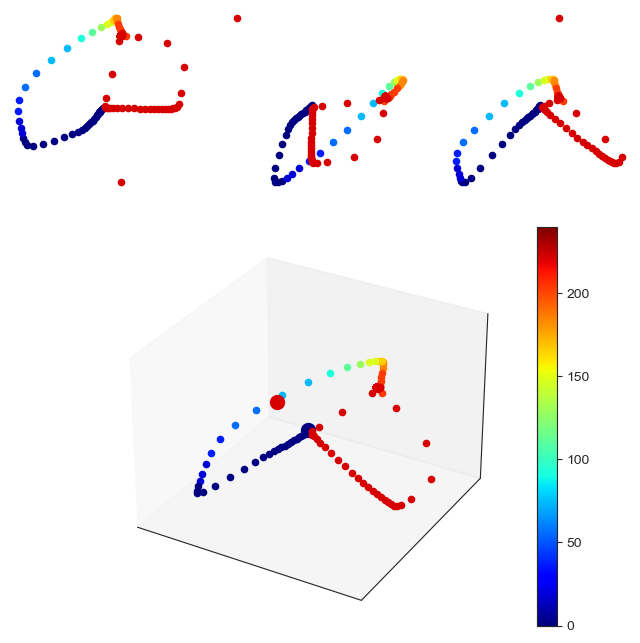

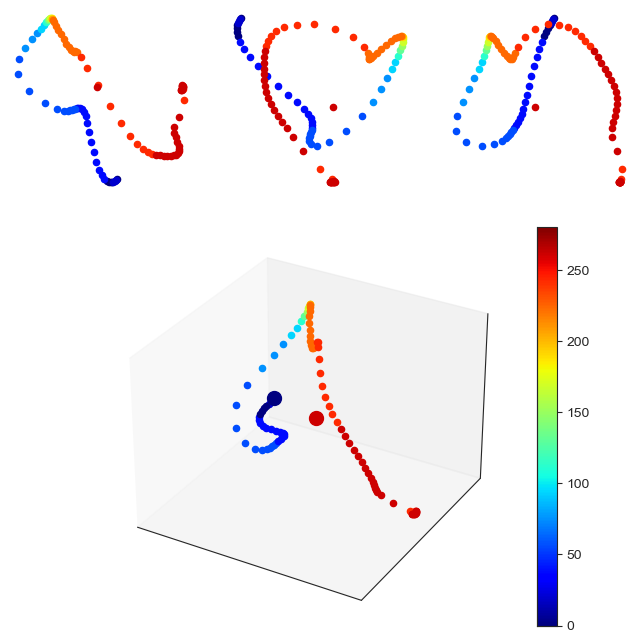

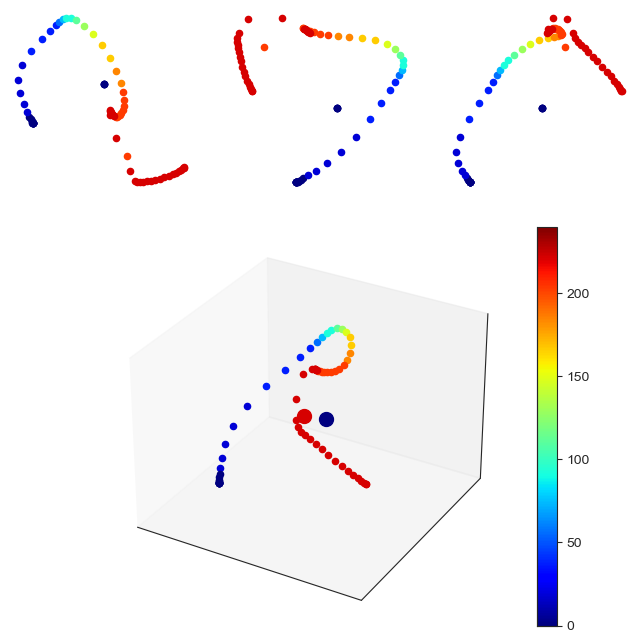

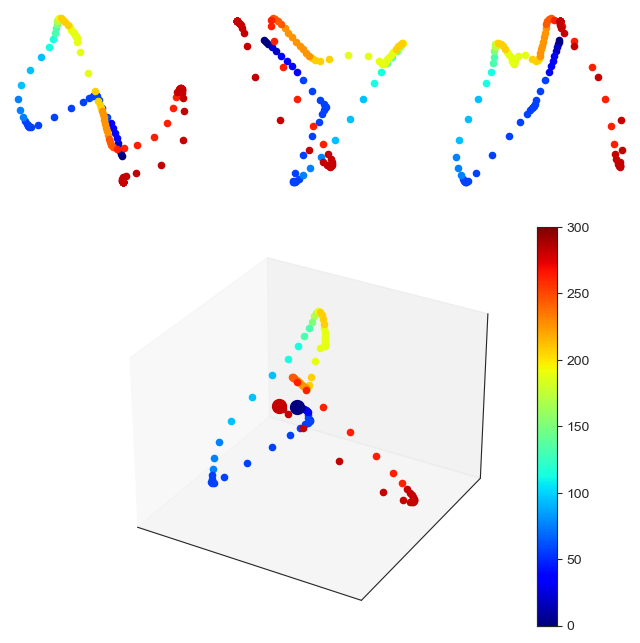

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (813, 813)


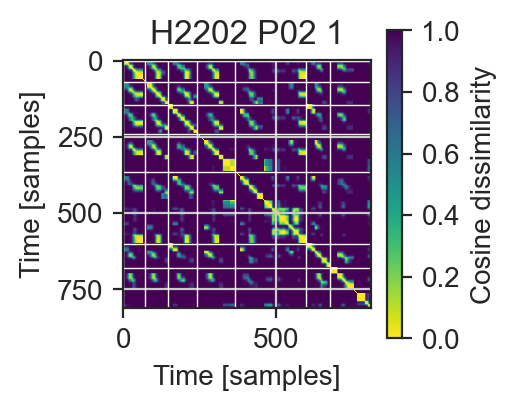

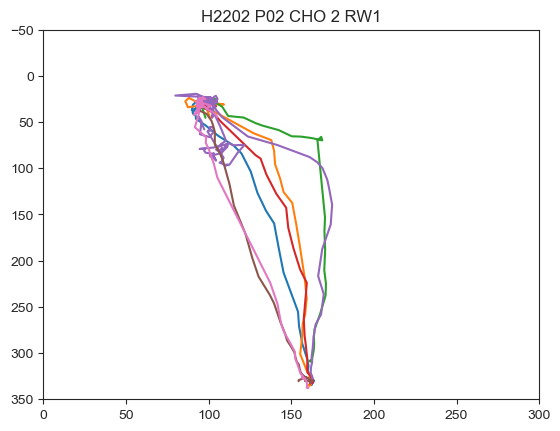

0.6074373447666203
0.541933089240336
0.2004916379691459


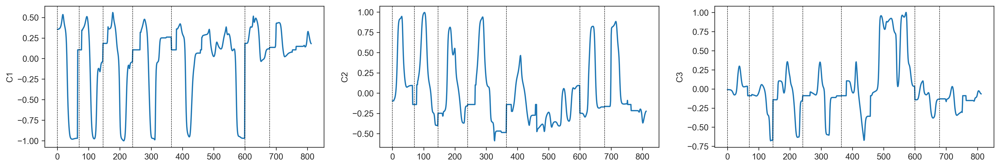

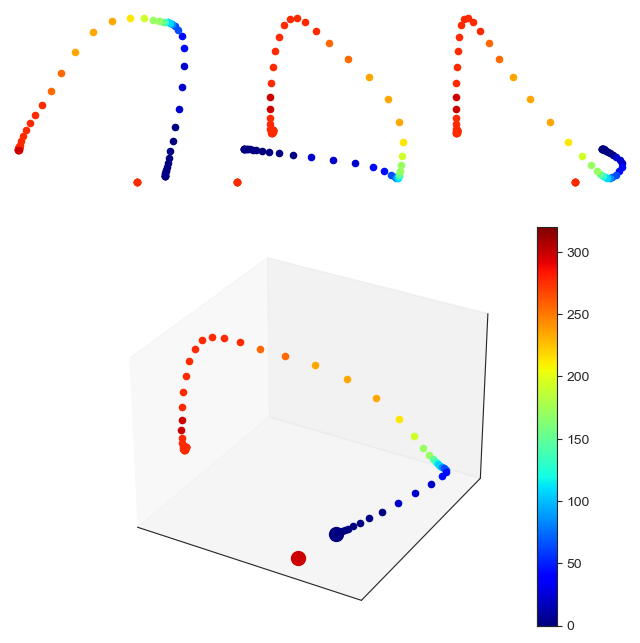

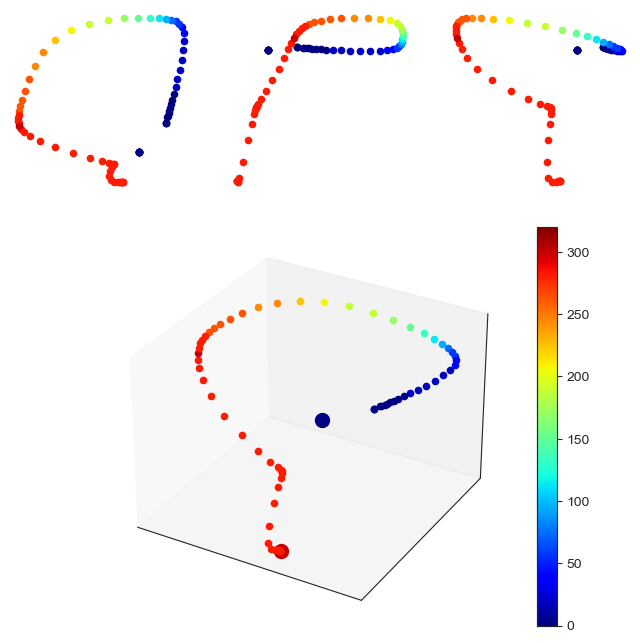

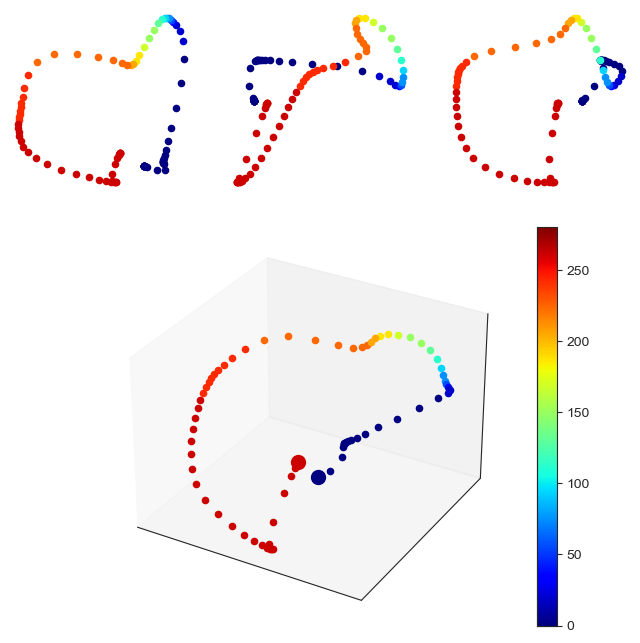

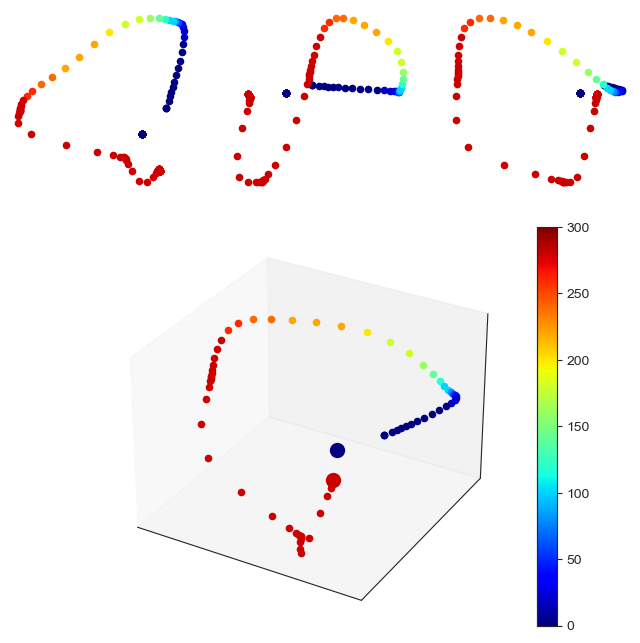

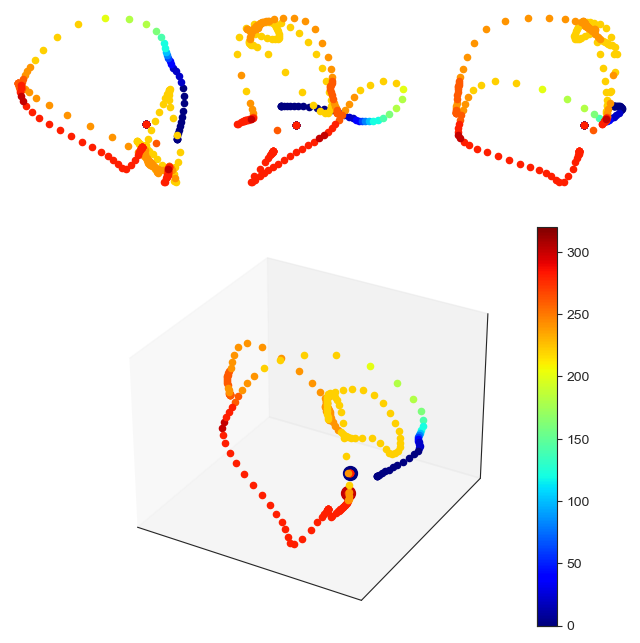

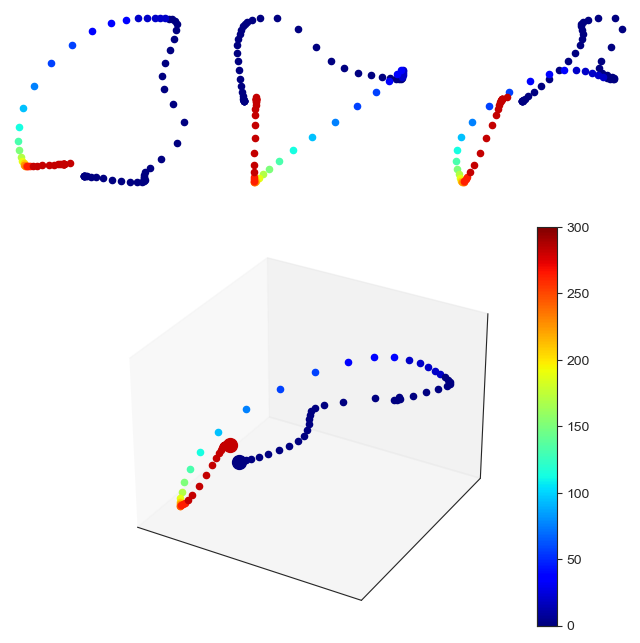

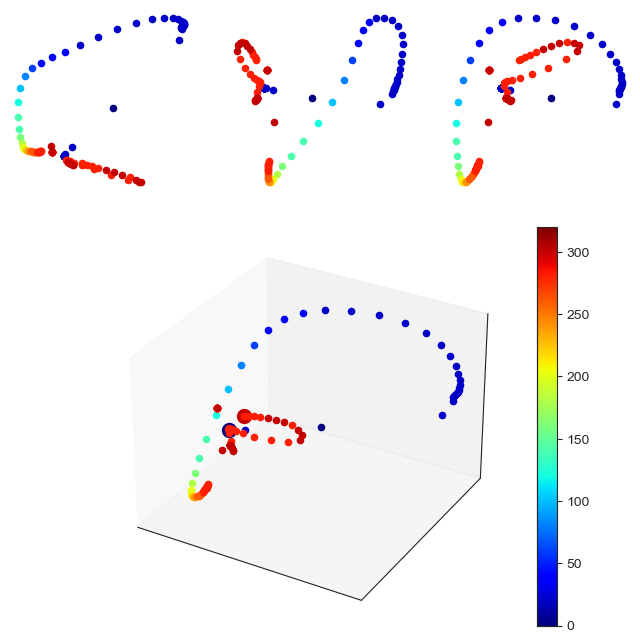

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (752, 752)


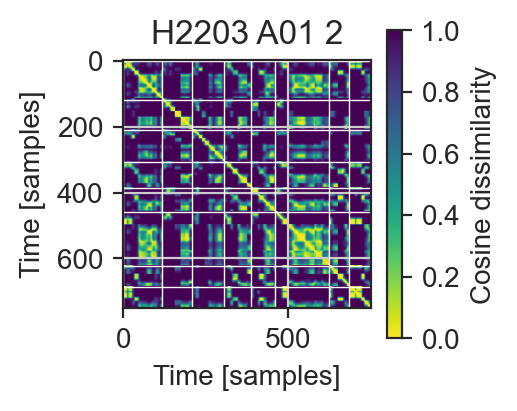

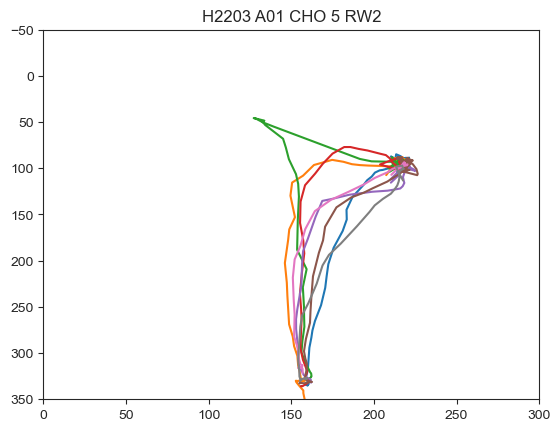

0.8003857858110219
0.3436155566021313
0.031552888126932924


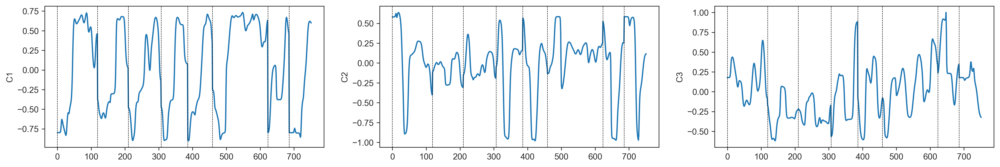

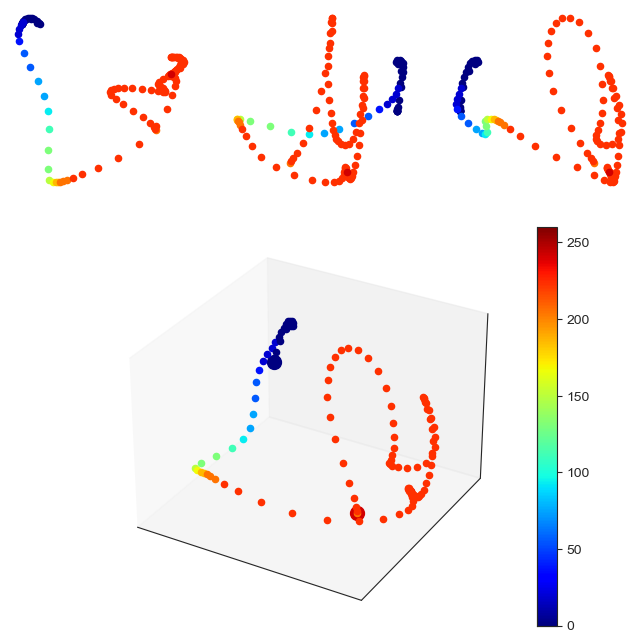

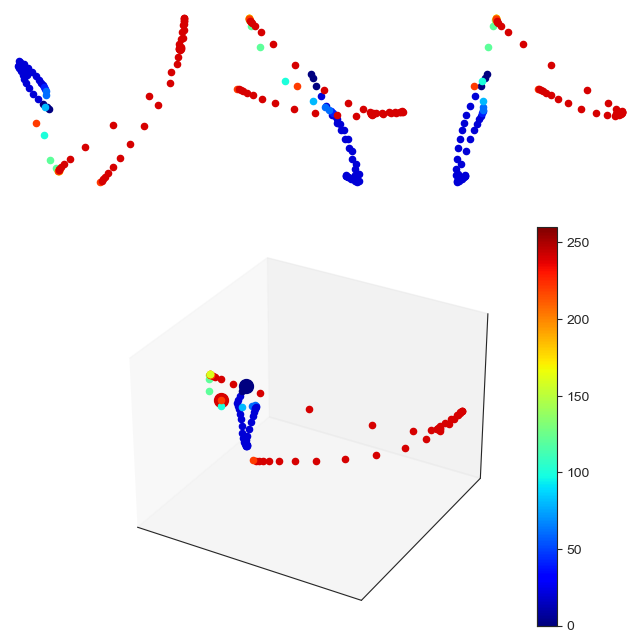

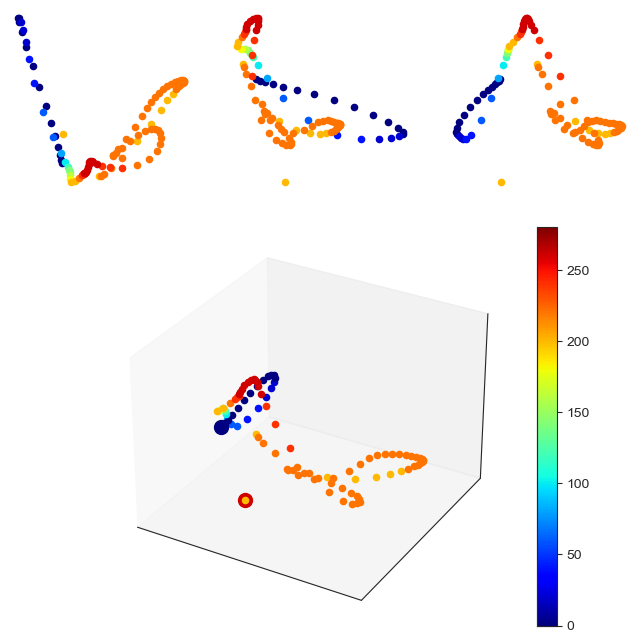

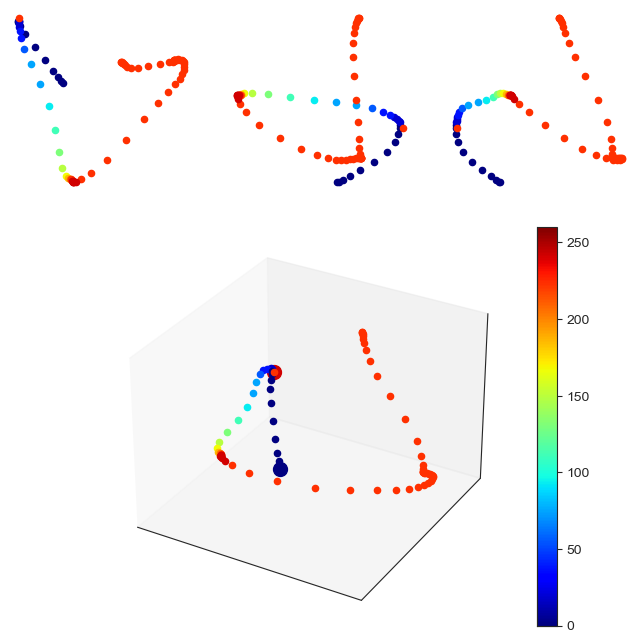

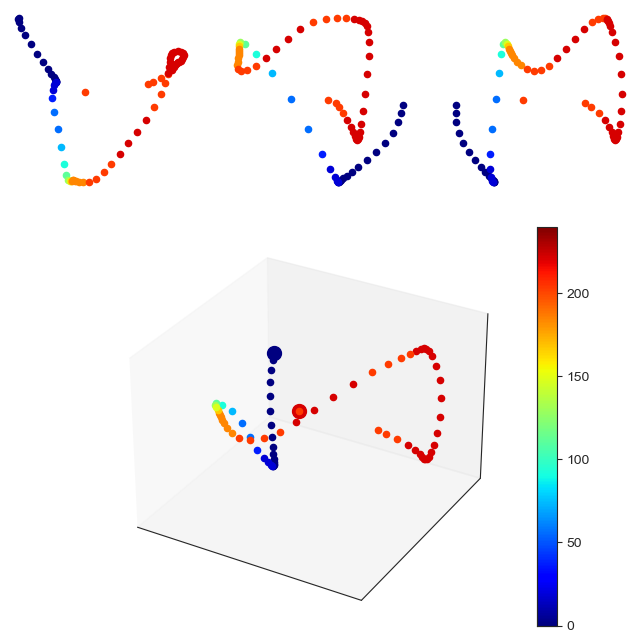

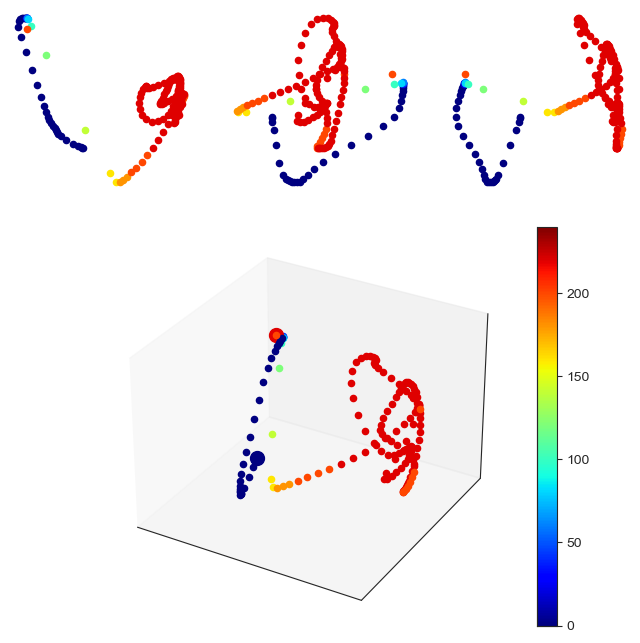

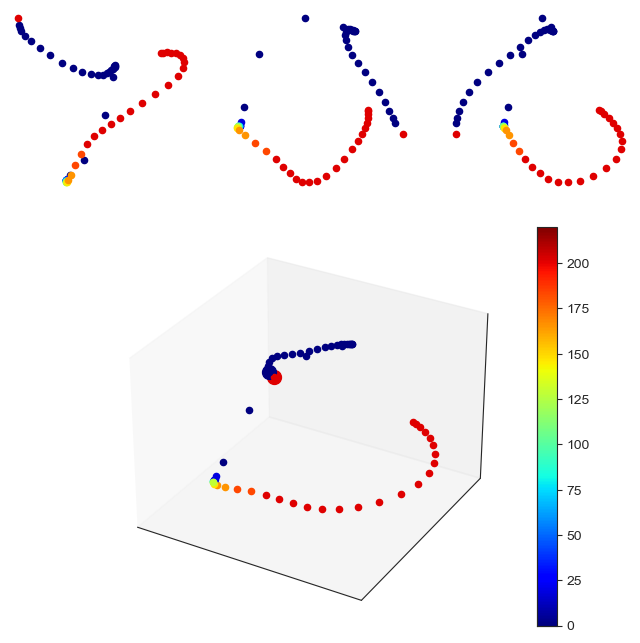

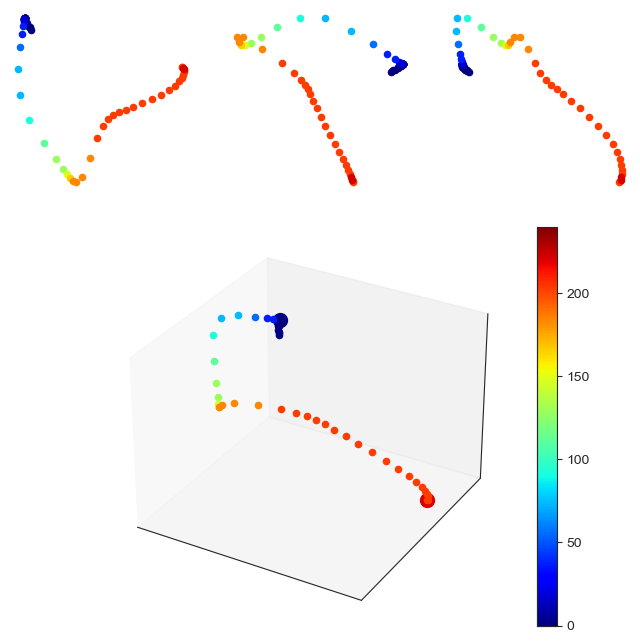

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (1113, 1113)


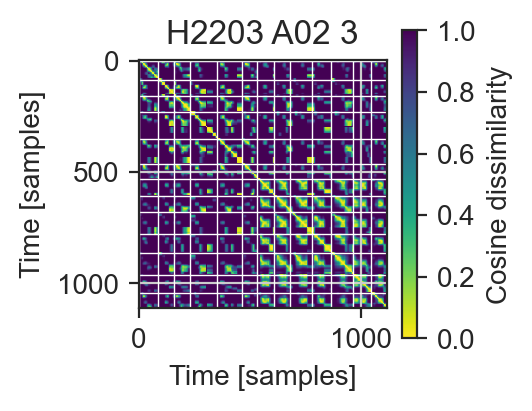

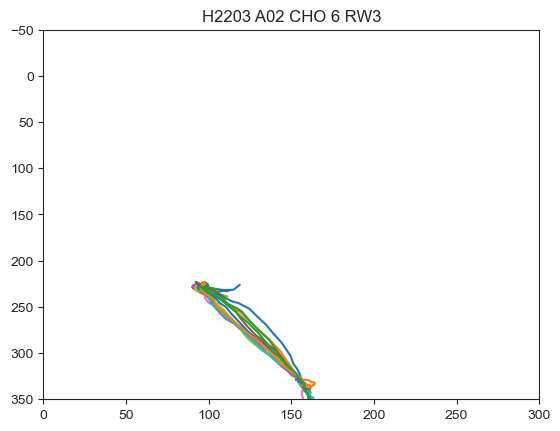

0.31684262142331243
0.2635026270411968
0.04964120988734877


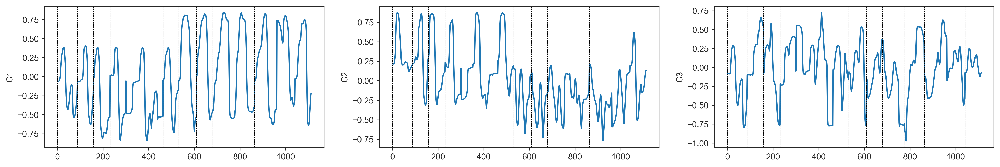

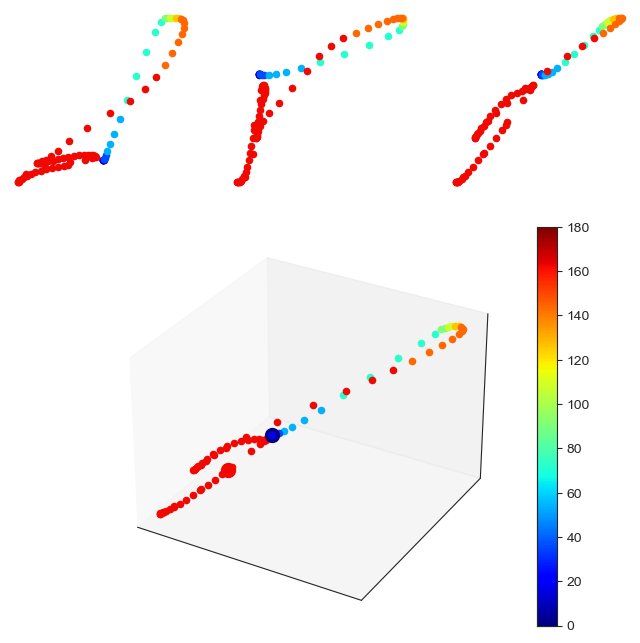

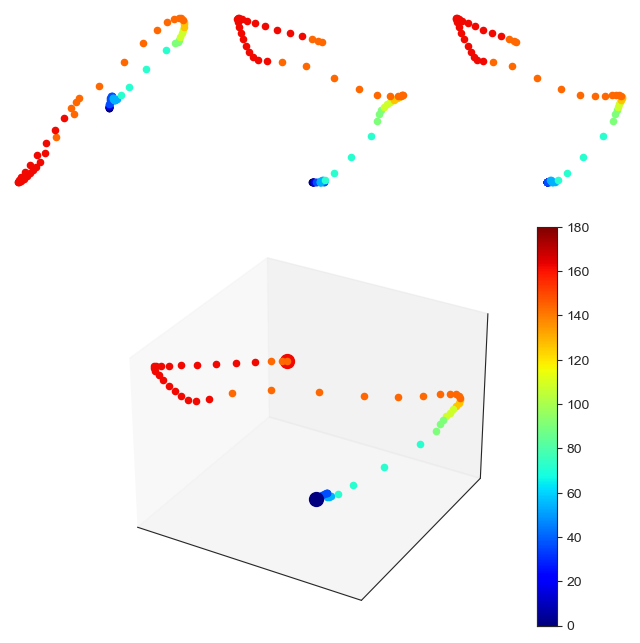

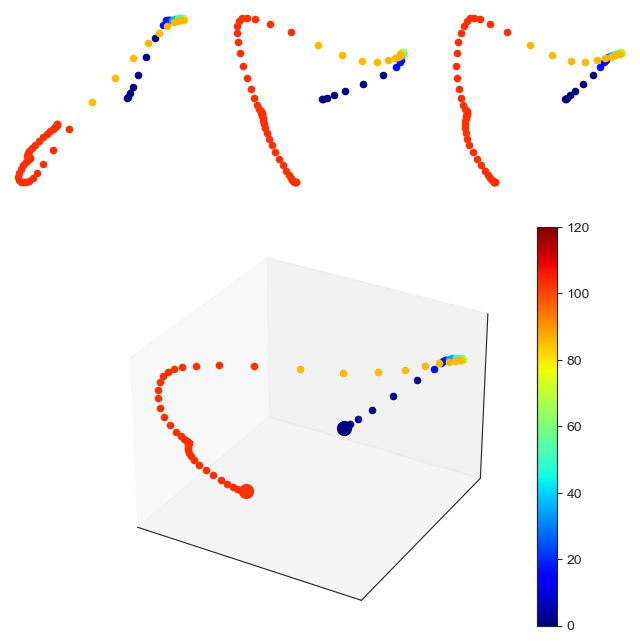

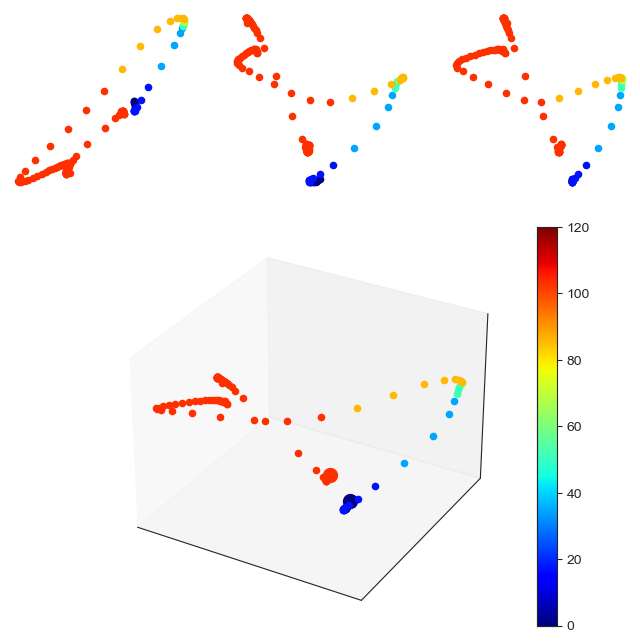

...

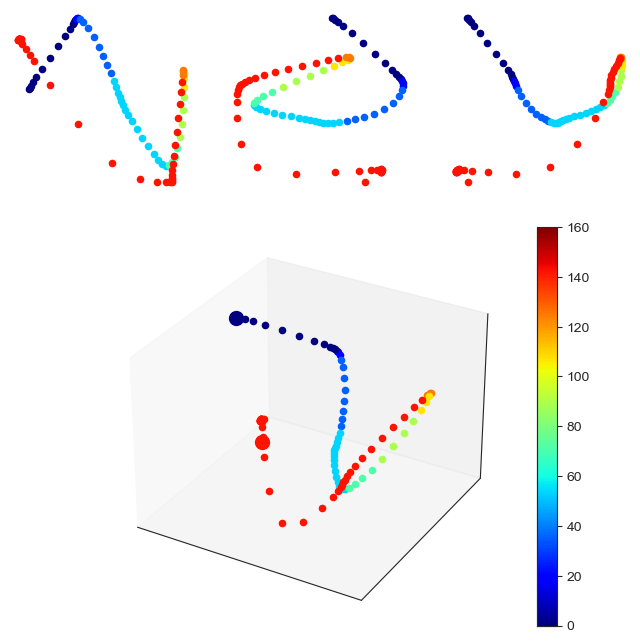

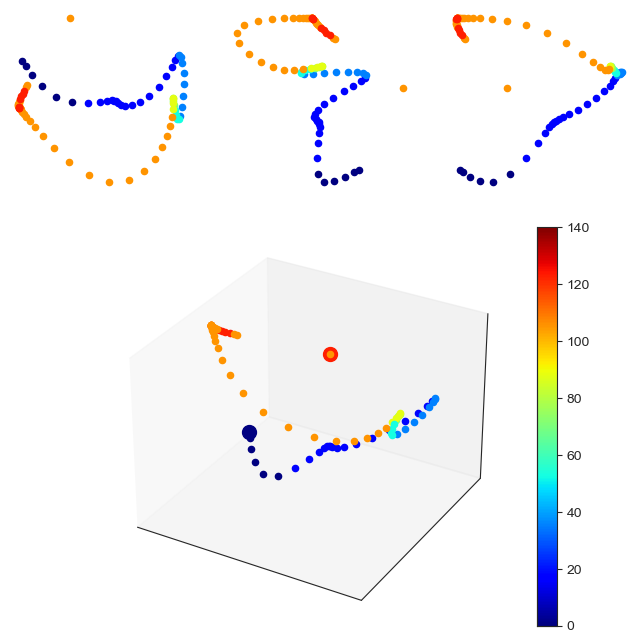

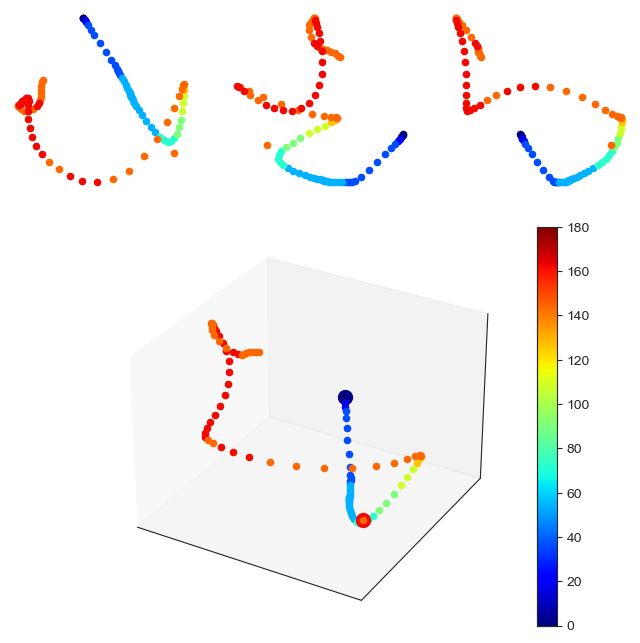

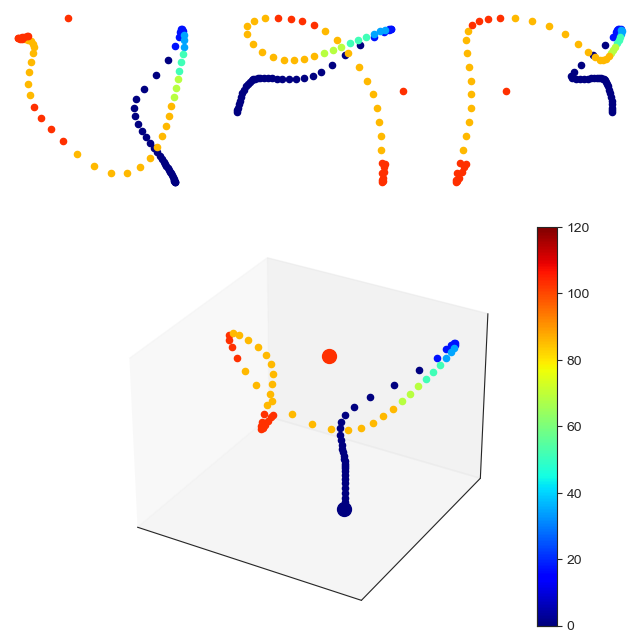

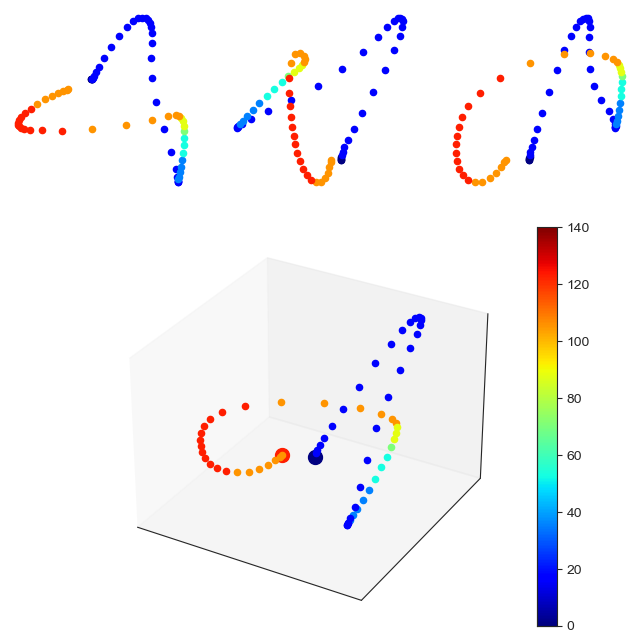

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (422, 422)


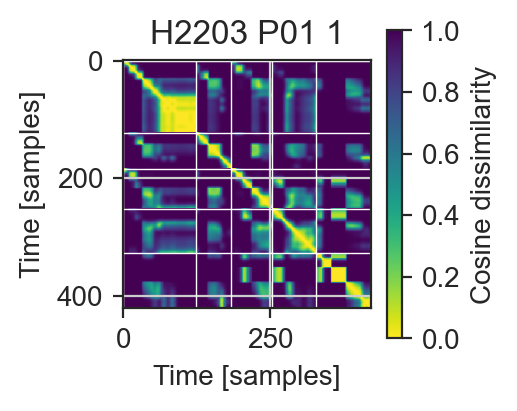

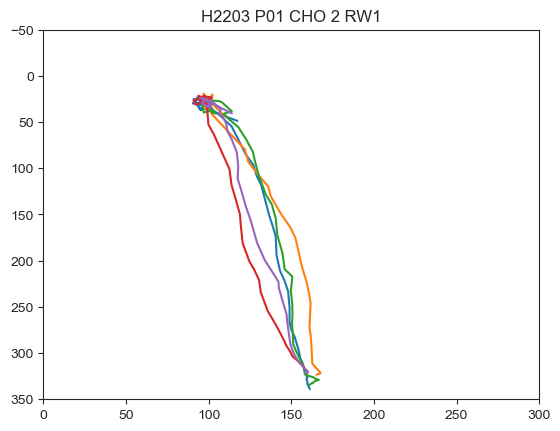

0.25338398006922874
0.22131907609771523
-0.031117322929299685


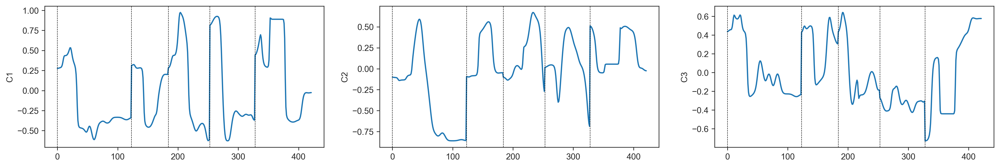

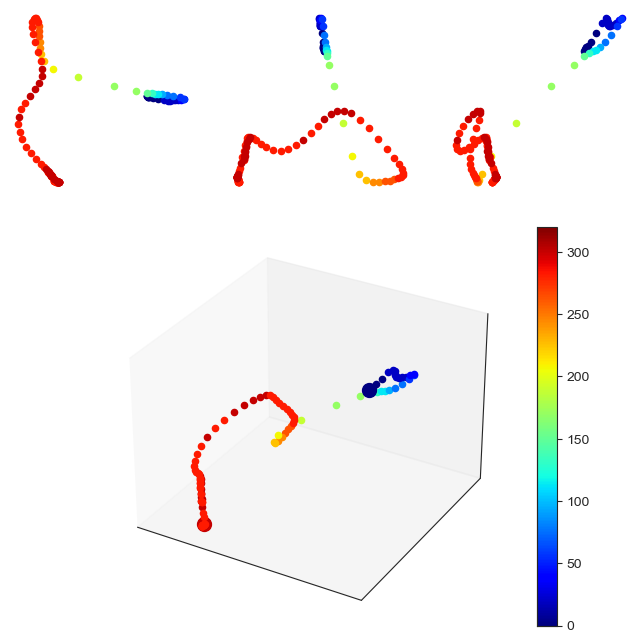

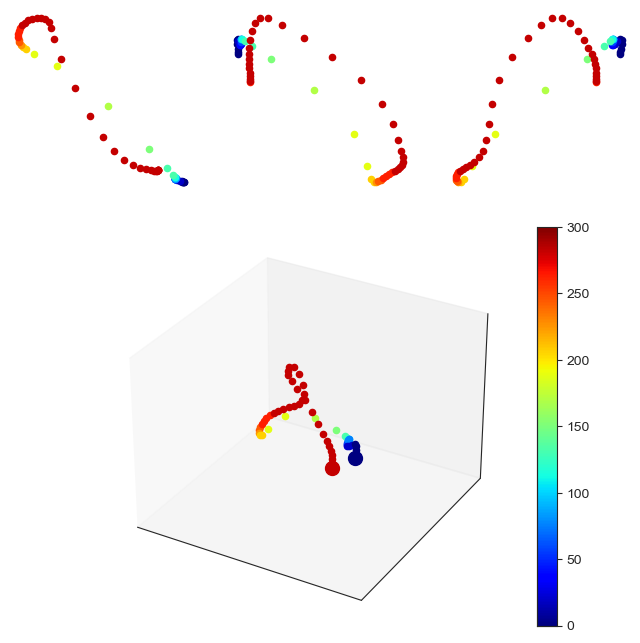

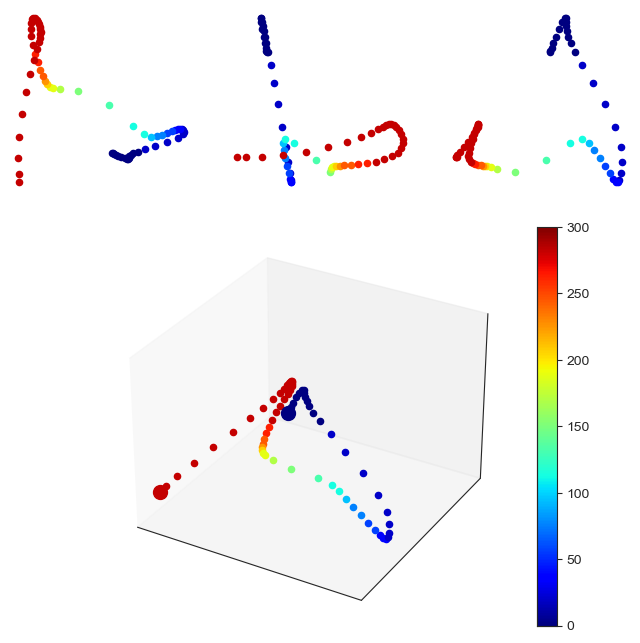

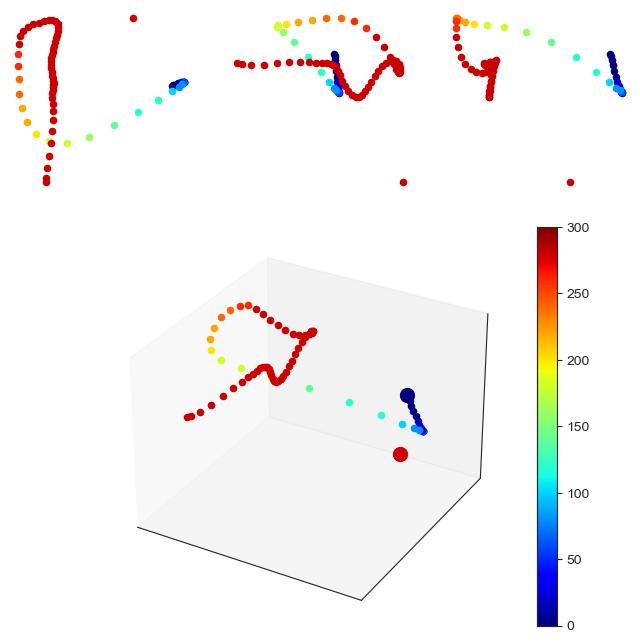

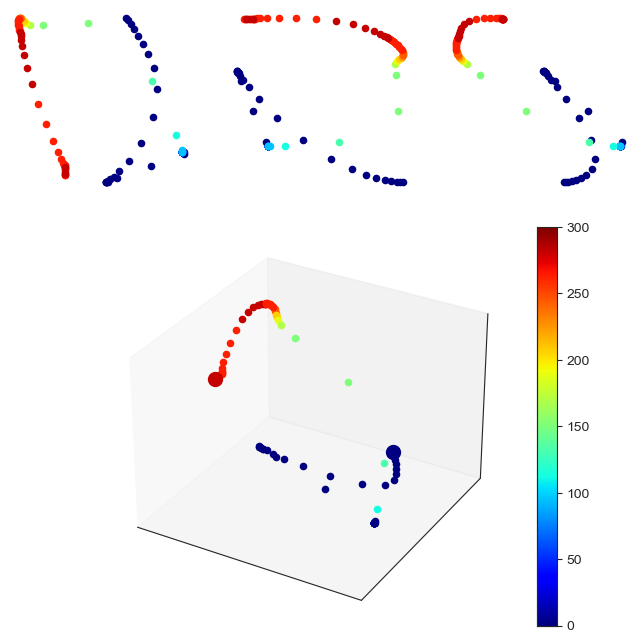

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (724, 724)


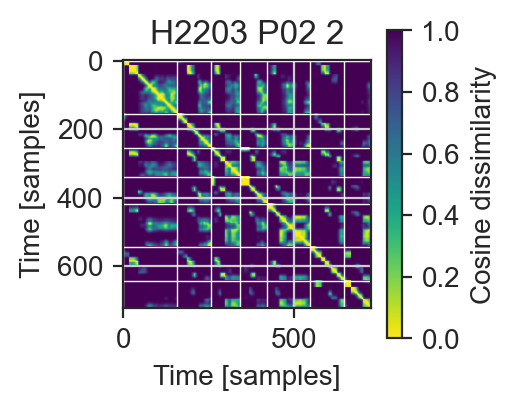

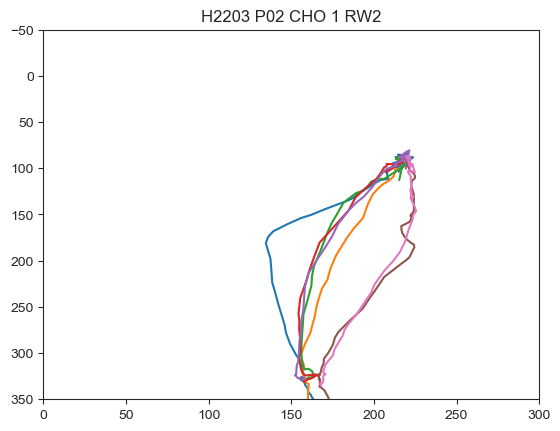

0.6392360509679497
-0.11624213852383912
0.08274328327914515


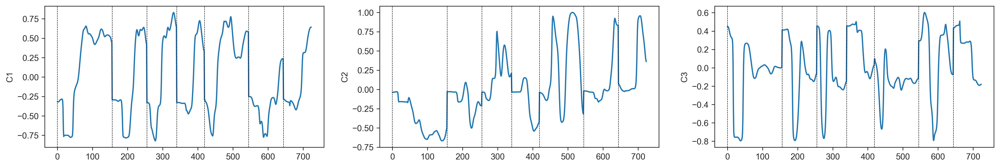

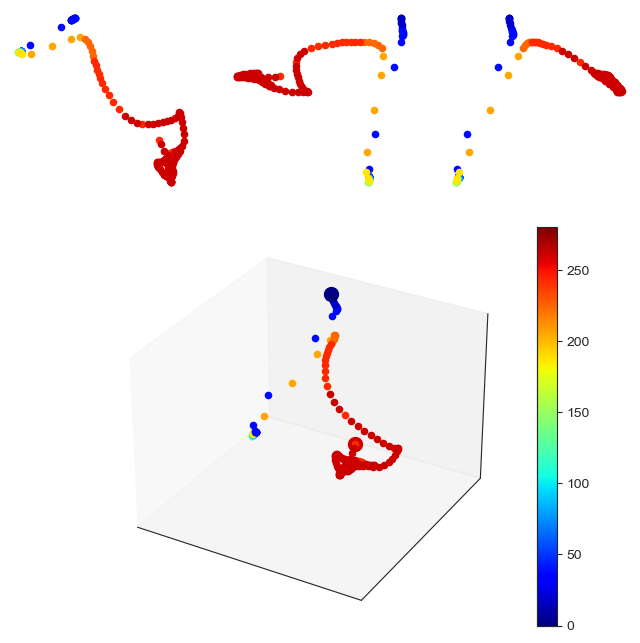

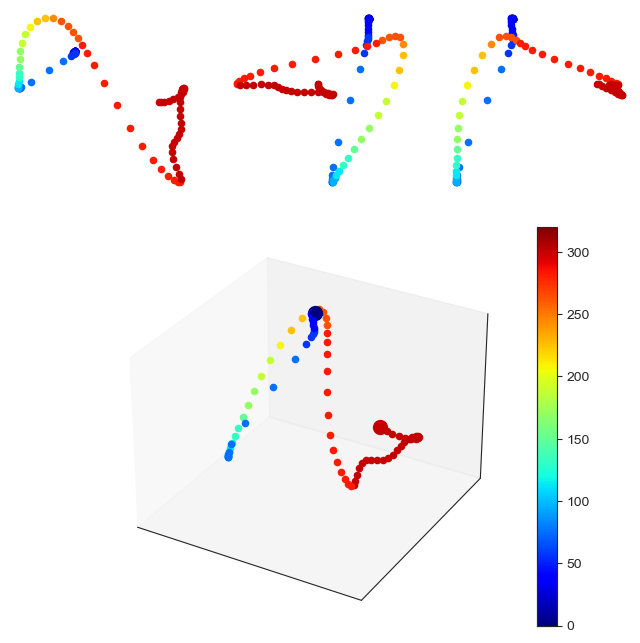

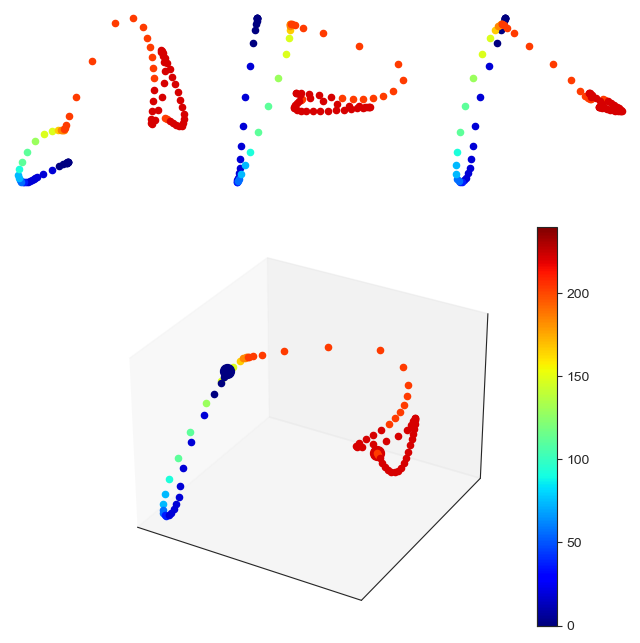

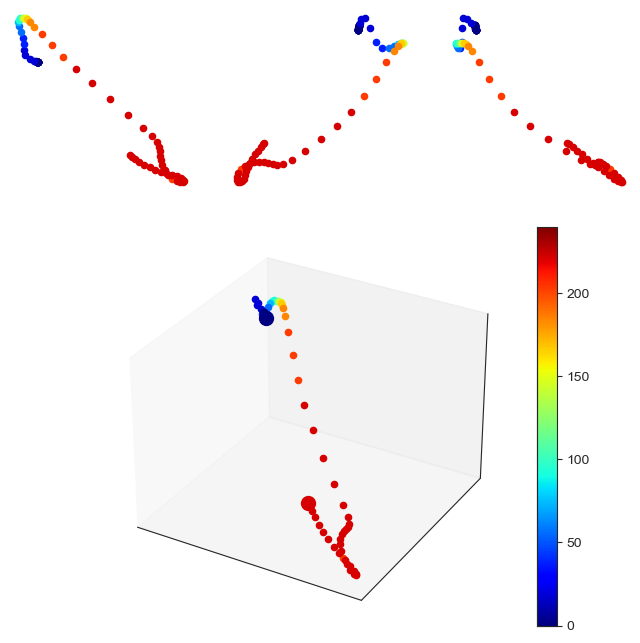

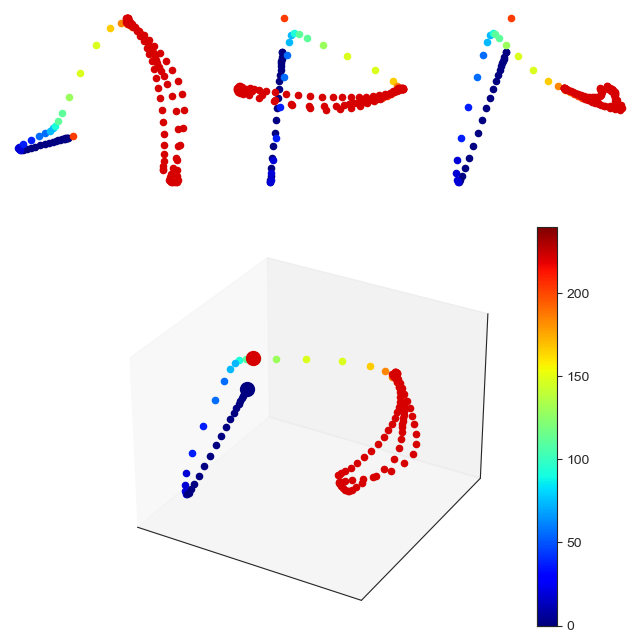

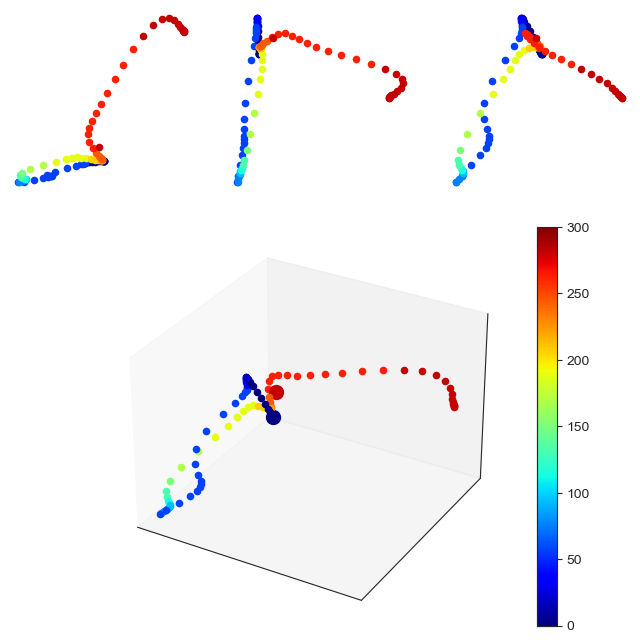

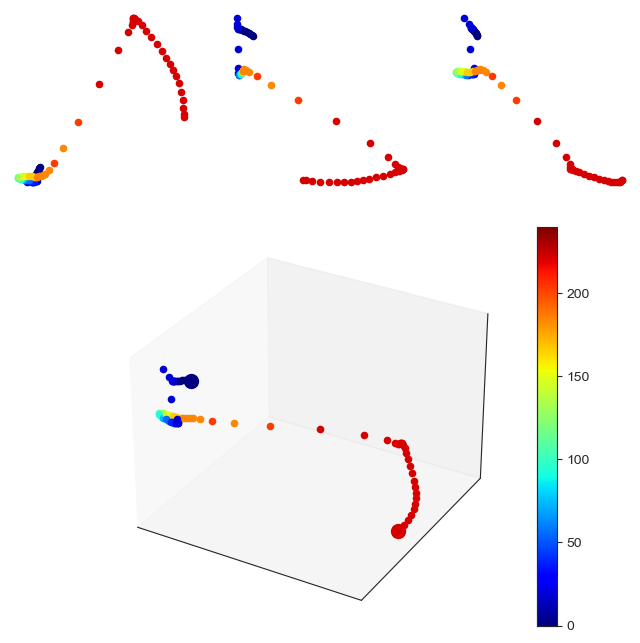

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (437, 437)


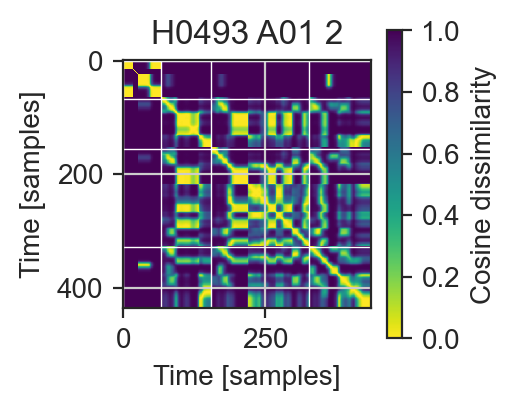

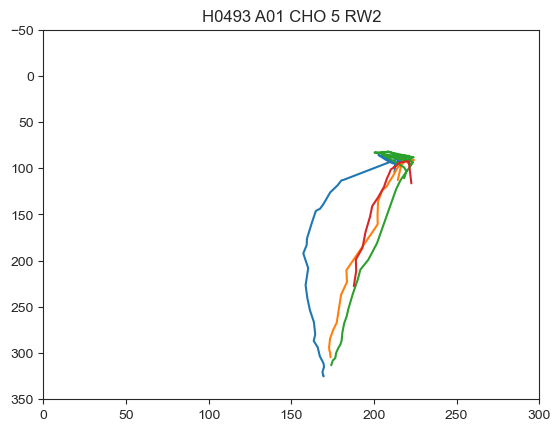

-0.020152328634795696
0.29480029076753206
0.16352170985346873


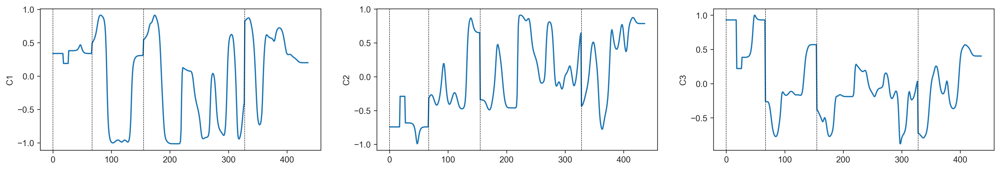

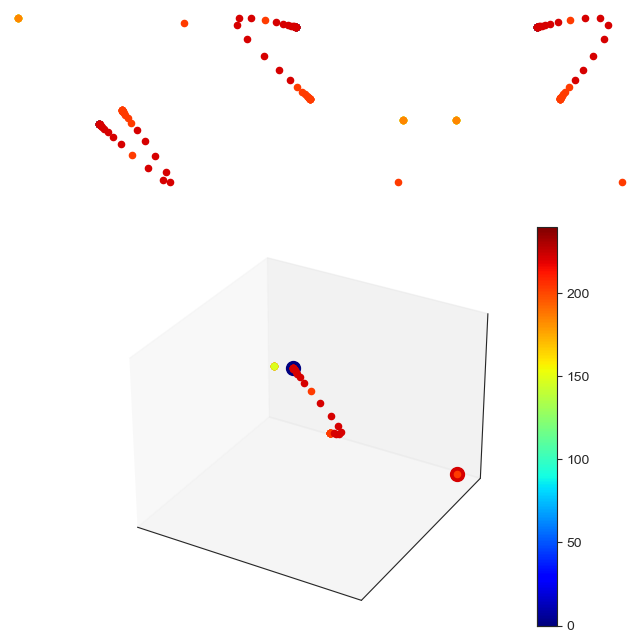

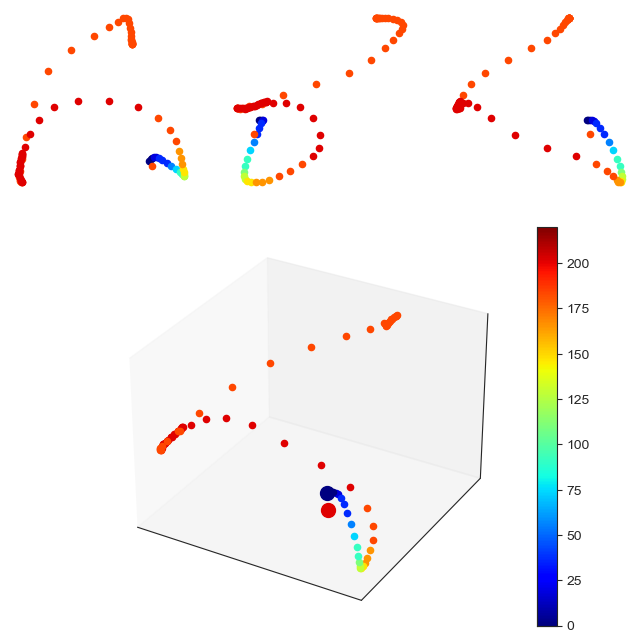

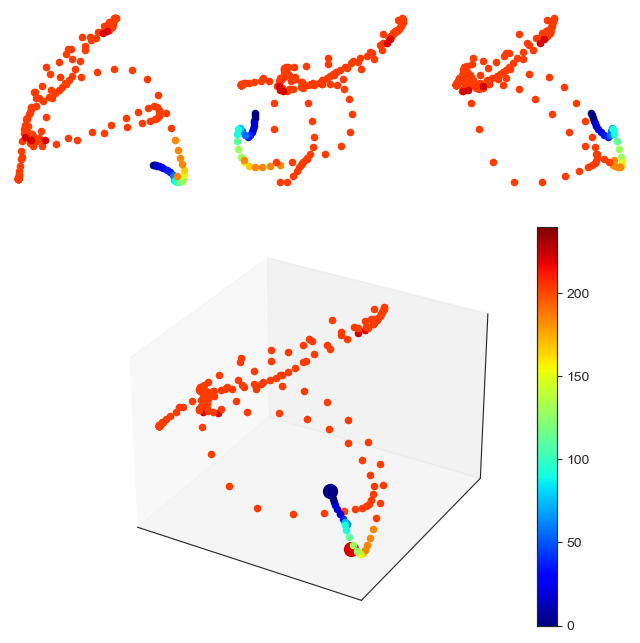

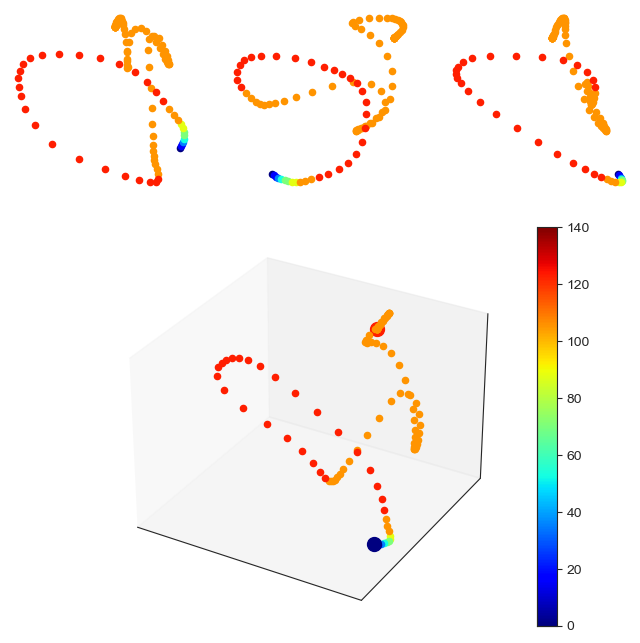

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (1186, 1186)


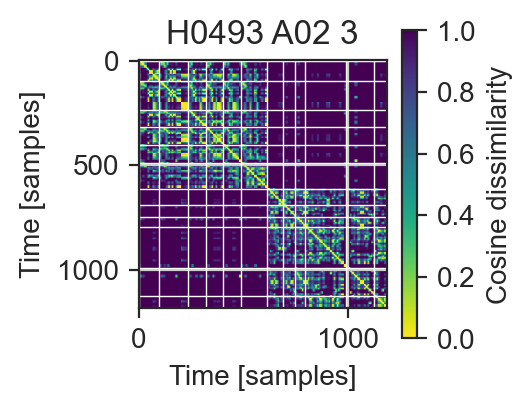

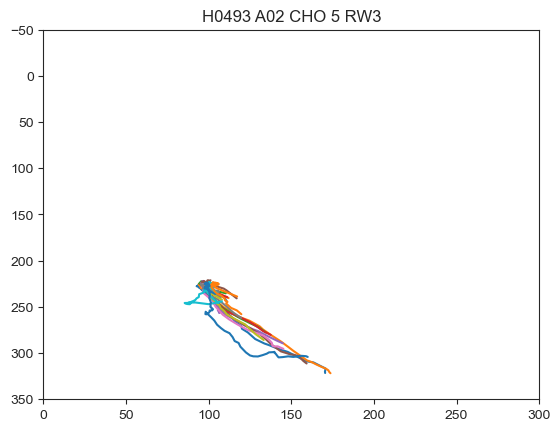

0.03791588052576394
0.23226118726509273
0.09724661987512834


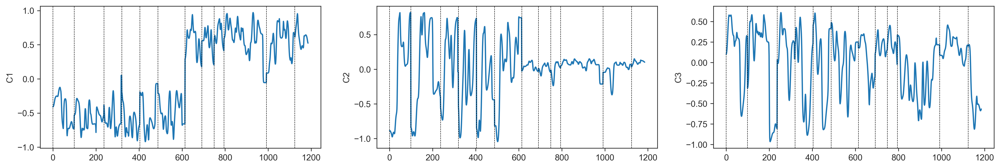

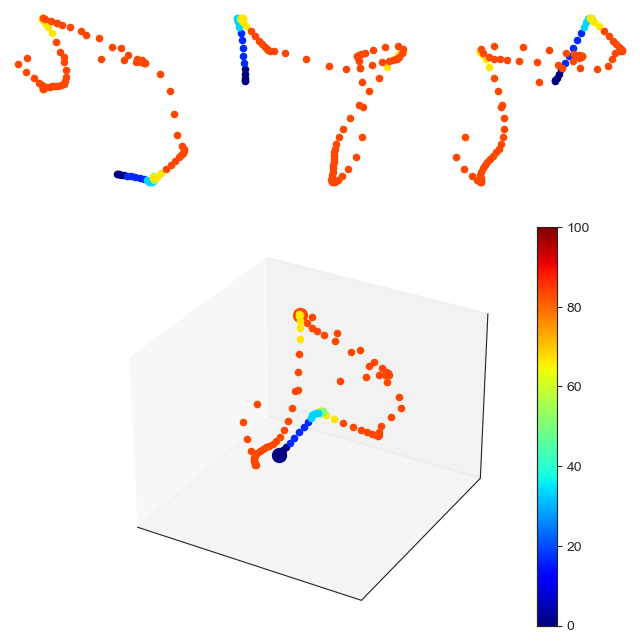

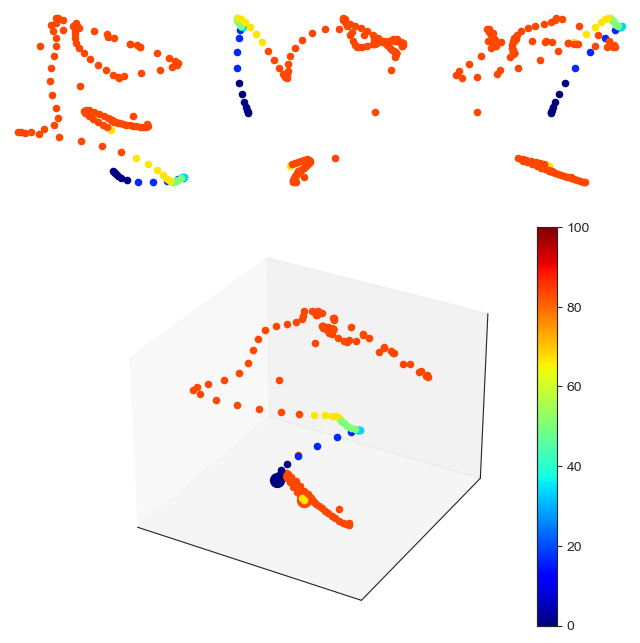

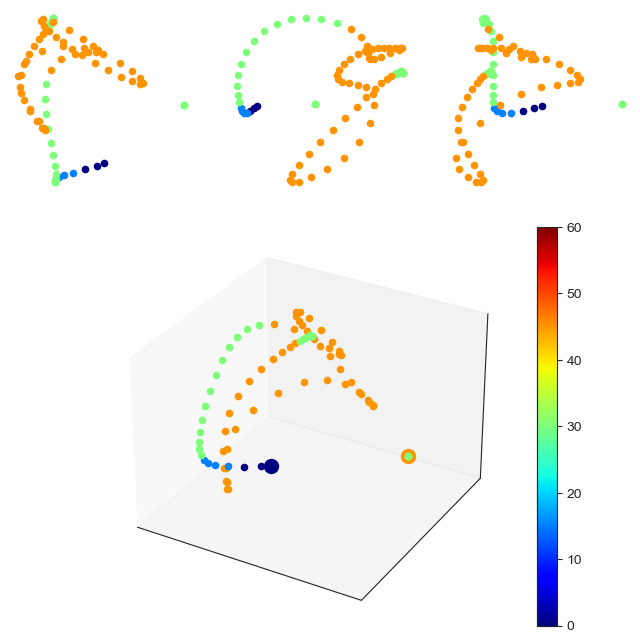

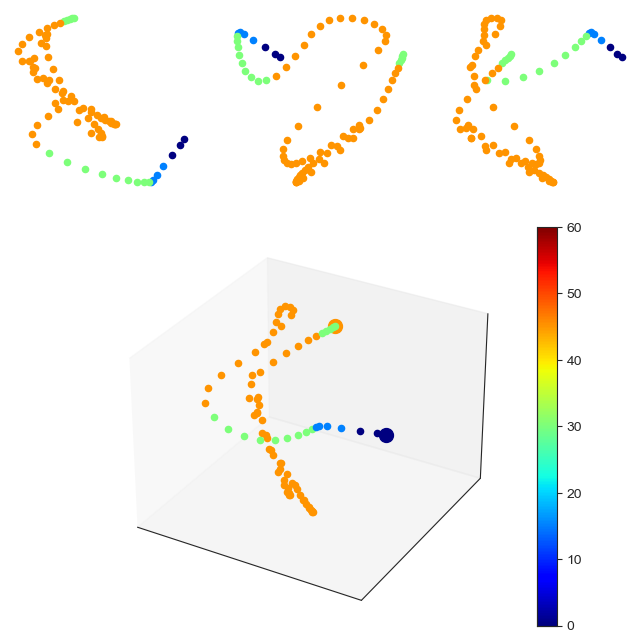

...

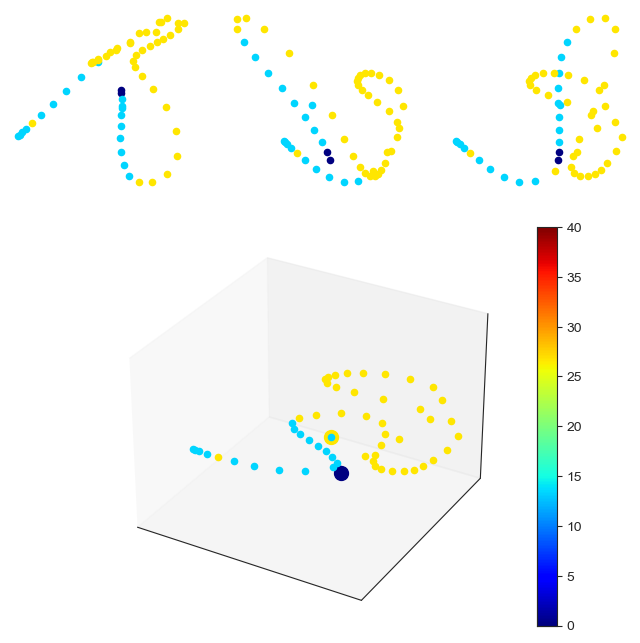

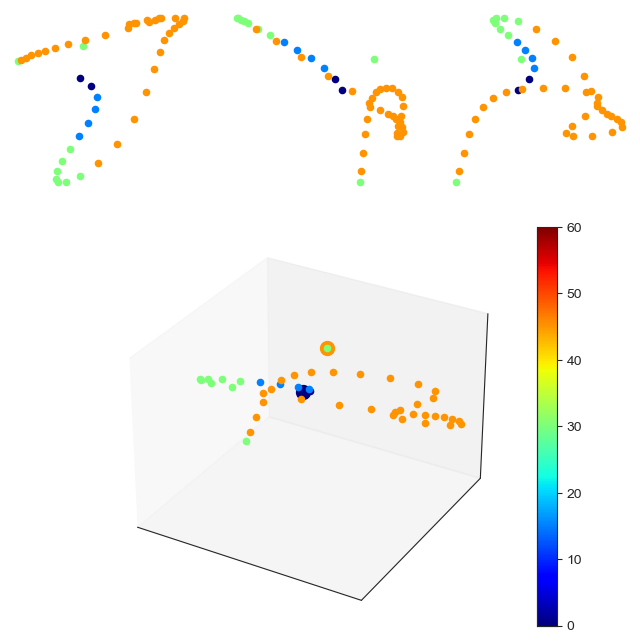

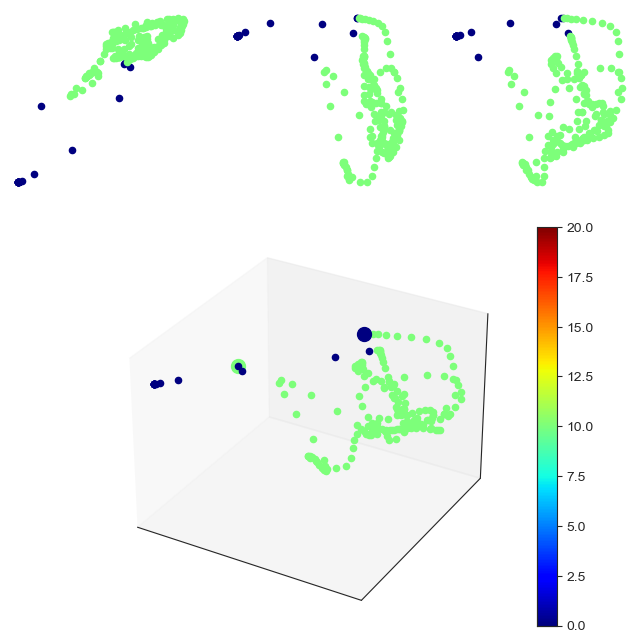

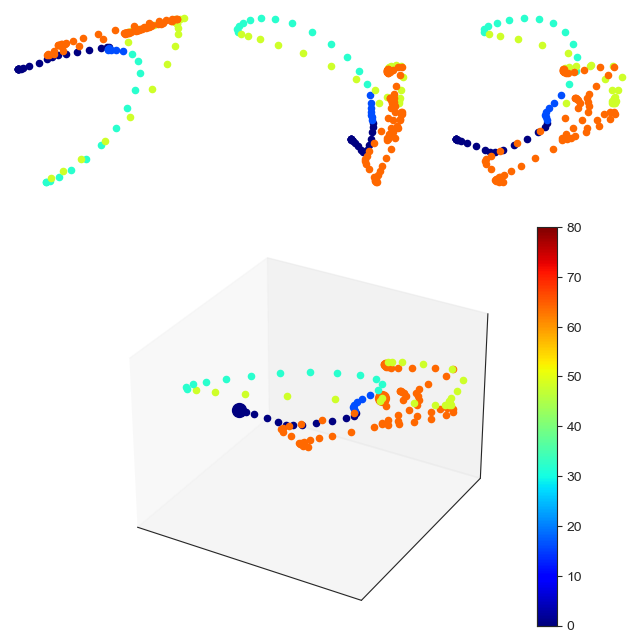

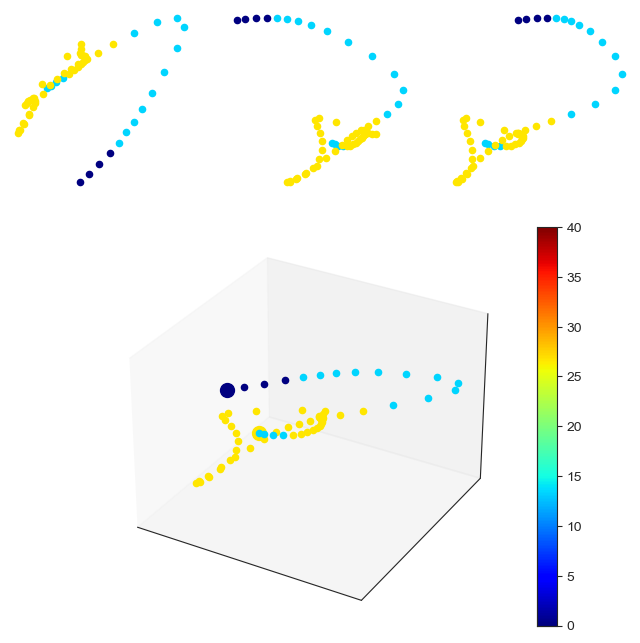

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (851, 851)


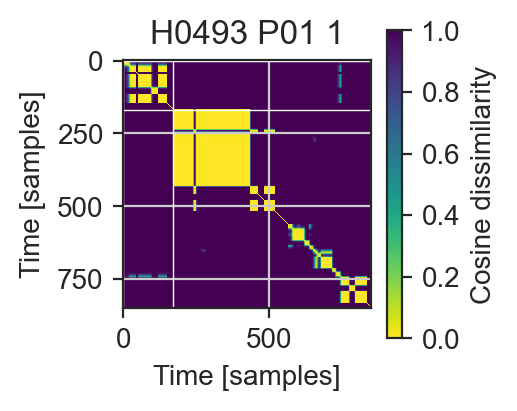

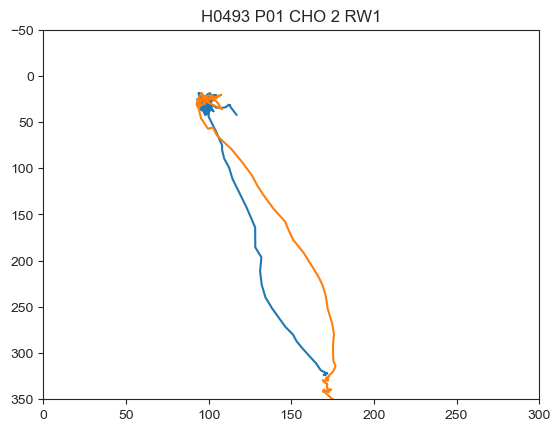

0.15152258046700223
-0.21327708065990986
0.22146606641675975


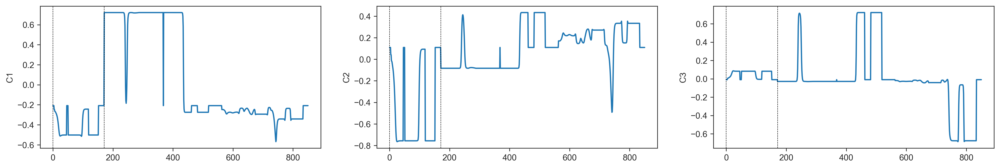

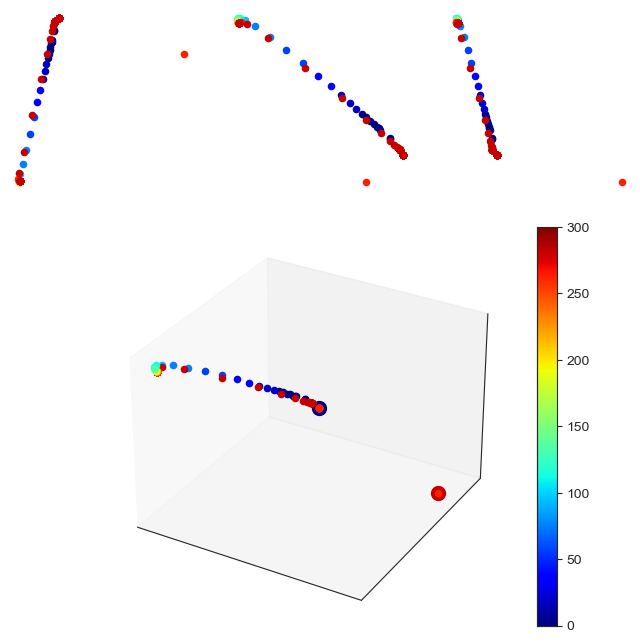

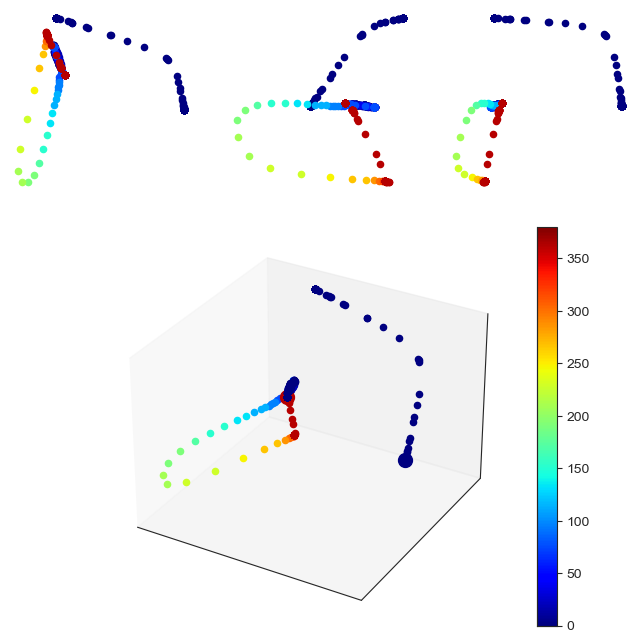

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (526, 526)


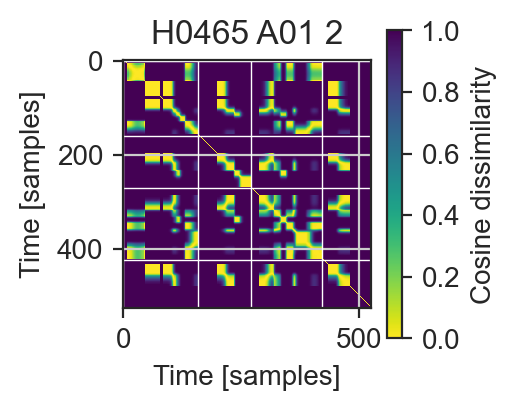

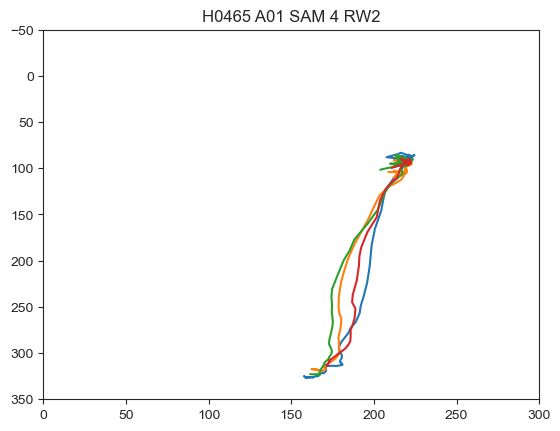

-0.03160804722094201
-0.23556015123856358
0.2860332107033521


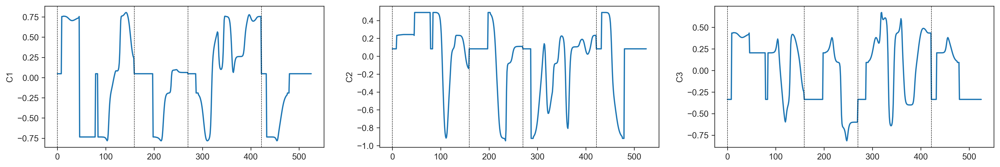

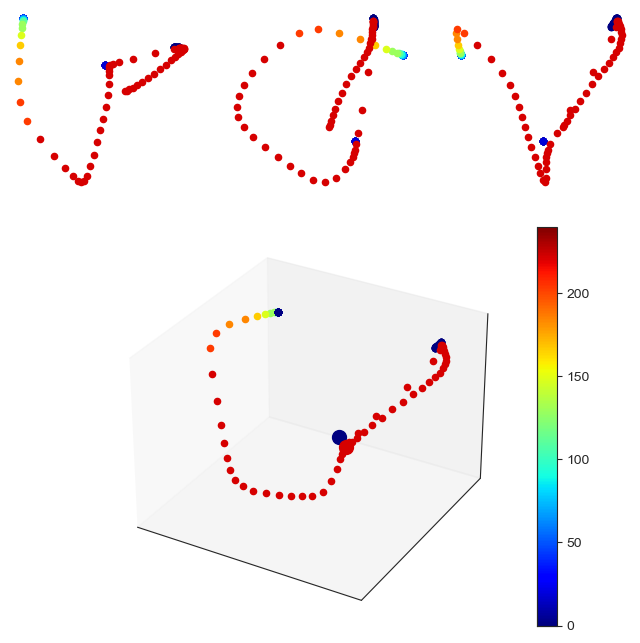

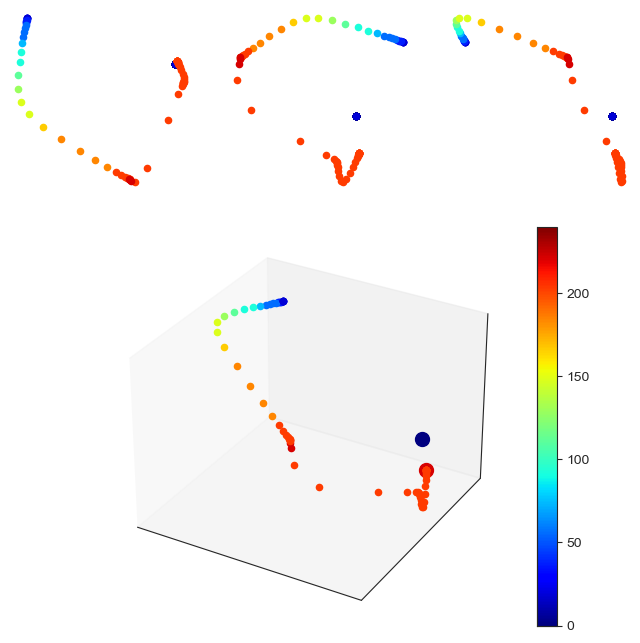

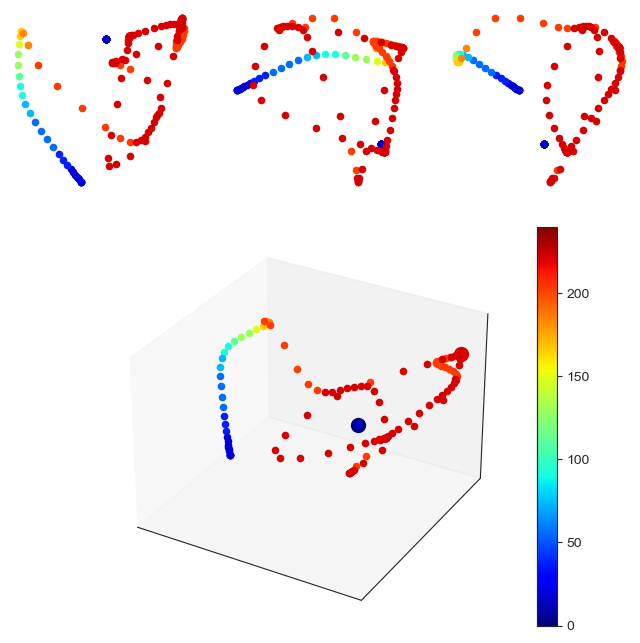

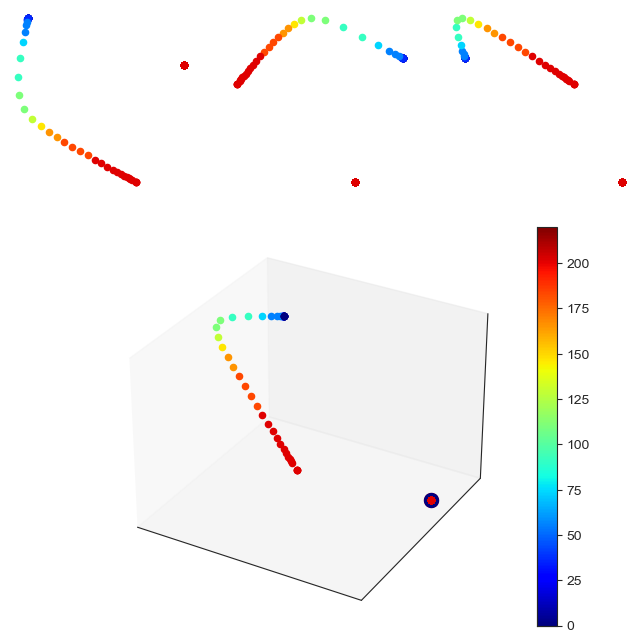

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (911, 911)


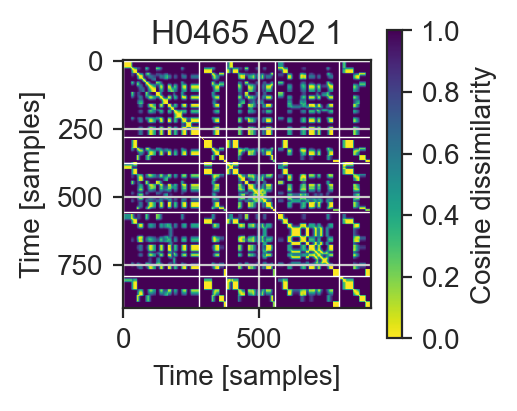

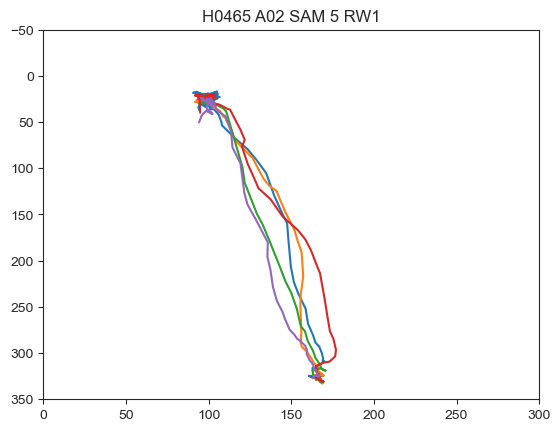

0.6476356744210994
0.4198448638369747
0.012787446753453557


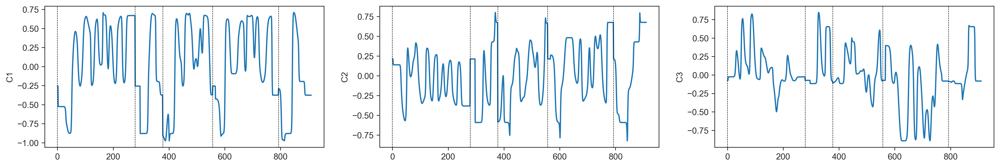

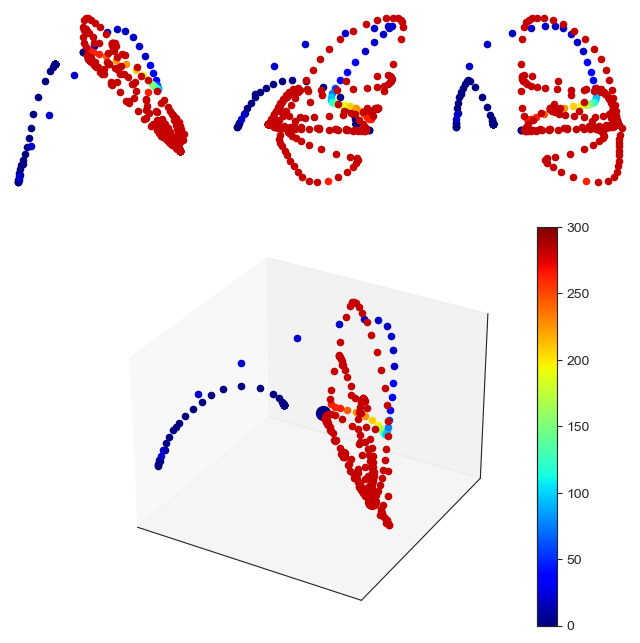

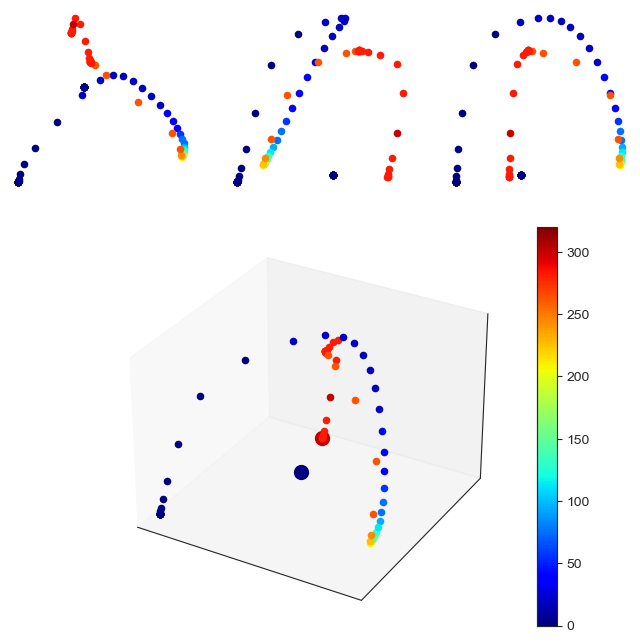

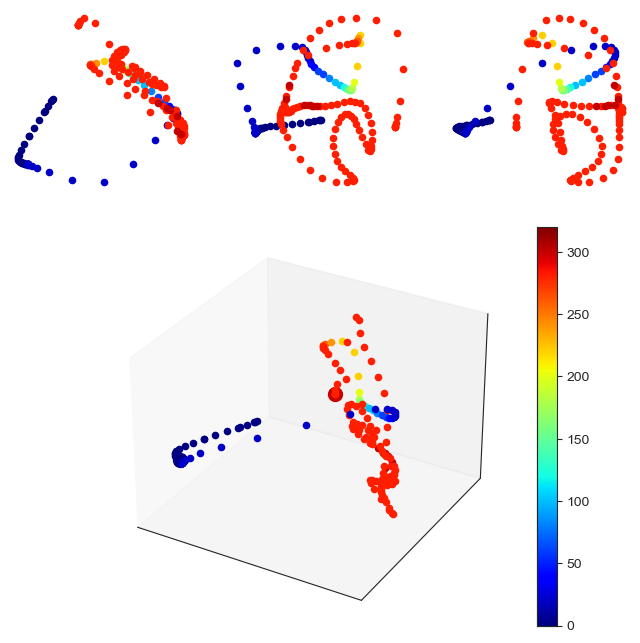

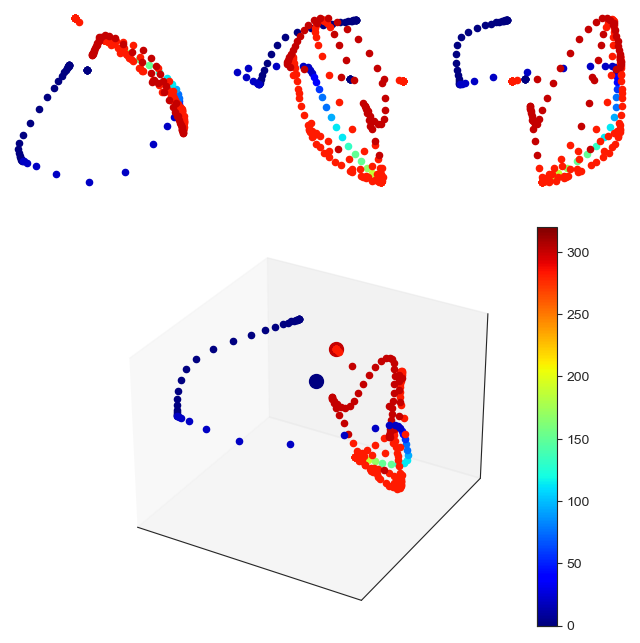

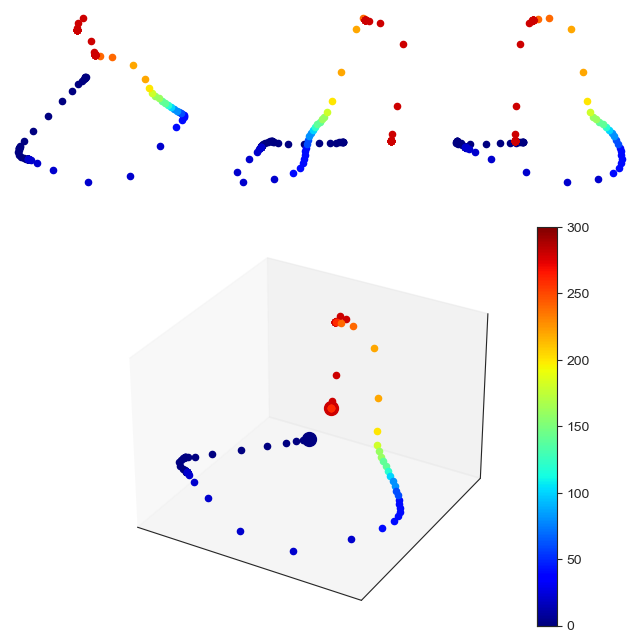

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (3823, 3823)


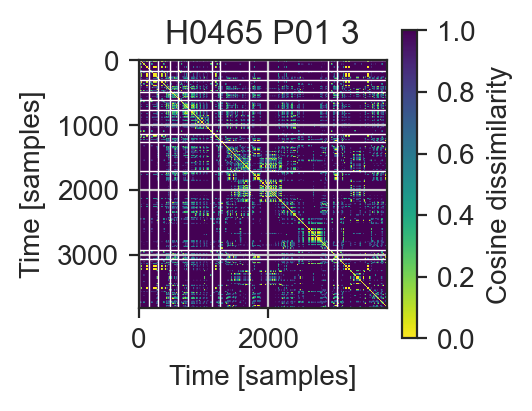

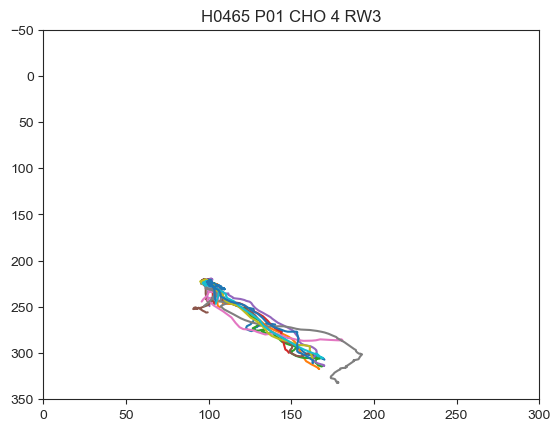

0.3045636742639405
0.07009923449539601
0.11546290844862157


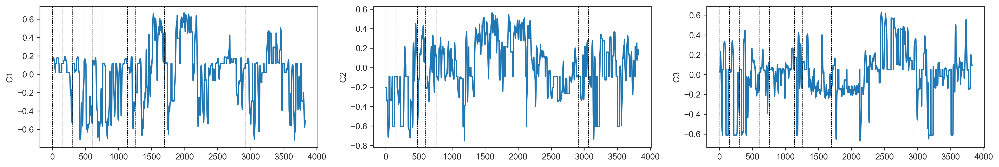

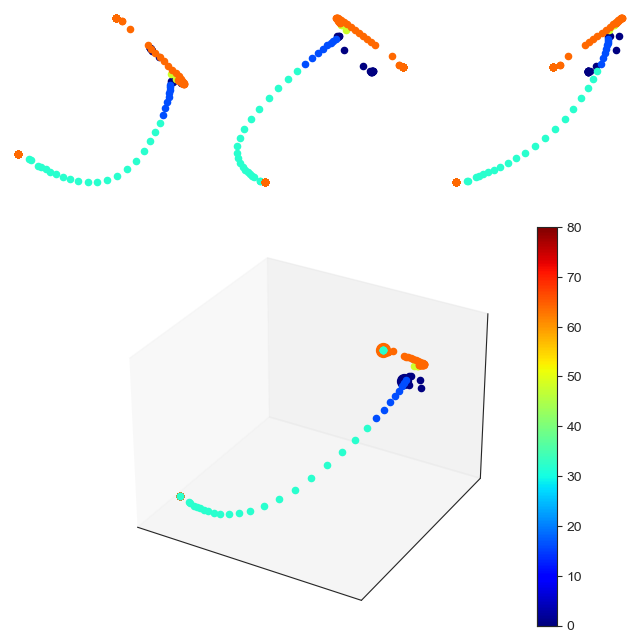

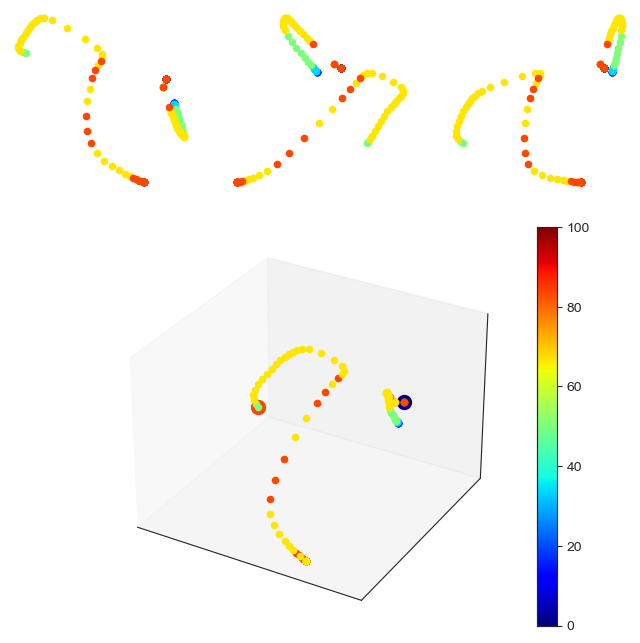

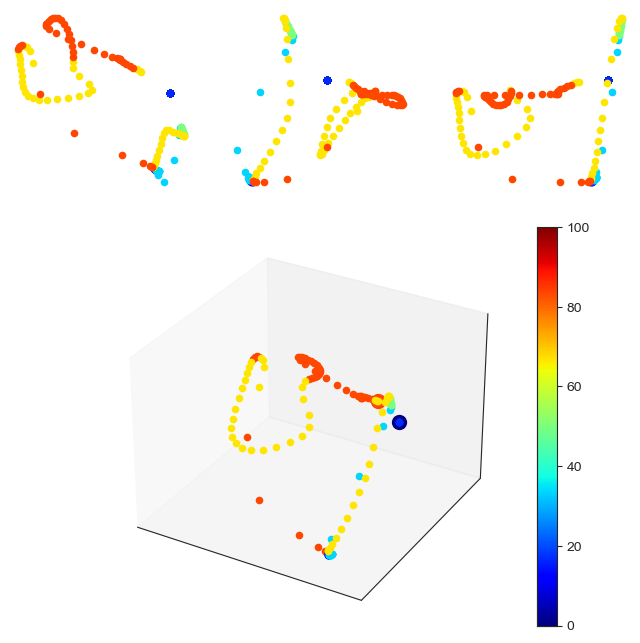

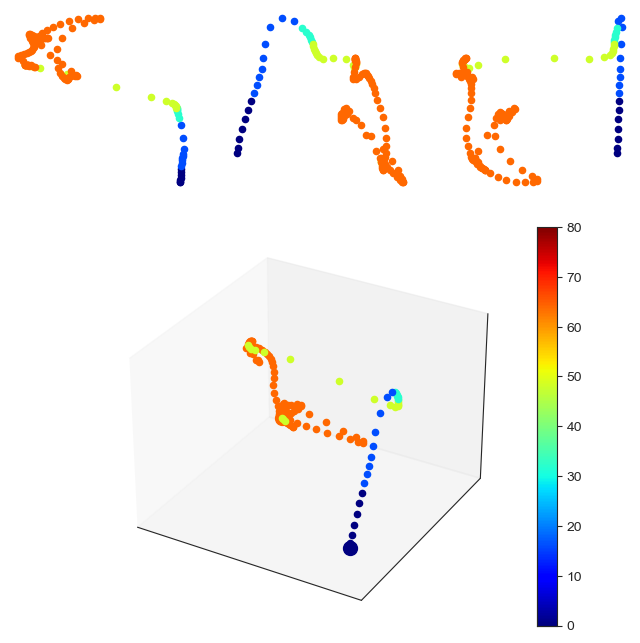

...

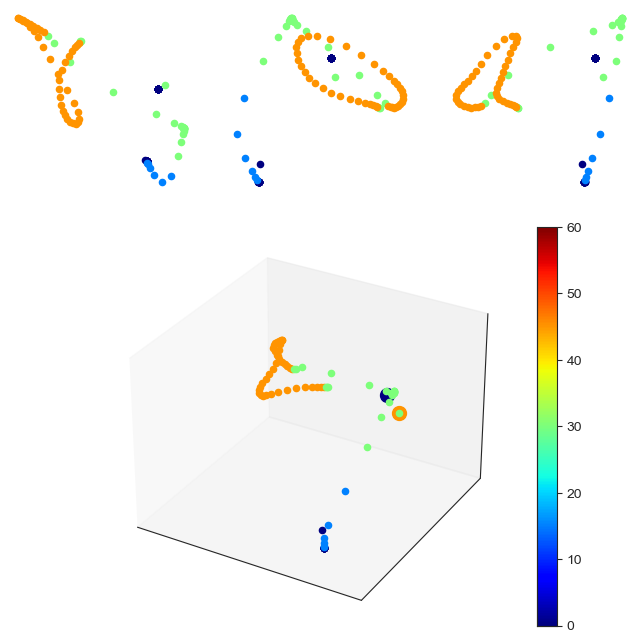

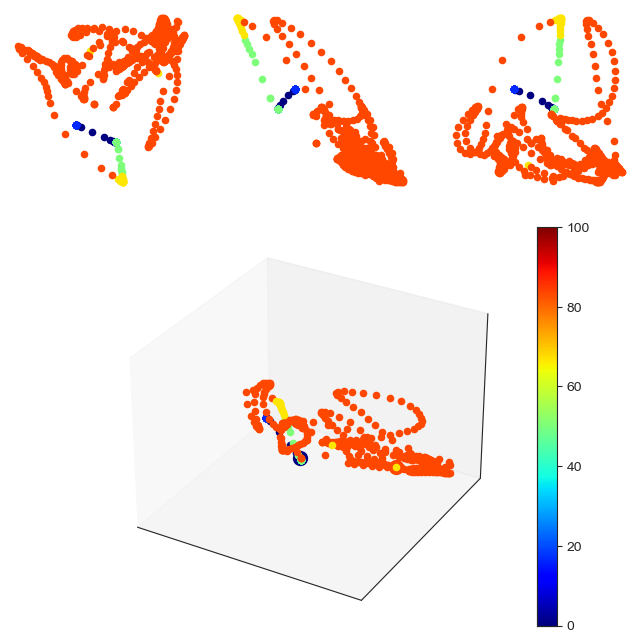

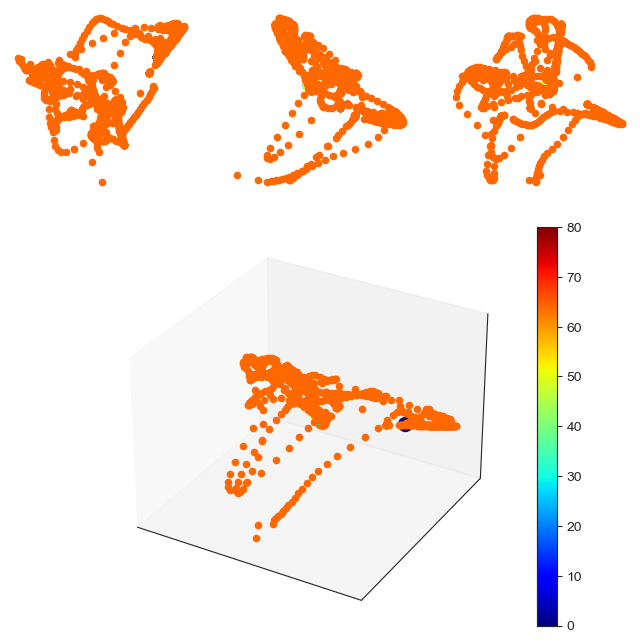

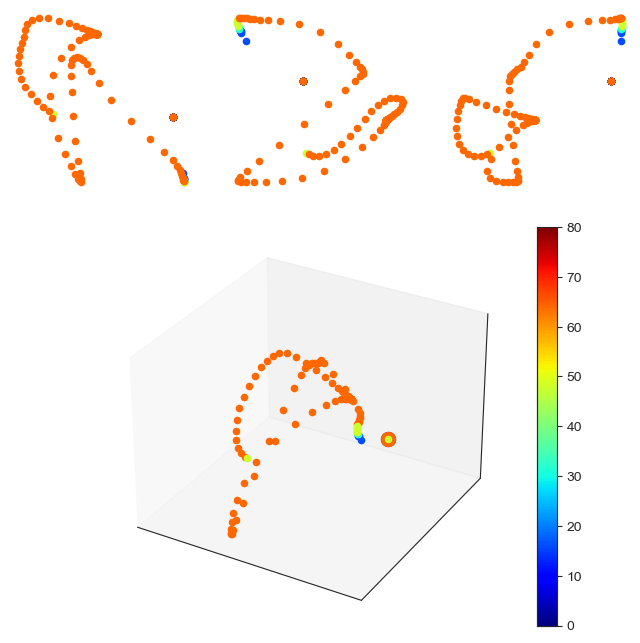

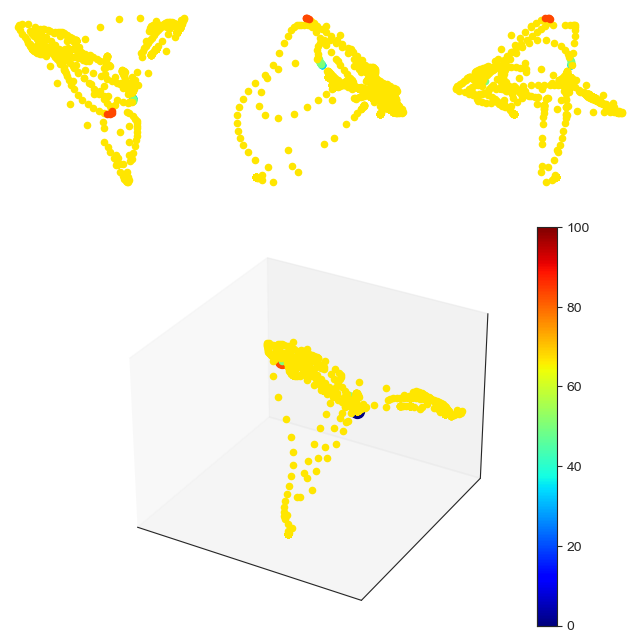

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


D= (442, 442)


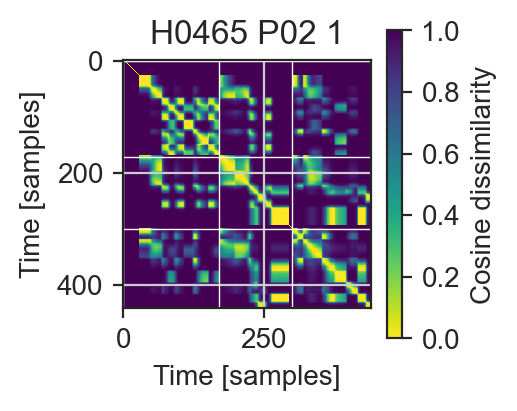

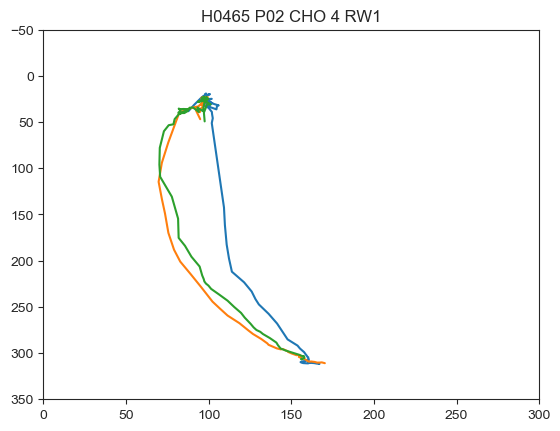

0.4719147906626311
-0.14924320108829145
0.06607859487199606


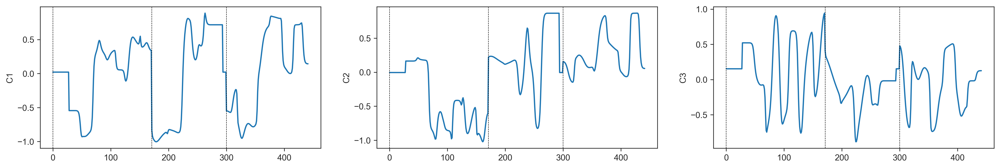

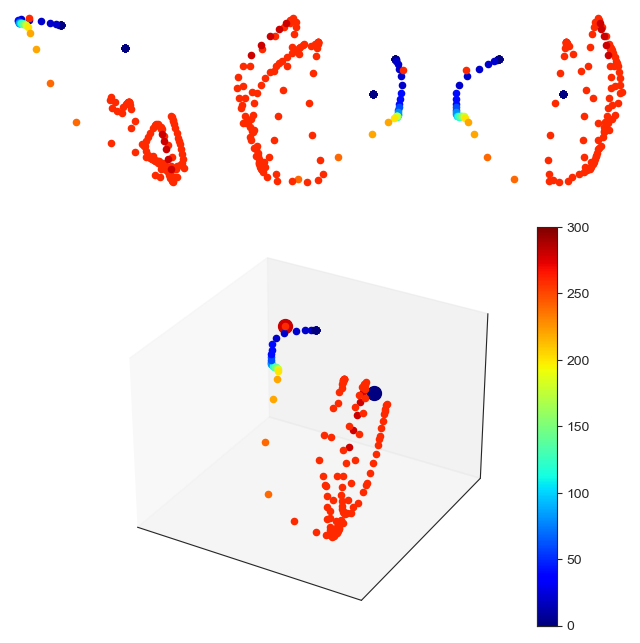

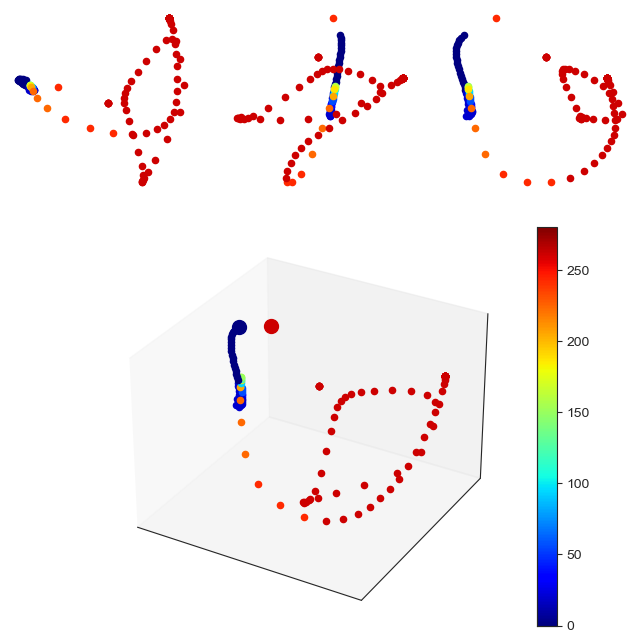

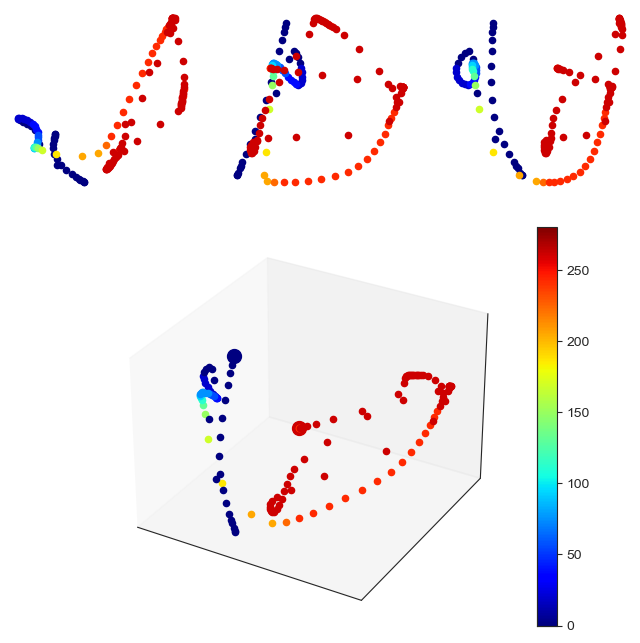

/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [23]:
plt_D = True
cal_mds = True
plt_mds = True
plt_outbound = True
plt_tri = True
t_startbox  = 0
dim  = []; JSD_all = {'SW1':[], "SW2":[], "SW3":[]}
eval_df = pd.DataFrame({'Animal':[], "Session":[], 'RW':[], 'E vals': []})
Corr_df = pd.DataFrame({'Animal':[], "Session":[], 'Corr x': [], 'Corr y': [], 'Corr z': []})
for animal in ANIMALS:
    animDIR = dataDir + str(animal) + '/01_Aligned_LR/3_Advanced'
    a_dims = []
    for session in aniSESSIONS[animal]:
        SAM = pd.read_csv(animDIR+'/'+animal+'_'+session+'_SAM_event_dlc_LR.csv')
        CHO = pd.read_csv(animDIR+'/'+animal+'_'+session+'_CHO_event_dlc_LR.csv')
        
        #Isolate inodividual trials
        SAM_trial = trial_activity(SAM, TRIALS, animal, session, 'SAM', t_startbox=t_startbox)
        CHO_trial = trial_activity(CHO, TRIALS, animal, session, 'CHO', t_startbox=t_startbox)

        #Restrict to moving points only (optional)
#         SAM_trial = SAM_trial[SAM_trial['Movement']=='moving'].reset_index(drop=True)
#         CHO_trial = CHO_trial[CHO_trial['Movement']=='moving'].reset_index(drop=True)

        #Restrict to outbound trajectory only (optional)
        SAM_trial = SAM_trial.reset_index(drop=True)
        SAM_trial, RW = outbound_activity(SAM_trial)
        SAM_trial = SAM_trial.reset_index(drop=True)
        SAM_y = SAM_trial['position'].values
        SAM_y[SAM_trial[SAM_trial['Location'] == 'SB'].index]=12

        #Restrict to outbound trajectory only (optional)
        CHO_trial = CHO_trial.reset_index(drop=True)
        CHO_trial, RW = outbound_activity(CHO_trial)
        CHO_trial = CHO_trial.reset_index(drop=True)
        CHO_y = CHO_trial['position'].values
        CHO_y[CHO_trial[CHO_trial['Location']== 'SB'].index]=12
        y = list(SAM_y) + list(CHO_y)
        
        #Extract trial idxs
        SAM_idxs = []
        for tr in np.unique(SAM_trial['Trial']):
            SAM_idxs.append(SAM_trial[SAM_trial['Trial']==tr].index[0])
        if len(SAM_idxs) > 0:
            end_SAM = SAM_trial[SAM_trial['Trial']==tr].index[-1]
        CHO_idxs = []
        for tr in np.unique(CHO_trial['Trial']):
            if len(SAM_idxs) > 0:
                CHO_idxs.append(CHO_trial[CHO_trial['Trial']==tr].index[0]+end_SAM)
            else:
                CHO_idxs.append(CHO_trial[CHO_trial['Trial']==tr].index[0])
        trial_idxs = SAM_idxs+CHO_idxs
        
        #Create Neural pop matrix
        SAM_cells = [i for i in SAM_trial.columns if i.startswith(' C')]
        CHO_cells = [i for i in CHO_trial.columns if i.startswith(' C')]
        SAMCHO_cells = list(set(SAM_cells) & set(CHO_cells))
        SAM_X = SAM_trial[SAMCHO_cells].values.T
        CHO_X = CHO_trial[SAMCHO_cells].values.T
        X = np.concatenate((SAM_X.T, CHO_X.T)).T
        
        #Loop through each SAM & CHO trial, smooth and concat
        i = 0
        while i < len(trial_idxs):
            if i < len(trial_idxs)-1:
                X[:,trial_idxs[i]:trial_idxs[i+1]] = gaussian_filter1d(X[:,trial_idxs[i]:trial_idxs[i+1]], 4)
            else:
                X[:,trial_idxs[i]:] = gaussian_filter1d(X[:,trial_idxs[i]:], 4)
            i+=1
        X = np.array([i for i in X if np.sum(i) > 0]).T 
        
        #Compute cosine distance
        if len(X) > 0:
            D = cosine_distances(X)
            
            #plot x y position coloured by distance from SB
            if plt_outbound:
                SW_loc = [float(s) for s in re.findall(r'-?\d+\.?\d*', SAM['SW_locs'].values[0])]
                SW_loc = {'SW1':[SW_loc[0],SW_loc[1]], 
                          'SW2':[SW_loc[2], SW_loc[3]],
                          'SW3':[SW_loc[4], SW_loc[5]]}
                SWs = np.array(list(SW_loc.values()))
                SAMCHO = SAM_trial.append(CHO_trial)
                                    
#                 fig = plt.subplots(figsize=(8, 1), dpi=200)
#                 gs = gridspec.GridSpec(1, 14)
#                 plt_col = 0; plt_row = 0
#                 dis = []; stages_ = []; trials_ = []
#                 for stage in ['SAM', 'CHO']:
#                     STAGE_TR = SAMCHO[SAMCHO['Stage']==stage]
#                     STAGE_TR = STAGE_TR.reset_index(drop=True)
#                     for tr in np.unique(STAGE_TR['Trial']):
#                         TRI = STAGE_TR[STAGE_TR['Trial']==tr]
#                         RW = TRI['Reward Well'].values[0]
#                         ix = TRI['x'].values
#                         iy = TRI['y'].values
#                         SB = np.max(iy)
#                         dis_ = [40 * round((SB-i)/40) if i < SB else 0 for i in iy]
#                         dis += dis_
#                         stages_.append([stage]*len(TRI))
#                         trials_.append([tr]*len(TRI))
#                 stages_ = [x for xs in stages_ for x in xs]
#                 trials_ = [x for xs in trials_ for x in xs]
#                 df = pd.DataFrame({'x':ix, 'y':iy, 'Distance':dis})
                
#                 plt.subplot(gs[plt_row, plt_col])
#                 sns.set()
#                 colors = plt.cm.jet(np.linspace(0,1,len(df.Distance.unique())+1))
#                 for i, d in enumerate(df.Distance.unique()):
#                     plt.scatter(df.x[df.Distance==d],df.y[df.Distance==d], 
#                                color=colors[i], label=d, s=5)

#                 plt.scatter(SWs[:,0], SWs[:,1], edgecolors = [color_dic['SW1'], color_dic['SW2'], color_dic['SW3']],facecolors='none', s=50)
#                 plt.gca().invert_yaxis()
#                 plt.xlim(0,300)
#                 plt.ylim(350,-50)
#                 plt.axis('off')
                       
#                         plt_col+=1
#                 plt.savefig(SaveTo3 +  'Panel B_Cosine_distance/Session/Trial DLC/%s/%s_%s_dlc.svg' %(animal, animal, session), bbox_inches="tight")
#                 plt.show()
                if plt_D:
                    print('D=',D.shape)
                    #Plot Cosine distance matrix
                    plt.figure(figsize=(2,2), dpi=200)
                    plt.imshow(D, cmap='viridis_r', interpolation='None'); cbar = plt.colorbar(); cbar.set_label('Cosine dissimilarity')

                    #Loop through trials and add trial lines
                    for trial in trial_idxs:
                        plt.axvline(x=trial, color='white', linewidth=0.5, linestyle='-')
                        plt.axhline(y=trial, color='white', linewidth=0.5, linestyle='-')
                    plt.grid(b=None)
                    plt.title('%s %s %s' %(animal, session, RW))
                    plt.xlabel('Time [samples]'); plt.ylabel('Time [samples]')
#                     plt.savefig(SaveTo3 +  'Panel B_Cosine_distance/Session/%s/%s_%s_dis_adj.svg' %(animal, animal, session), bbox_inches="tight")
                    plt.show()
                
                #plot MDS neural manifold       
                if cal_mds: 
                    #Compute MDS manifold
                    x_embd,evals = cmdscale(D)
                    #MDS of cosine distance

                    #Calculate explained variance per eval
                    pos_evals = [e for e in evals if e > 0]
                    sum_evals = np.sum(pos_evals)
                    var_exp = np.cumsum(pos_evals/sum_evals) #cumulative summation
                    eval_df = eval_df.append(pd.DataFrame({'Animal':animal, 
                                                           "Session":session, 
                                                           'RW':RW, 
                                                           'E vals':var_exp}))

                    x_embd = x_embd / np.max(x_embd)
                                        
#                     #Compute intrinsic dimensionality
#                     nstep = 30
#                     Nneigh, radii, p = intrinsic_dimensionality(x_embd, nstep=nstep, metric='euclidean', fit='std', thr_start=10, thr_fi=5e3)
#                     a_dims.append(p[0])
#                     AXIS_LIM = np.max(x_embd)
#                     MIN = np.min(x_embd)
                    
                    #Calculate x distance from SB
                    dis = []; stages_= []; trials_ = []; tx = [];ty = []
                    for stage in ['SAM', 'CHO']:
                        STAGE_TR = SAMCHO[SAMCHO['Stage']==stage]
                        STAGE_TR = STAGE_TR.reset_index(drop=True)
                        dis_ = []
                        for tr in np.unique(STAGE_TR.Trial): 
                            TRI = STAGE_TR[STAGE_TR['Trial']==tr]
                            ix = list(TRI['x'].values)
                            iy = list(TRI['y'].values)

                            SB = np.max(iy)
                            dis_ = [20 * round((SB-i)/20) if i < SB else 0 for i in iy]
                            dis += dis_
                            stages_ += ([stage]*len(TRI))
                            trials_ += [tr]*len(TRI)
                            tx += ix; ty += iy
                            plt.plot(ix,iy)
#                             plt.gca().invert_xaxis()
                            plt.title(animal + ' ' + session + ' ' +stage + ' ' +str(tr) + ' RW' +str(RW))
                    plt.xlim(0,300)
                    plt.ylim(350,-50)        
                    plt.show()
                
                    #Save embedding and distances to dataframe
                    df = pd.DataFrame({'Session':[session]*len(stages_), 
                                       'Stage':stages_, 
                                       'Trial':trials_, 
                                       'x':x_embd[:,0], 
                                       'y':x_embd[:,1],
                                       'z':x_embd[:,2],
                                       'posx':tx,'posy':ty,
                                       'Distance':dis})
                    
                    corrx, corry, corrz = df_correlation(df)
                    Corr_df = Corr_df.append(pd.DataFrame({'Animal':[animal], "Session":[session], 'Corr x':[corrx], 'Corr y':[corry], 'Corr z':[corrz]}))

                    fig = plt.subplots(figsize=(20, 3), dpi=300)
                    gs = gridspec.GridSpec(1, 3)
                    plt.subplot(gs[0])
                    plt.plot(df['x'])
                    plt.ylabel('C1')
                    for trial in trial_idxs:
                        plt.axvline(x=trial, color='k', linewidth=0.5, linestyle='--')
                    plt.grid(False)
                    plt.subplot(gs[1])
                    plt.plot(df['y'])
                    plt.ylabel('C2')
                    for trial in trial_idxs:
                        plt.axvline(x=trial, color='k', linewidth=0.5, linestyle='--')
                    plt.grid(False)
                    plt.subplot(gs[2])
                    plt.plot(df['z'])
                    for trial in trial_idxs:
                        plt.axvline(x=trial, color='k', linewidth=0.5, linestyle='--')
                    plt.grid(False)
                    plt.ylabel('C3')
                    plt.show()
                    #Define tailored colorscheme
                    colors = plt.cm.jet(np.linspace(0,1,len(df.Distance.unique())+1))
                    
                    #plot MDS embedding
                    if plt_mds and animal == 'H2202' and session == 'P01':
                        saveto = SaveTo3 + 'Panel_C_Manifold_indiv/Stage/%s/%s_%s_MDS.svg' %(animal, animal, session)
                        session_manifold(df, colors, saveto, plt_save=False)
                    
                    #plot individual trials
                    if plt_tri:
                        for stage in ['SAM', 'CHO']:
                            STAGE_TR = SAMCHO[SAMCHO['Stage']==stage]
                            for tr in np.unique(STAGE_TR.Trial):
                                tr_df = df.loc[(df['Stage']==stage) & (df['Trial']==tr)]
                                colors = plt.cm.jet(np.linspace(0,1,len(tr_df.Distance.unique())+1))
                                saveto = SaveTo3 + 'Panel_C_Manifold_indiv/Trial/%s/%s_%s_%s_TR%s_MDS.svg' %(animal, animal, session, stage, tr)
                                session_manifold(tr_df, colors, saveto, plt_save=False)

    dim.append(np.mean(a_dims))

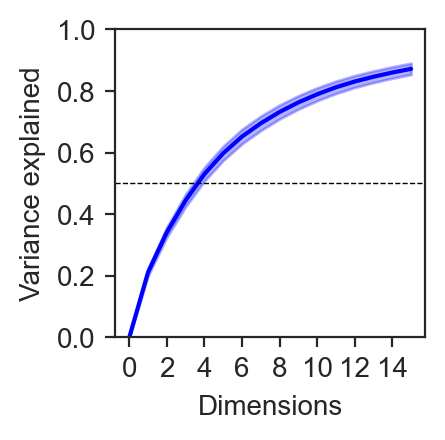

In [24]:
ALL_evals = []
for animal in ANIMALS:
    for rw in [1,2,3]:
        RW_eval = eval_df.loc[(eval_df['Animal']==animal)&(eval_df['RW']==rw)]
        for session in np.unique(RW_eval['Session']):
            rw_evals = [0]+list(RW_eval[RW_eval['Session']==session]['E vals'].values[:15])
            ALL_evals.append(rw_evals)

mu_evals = np.mean(ALL_evals, 0)
sem_evals = stats.sem(ALL_evals)

fig = plt.subplots(figsize=(2, 2), dpi=200)
plt.plot(np.arange(0,16,1), mu_evals,  color='b')
plt.fill_between(np.arange(0,16,1), mu_evals-sem_evals,mu_evals+sem_evals, color='b',alpha=0.3)
plt.xticks(np.arange(0, 16, step=2))
plt.axhline(y=0.5, color='k', linewidth=0.5, linestyle='--')
plt.ylim(0,1)
plt.xlabel('Dimensions')
plt.ylabel('Variance explained')
# plt.savefig(SaveTo3 +  'Panel_D_Variance_explained/variance_explained.svg' , bbox_inches="tight")
plt.show()


/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3370: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


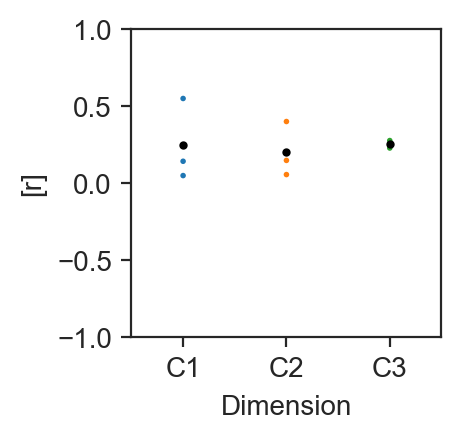

In [21]:
Corr_df2 = pd.DataFrame({"Dimension":['C1']*len(Corr_df['Corr x']) + ['C2']*len(Corr_df['Corr x']) +['C3']*len(Corr_df['Corr z']), 
                        "[r]":list(Corr_df['Corr x'])+list(Corr_df['Corr y'])+list(Corr_df['Corr z'])})

mu_c1 = np.mean(Corr_df2[Corr_df2['Dimension']=='C1'],0)
mu_c2 = np.mean(Corr_df2[Corr_df2['Dimension']=='C2'],0)
mu_c3 = np.mean(Corr_df2[Corr_df2['Dimension']=='C3'],0)

sns.set_style("ticks")
fig = plt.subplots(figsize=(2, 2), dpi=200)
ax = sns.swarmplot(x="Dimension", y="[r]", data=Corr_df2, s=2, zorder=0)
plt.scatter(['C1', 'C2', 'C3'], [mu_c1, mu_c2, mu_c3], c='k', s=4, zorder=1)
plt.ylim(-1,1)
plt.grid(False)
# plt.savefig(SaveTo3 +  'Panel_E_Trial_correlation/dimension_correlation.svg' , bbox_inches="tight")
plt.show()
